<a href="https://colab.research.google.com/github/ksidd98/Covid-19-Forecasting/blob/main/Copy_of_Covid_Demand_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import pandas as pd
import numpy as np
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
import matplotlib.pyplot as plt
pd.options.display.float_format = '{:.3f}'.format


In [ ]:
df = pd.read_csv("time_series_covid19_confirmed_global.csv")


In [ ]:
# df
df = df.drop(df.columns[[0, 2, 3]], axis=1)

In [ ]:
df= df.transpose()
df2 =df
df_global = df
final_table = pd.DataFrame()
final_table_us = pd.DataFrame()
metrics_global = pd.DataFrame()
metrics_us = pd.DataFrame()

## Global Prediction fb_prophet






In [ ]:

six_months = df_global.sum(axis = 1)
six_months = six_months[1:]

a=[]
a.append(six_months[0])
for i in range(len(six_months)-1):
    a.append(six_months[i+1]-six_months[i])


six_months = six_months.reset_index()
six_months.columns =["date","cases"] 
six_months["cases"]=a
# six_months = six_months[1:]
six_months['date'] =  pd.to_datetime(six_months['date']).dt.strftime('%Y-%m-%d')


test = six_months.loc[(six_months["date"]>="2021-01-01") & (six_months["date"]<="2021-01-31")]
six_months =six_months.loc[(six_months["date"]>="2020-06-01") & (six_months["date"]<="2020-12-31")]

six_months




,date,cases
131,2020-06-01,95994
132,2020-06-02,121965
133,2020-06-03,114238
134,2020-06-04,130954
135,2020-06-05,131223
...,...,...
340,2020-12-27,438241
341,2020-12-28,496400
342,2020-12-29,662787
343,2020-12-30,759831


In [ ]:
six_months = six_months.set_index('date')
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled = scaler.fit_transform(six_months.values)
# unscaled = scaler.inverse_transform(scaled)

In [ ]:
six_months['cases']=scaled
six_months = six_months.reset_index()

In [ ]:
# six_months

In [ ]:
model_global = Prophet()
six_months.columns = ['ds', 'y']
model_global.fit(six_months)
p = int(input("Predict for next how many days? "))
future = model_global.make_future_dataframe(periods=p)
forecast = model_global.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
plot_plotly(model_global, forecast)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predict for next how many days? 90


In [ ]:
plot_components_plotly(model_global, forecast)

In [ ]:
temp = pd.DataFrame()
temp['fb_prophet'] = forecast.yhat
predictions = scaler.inverse_transform(temp.values)
temp['fb_prophet'] = predictions

temp = temp.tail(p)
temp['Date'] = forecast['ds']

In [ ]:
temp

,fb_prophet,Date
214,734973.255,2021-01-01
215,702608.806,2021-01-02
216,650622.248,2021-01-03
217,669707.502,2021-01-04
218,712974.702,2021-01-05
...,...,...
299,987596.097,2021-03-27
300,935609.539,2021-03-28
301,954694.793,2021-03-29
302,997961.992,2021-03-30


In [ ]:
test_p = temp['fb_prophet'].head(31)
test_p

214   734973.255
215   702608.806
216   650622.248
217   669707.502
218   712974.702
219   744707.053
220   781566.197
221   758722.196
222   726357.747
223   674371.189
224   693456.443
225   736723.643
226   768455.994
227   805315.138
228   782471.137
229   750106.688
230   698120.130
231   717205.384
232   760472.584
233   792204.935
234   829064.079
235   806220.078
236   773855.629
237   721869.071
238   740954.325
239   784221.524
240   815953.876
241   852813.020
242   829969.018
243   797604.570
244   745618.012
Name: fb_prophet, dtype: float64

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test.cases, test_p)
mse = mean_squared_error(test.cases, test_p)
print(r2)  
print(mse)


-1.2870254270181127
28303342671.899178


In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test.cases, test_p)
print(mae)
metrics_global['fb_prophet'] = [r2,mse,mae]
metrics_global

25.703857669056134


,fb_prophet
0,-1.287
1,28303342671.899
2,25.704


In [ ]:
final_table = temp
# final_table


## Country-Wise fb_prophet

Country US


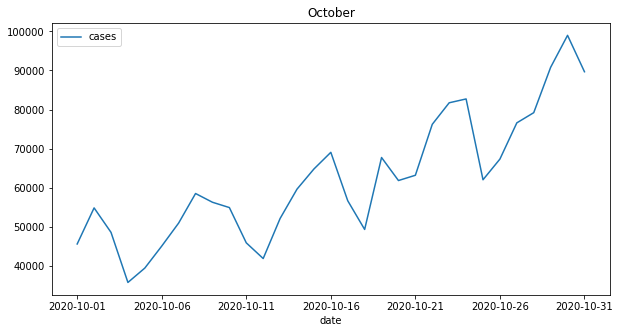

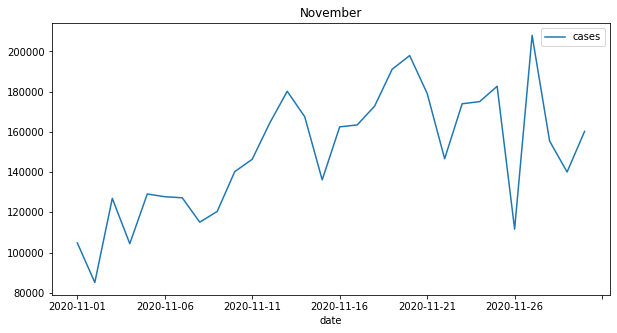

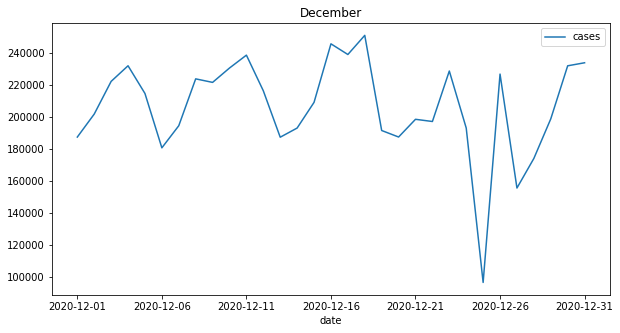

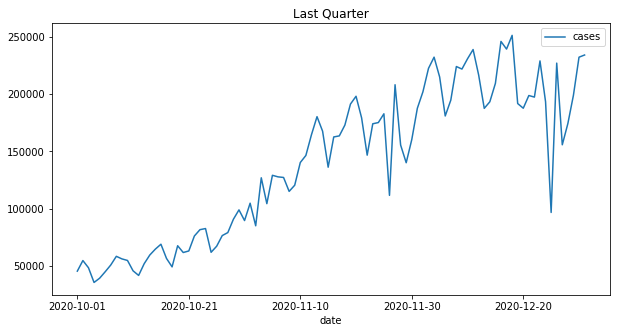

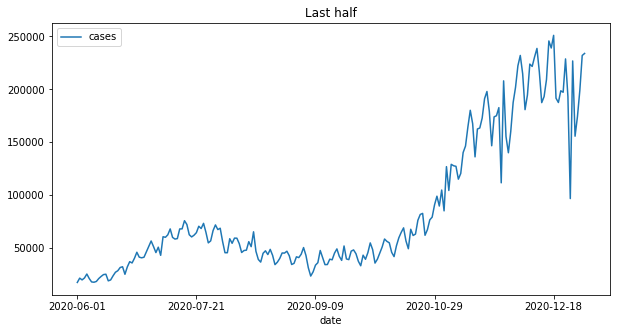

In [ ]:
df2 = df
new_header = df2.iloc[0] #grab the first row for the header
df2 = df2[1:] #take the data less the header row
df2.columns = new_header #set the header row as the df header# df.iloc[0,0]

country=input("Country ")
df1 = df2[country]
a=[]
try:
    if len(df1.columns)>2:
        df1 = df1.sum(axis = 1)
        a.append(df1[0])
        for i in range(len(df1)-1):
            a.append(df1[i+1]-df1[i])
        df1 = df1.reset_index()
        df1.columns =["date","cases"]
        df1["cases"]=a
except:
    a.append(df1[0])
    for i in range(len(df1)-1):
        a.append(df1[i+1]-df1[i])
    df1 = df1.reset_index()
    df1.columns =["date","cases"]
    df1["cases"]=a
df1['date'] =  pd.to_datetime(df1['date']).dt.strftime('%Y-%m-%d')
# # df1


october = df1.loc[(df1["date"]>="2020-10-01") & (df1["date"]<"2020-11-01")]
november = df1.loc[(df1["date"]>="2020-11-01") & (df1["date"]<"2020-12-01")]
december = df1.loc[(df1["date"]>="2020-12-01") & (df1["date"]<"2021-01-01")]
last_quarter = df1.loc[(df1["date"]>="2020-1-01") & (df1["date"]<"2021-01-01")]
six_months = df1.loc[(df1["date"]>="2020-06-01") & (df1["date"]<="2020-12-31")]
test = df1.loc[(df1["date"]>="2021-01-01") & (df1["date"]<="2021-01-31")]

# october


october.plot.line("date","cases",figsize=(10,5),title="October")
november.plot.line("date","cases",figsize=(10,5),title="November")
december.plot.line("date","cases",figsize=(10,5),title="December")
last_quarter.plot.line("date","cases",figsize=(10,5),title="Last Quarter")
six_months.plot.line("date","cases",figsize=(10,5),title="Last half")





In [ ]:
six_months = six_months.set_index('date')
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled = scaler.fit_transform(six_months.values)
# unscaled = scaler.inverse_transform(scaled)

In [ ]:
six_months['cases']=scaled
six_months = six_months.reset_index()
six_months

,date,cases
0,2020-06-01,0.000
1,2020-06-02,0.017
2,2020-06-03,0.010
3,2020-06-04,0.018
4,2020-06-05,0.034
...,...,...
209,2020-12-27,0.592
210,2020-12-28,0.671
211,2020-12-29,0.777
212,2020-12-30,0.919


In [ ]:

#Fb_prophet
# from fbprophet.plot import plot_plotly, plot_components_plotly
model = Prophet()
six_months.columns = ['ds', 'y']
model.fit(six_months)
p = int(input("Predict for next how many days? "))
future = model.make_future_dataframe(periods=p)
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
# fig1 = model.plot(forecast)

# fig2 = model.plot_components(forecast)
plot_plotly(model, forecast)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predict for next how many days? 90


In [ ]:
plot_components_plotly(model, forecast)

In [ ]:
temp = pd.DataFrame()
temp['fb_prophet'] = forecast.yhat
predictions = scaler.inverse_transform(temp.values)
temp['fb_prophet'] = predictions

temp = temp.tail(p)
temp['Date'] = forecast['ds']
temp

,fb_prophet,Date
214,246742.706,2021-01-01
215,241472.356,2021-01-02
216,230499.117,2021-01-03
217,236266.068,2021-01-04
218,246292.558,2021-01-05
...,...,...
299,420385.594,2021-03-27
300,409412.354,2021-03-28
301,415179.305,2021-03-29
302,425205.795,2021-03-30


In [ ]:
# f = forecast.tail(p)
# predictions = f.head(31)
# # predictions
# # test
# # forecast.yhat,test.cases
# f = f[['ds','yhat']]
# f.columns = ['Date','fb_prophet']
test_p = temp['fb_prophet'].head(31)
test_p

214   246742.706
215   241472.356
216   230499.117
217   236266.068
218   246292.558
219   252707.011
220   255713.463
221   261652.142
222   256381.793
223   245408.553
224   251175.504
225   261201.994
226   267616.447
227   270622.899
228   276561.578
229   271291.229
230   260317.989
231   266084.941
232   276111.431
233   282525.884
234   285532.336
235   291471.015
236   286200.666
237   275227.426
238   280994.377
239   291020.867
240   297435.320
241   300441.772
242   306380.451
243   301110.102
244   290136.862
Name: fb_prophet, dtype: float64

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test.cases, test_p)
mse = mean_squared_error(test.cases, test_p)
print(r2)  
print(mse)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test.cases, test_p)
print(mae)
metrics_us['fb_prophet'] = [r2,mse,mae]
metrics_us

-2.925418978537422
8956274230.719288
48.81174065242414


,fb_prophet,ARIMA
0,-2.925,0.581
1,8956274230.719,838122033.829
2,48.812,27.453


In [ ]:
final_table_us

,Date,fb_prophet
214,2021-01-01,247317.755
215,2021-01-02,242035.833
216,2021-01-03,231031.418
217,2021-01-04,236790.170
218,2021-01-05,246843.843
...,...,...
299,2021-03-27,421687.071
300,2021-03-28,410682.655
301,2021-03-29,416441.408
302,2021-03-30,426495.081


## Global Prediction ARIMA


In [ ]:
six_months = df_global.sum(axis = 1)
six_months = six_months[1:]
a=[]
a.append(six_months[0])
for i in range(len(six_months)-1):
    a.append(six_months[i+1]-six_months[i])


six_months = six_months.reset_index()
six_months.columns =["date","cases"] 
six_months["cases"]=a
# six_months = six_months[1:]
six_months['date'] =  pd.to_datetime(six_months['date']).dt.strftime('%Y-%m-%d')
test =six_months.loc[(six_months["date"]>="2021-01-01") & (six_months["date"]<="2021-01-31")]
six_months =six_months.loc[(six_months["date"]>="2020-06-01") & (six_months["date"]<="2020-12-31")]
six_months

,date,cases
131,2020-06-01,95994
132,2020-06-02,121965
133,2020-06-03,114238
134,2020-06-04,130954
135,2020-06-05,131223
...,...,...
340,2020-12-27,438241
341,2020-12-28,496400
342,2020-12-29,662787
343,2020-12-30,759831


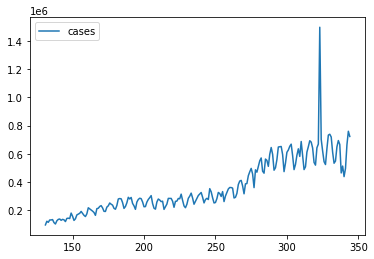

In [ ]:
six_months.plot()

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
six_months_temp = six_months
six_months_temp = six_months_temp.set_index(['date'])
# plot_acf(six_months_temp)


In [ ]:
# n=1
# six_months_temp = six_months_temp.diff(periods=n)
# six_months_temp = six_months_temp[n:]


In [ ]:
# plot_acf(six_months_temp)

In [ ]:
X = six_months_temp.values
train = X
# test = X[201:] 
predictions = []

In [ ]:
# six_months_temp.plot()

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
#p,d,q  p = periods taken for autoregressive model
#d -> Integrated order, difference
# q periods in moving average model
model_arima = ARIMA(train,order=(2, 1, 4))
model_arima_fit = model_arima.fit()
print(model_arima_fit.aic)

5371.897633997678


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



In [ ]:
fi = model_arima_fit.forecast(steps=90)[0]
predictions = fi[:31]

In [ ]:
test = test.set_index('date')


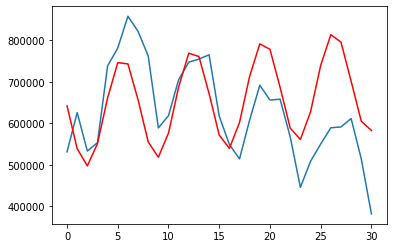

In [ ]:
plt.plot(test.values)
plt.plot(predictions,color='red')

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test, predictions)
mse = mean_squared_error(test, predictions)
print(r2)  
print(mse)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test, predictions)
print(mae)
metrics_global['ARIMA'] = [r2,mse,mae]
metrics_global

-0.00762311203942212
12469954154.100166
20.16301266115846


,fb_prophet,ARIMA
0,-1.287,-0.008
1,28303342671.899,12469954154.100
2,25.704,20.163


In [ ]:
# global_fb
final_table['ARIMA']=fi
final_table

,fb_prophet,Date,ARIMA
214,734973.255,2021-01-01,642035.995
215,702608.806,2021-01-02,539192.166
216,650622.248,2021-01-03,497677.718
217,669707.502,2021-01-04,551392.106
218,712974.702,2021-01-05,661579.674
...,...,...,...
299,987596.097,2021-03-27,748221.457
300,935609.539,2021-03-28,765654.805
301,954694.793,2021-03-29,862502.869
302,997961.992,2021-03-30,967084.136


In [ ]:
# import warnings
# import itertools
# p=d=q=range(0,15)
# pdq = list(itertools.product(p,d,q))
# warnings.filterwarnings('ignore')
# model_arima = ARIMA(train,order=(0,0,0))
# a = model_arima.fit()
# for param in pdq:
#     try:
#         model_arima = ARIMA(train,order=param)
#         model_arima_fit = model_arima.fit()
#         if model_arima_fit.aic<a.aic:
#           a = model_arima_fit
#           print(param,model_arima_fit.aic)
#         else:
#           continue
        
#     except:
#         continue

## Country wise ARIMA


In [ ]:
df2 = df
new_header = df2.iloc[0] #grab the first row for the header
df2 = df2[1:] #take the data less the header row
df2.columns = new_header #set the header row as the df header# df.iloc[0,0]

country=input("Country ")
df1 = df2[country]
a=[]
try:
    if len(df1.columns)>2:
        df1 = df1.sum(axis = 1)
        a.append(df1[0])
        for i in range(len(df1)-1):
            a.append(df1[i+1]-df1[i])
        df1 = df1.reset_index()
        df1.columns =["date","cases"]
        df1["cases"]=a
except:
    a.append(df1[0])
    for i in range(len(df1)-1):
        a.append(df1[i+1]-df1[i])
    df1 = df1.reset_index()
    df1.columns =["date","cases"]
    df1["cases"]=a
df1['date'] =  pd.to_datetime(df1['date']).dt.strftime('%Y-%m-%d')
test =df1.loc[(df1["date"]>="2021-01-01") & (df1["date"]<="2021-01-31")]
df1 =df1.loc[(df1["date"]>="2020-06-01") & (df1["date"]<="2020-12-31")]


df1


Country US


,date,cases
131,2020-06-01,17435
132,2020-06-02,21503
133,2020-06-03,19844
134,2020-06-04,21649
135,2020-06-05,25400
...,...,...
340,2020-12-27,155688
341,2020-12-28,174173
342,2020-12-29,198880
343,2020-12-30,232016


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
df1 = df1.set_index('date')
test = test.set_index('date')

# df1

In [ ]:
X = df1.values
train = X
# test = X[183:] 
predictions = []

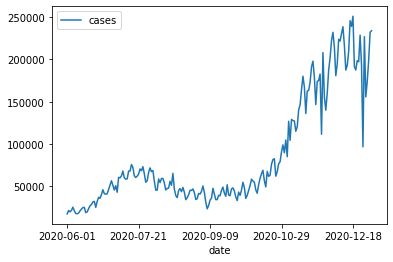

In [ ]:
df1.plot()

In [ ]:
# from statsmodels.tsa.arima_model import ARIMA
# from sklearn.metrics import mean_squared_error

# import warnings
# import itertools
# p=d=q=range(0,9)
# # d= range(0,1)
# pdq = list(itertools.product(p,d,q))
# warnings.filterwarnings('ignore')
# model_arima = ARIMA(train.astype('float32'),order=(0,0,0))
# model_arima_fit = model_arima.fit()
# predictions= model_arima_fit.forecast(steps=31)[0]
# a = mean_squared_error(test,predictions)
# # a = model_arima_fit
# for param in pdq:
#     try:
#         model_arima = ARIMA(train,order=param)
#         model_arima_fit = model_arima.fit()
#         predictions= model_arima_fit.forecast(steps=31)[0]
#         err = mean_squared_error(test,predictions)
# #       if model_arima_fit.aic<a.aic:

#         if err<a:
#           a =  err
#           print(param,err)
#           x=param
#         else:
#           continue
        
#     except:
#         continue
x = (2,0,0)
model_arima = ARIMA(train,order=x)
model_arima_fit = model_arima.fit()
print(model_arima_fit.aic)

4805.9399790780135


In [ ]:
x#(2, 0, 0) 1644430110.6070776


(2, 0, 0)

In [ ]:
fi = model_arima_fit.forecast(steps=90)[0]
predictions = fi[:31]

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


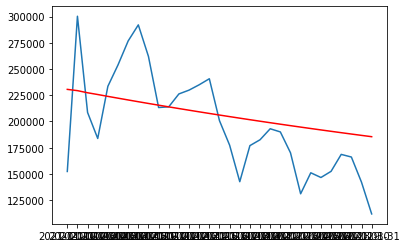

In [ ]:

plt.plot(test)
plt.plot(predictions,color='red')

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test, predictions)
mse = mean_squared_error(test, predictions)
print(r2)  
print(mse)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test, predictions)
print(mae)
metrics_us['ARIMA'] = [r2,mse,mae]
metrics_us

0.2792675839563925
1644430110.6070776
23.662034223549927


,fb_prophet,ARIMA
0,-2.971,0.279
1,9060582039.729,1644430110.607
2,49.105,23.662


In [ ]:
final_table_us['ARIMA']=fi
final_table_us

,Date,fb_prophet,ARIMA
214,2021-01-01,247317.755,230589.883
215,2021-01-02,242035.833,229377.051
216,2021-01-03,231031.418,227354.064
217,2021-01-04,236790.170,225684.843
218,2021-01-05,246843.843,223905.450
...,...,...,...
299,2021-03-27,421687.071,135723.184
300,2021-03-28,410682.655,135097.758
301,2021-03-29,416441.408,134480.095
302,2021-03-30,426495.081,133870.099


In [ ]:
# !pip install pmdarima


In [ ]:
from pmdarima.arima import auto_arima


ImportError: ignored

In [ ]:
df2 = df
new_header = df2.iloc[0] #grab the first row for the header
df2 = df2[1:] #take the data less the header row
df2.columns = new_header #set the header row as the df header# df.iloc[0,0]

country=input("Country ")
df1 = df2[country]
a=[]
try:
    if len(df1.columns)>2:
        df1 = df1.sum(axis = 1)
        a.append(df1[0])
        for i in range(len(df1)-1):
            a.append(df1[i+1]-df1[i])
        df1 = df1.reset_index()
        df1.columns =["date","cases"]
        df1["cases"]=a
except:
    a.append(df1[0])
    for i in range(len(df1)-1):
        a.append(df1[i+1]-df1[i])
    df1 = df1.reset_index()
    df1.columns =["date","cases"]
    df1["cases"]=a
df1['date'] =  pd.to_datetime(df1['date']).dt.strftime('%Y-%m-%d')
df1 =df1.loc[(df1["date"]>="2020-06-01") & (df1["date"]<"2020-12-31")]

df1


Country US


,date,cases
131,2020-06-01,17435
132,2020-06-02,21503
133,2020-06-03,19844
134,2020-06-04,21649
135,2020-06-05,25400
...,...,...
339,2020-12-26,226844
340,2020-12-27,155688
341,2020-12-28,174173
342,2020-12-29,198880


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
df1 = df1.set_index(['date'])
# df1

In [ ]:
df1.plot()

In [ ]:
from pmdarima.arima import ADFTest
adf_test = ADFTest(alpha=0.05)
adf_test.should_diff(df1)  

(0.46064501994981044, True)

In [ ]:
X = df1.values
train = X[0:183] 
test = X[183:] 
predictions = []

In [ ]:
arima_model = auto_arima(train, start_p=2, d=None, start_q=2, max_p=5, max_d=1, max_q=5, start_P=1, D=None, start_Q=1, max_P=2, max_D=1, max_Q=2, max_order=5, m=1, seasonal=True, stationary=False, information_criterion='aic', alpha=0.05, test='kpss', seasonal_test='ocsb', stepwise=True, n_jobs=1, start_params=None, trend=None, method='lbfgs', maxiter=50, offset_test_args=None, seasonal_test_args=None, suppress_warnings=True, error_action='trace', trace=False, random=False, random_state=None, n_fits=50)

In [ ]:
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  183
Model:               SARIMAX(3, 0, 4)   Log Likelihood                -804.295
Date:                Thu, 28 Jan 2021   AIC                           1626.590
Time:                        22:47:43   BIC                           1655.476
Sample:                             0   HQIC                          1638.299
                                - 183                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      9.6233      6.480      1.485      0.138      -3.077      22.323
ar.L1         -0.4502      0.062     -7.303      0.000      -0.571      -0.329
ar.L2          0.4303      0.047      9.116      0.000       0.338       0.523
ar.L3          0.8234      0.052     15.772      0.000       0.721       0.926
ma.L1          0.8452      0.076     11.185      0.000       0.697       0.993
ma.L2          0.4089      0.084      4.882      0.000       0.245       0.573
ma.L3          0.1694      0.095      1.789      0.074      -0.016       0.355
ma.L4          0.3661      0.072      5.075      0.000       0.225       0.507
sigma2       377.4884     33.689     11.205      0.000     311.458     443.518
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                33.85
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.25   Skew:                             0.66
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
predictions= arima_model.predict(n_periods=30)
predictions

array([110.7762525 , 107.53397501,  94.52071068,  97.26549454,
        95.05741811,  86.51721386,  91.67192956,  83.85781878,
        82.56181808,  84.02704226,  76.3753016 ,  79.38352485,
        75.94281908,  72.48575041,  75.0384911 ,  69.56832583,
        70.28292256,  69.70913991,  65.7706918 ,  67.88528466,
        64.76592118,  63.83724388,  64.65414432,  61.3181468 ,
        62.40687226,  61.15374801,  59.43948132,  60.56845791,
        58.29060181,  58.39037358])

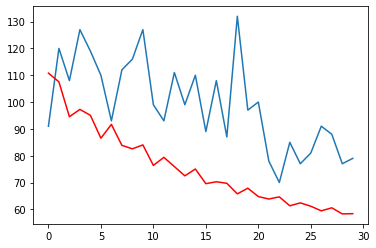

In [ ]:
plt.plot(test)
plt.plot(predictions,color='red')

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
r2_score(test,predictions)
# mean_squared_error(test,predictions)

-1.7709105476741285

## Global Predictions LSTM


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten

In [ ]:
six_months = df_global.sum(axis = 1)
six_months = six_months[1:]
a=[]
a.append(six_months[0])
for i in range(len(six_months)-1):
    a.append(six_months[i+1]-six_months[i])


six_months = six_months.reset_index()
six_months.columns =["date","cases"] 
six_months["cases"]=a
# six_months = six_months[1:]
six_months['date'] =  pd.to_datetime(six_months['date']).dt.strftime('%Y-%m-%d')
t =six_months.loc[(six_months["date"]>="2021-01-01") & (six_months["date"]<="2021-01-31")]
six_months =six_months.loc[(six_months["date"]>="2020-06-01") & (six_months["date"]<="2020-12-31")]
six_months

,date,cases
131,2020-06-01,95994
132,2020-06-02,121965
133,2020-06-03,114238
134,2020-06-04,130954
135,2020-06-05,131223
...,...,...
340,2020-12-27,438241
341,2020-12-28,496400
342,2020-12-29,662787
343,2020-12-30,759831


In [ ]:
def prepare_data(timeseries_data, n_features):
	X, y =[],[]
	for i in range(len(timeseries_data)):
		# find the end of this pattern
		end_ix = i + n_features
		# check if we are beyond the sequence
		if end_ix > len(timeseries_data)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = timeseries_data[i:end_ix], timeseries_data[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return np.array(X), np.array(y)



x = six_months['cases'].values
train = x
test = t['cases'].values
# define input sequence
timeseries_data_train = train
timeseries_data_test = test

# choose a number of time steps
n_steps = 2
# split into samples
train_x, train_y = prepare_data(timeseries_data_train, n_steps)
test_x, test_y = prepare_data(timeseries_data_test, n_steps)

test_x

array([[531461, 626043],
       [626043, 533449],
       [533449, 553626],
       [553626, 738537],
       [738537, 781555],
       [781555, 858062],
       [858062, 821564],
       [821564, 762273],
       [762273, 589167],
       [589167, 618580],
       [618580, 705145],
       [705145, 747577],
       [747577, 754816],
       [754816, 765209],
       [765209, 617419],
       [617419, 549274],
       [549274, 514578],
       [514578, 608369],
       [608369, 691958],
       [691958, 656217],
       [656217, 658340],
       [658340, 567372],
       [567372, 445944],
       [445944, 508737],
       [508737, 550277],
       [550277, 589493],
       [589493, 591505],
       [591505, 611673],
       [611673, 514614]])

In [ ]:
# print(X),print(y)
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1
train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], n_features))


In [ ]:
# define model
model = Sequential()
model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(64, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(train_x, train_y, epochs=1000, verbose=1)

Epoch 1/1000
7/7 [==============================] - 3s 9ms/step - loss: 173366859776.0000
Epoch 2/1000
7/7 [==============================] - 0s 7ms/step - loss: 144822081536.0000
Epoch 3/1000
7/7 [==============================] - 0s 7ms/step - loss: 137145289728.0000
Epoch 4/1000
7/7 [==============================] - 0s 7ms/step - loss: 131669203968.0000
Epoch 5/1000
7/7 [==============================] - 0s 11ms/step - loss: 104380511232.0000
Epoch 6/1000
7/7 [==============================] - 0s 7ms/step - loss: 100838820864.0000
Epoch 7/1000
7/7 [==============================] - 0s 9ms/step - loss: 89903651840.0000
Epoch 8/1000
7/7 [==============================] - 0s 7ms/step - loss: 49427509248.0000
Epoch 9/1000
7/7 [==============================] - 0s 10ms/step - loss: 44117040128.0000
Epoch 10/1000
7/7 [==============================] - 0s 7ms/step - loss: 19817548160.0000
Epoch 11/1000
7/7 [==============================] - 0s 7ms/step - loss: 7193767424.0000
Epoch 12/100

In [ ]:

# temp_input=list(x_input)
n_features = 1
test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], n_features))
out = model.predict(test_x)
print(test_x.shape[0],test_x.shape[1])
# print(test_x)
print(out)

29 2
[[625979.44]
 [521181.16]
 [569090.25]
 [676980.3 ]
 [806822.8 ]
 [885335.06]
 [820975.56]
 [752720.75]
 [572136.25]
 [638291.  ]
 [722191.94]
 [771726.06]
 [768717.8 ]
 [780384.2 ]
 [601223.06]
 [537978.4 ]
 [510019.1 ]
 [606700.06]
 [709849.94]
 [653414.4 ]
 [668981.3 ]
 [554692.9 ]
 [433526.5 ]
 [520747.12]
 [567889.8 ]
 [608444.9 ]
 [601103.6 ]
 [628005.56]
 [502399.47]]


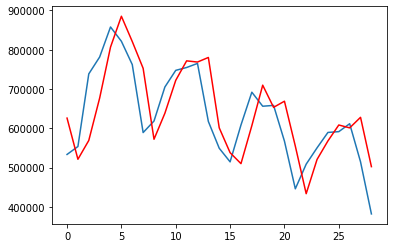

In [ ]:
plt.plot(test_y)
plt.plot(out,color='red')

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test_y, out)
mse = mean_squared_error(test_y, out)
print(r2)  
print(mse)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test_y, out)
print(mae)
metrics_global['LSTM'] = [r2,mse,mae]
metrics_global

0.46475816051162655
6905391533.059234
21.13723627798321


,ARIMA,LSTM
0,0.465,0.465
1,6905391533.059,6905391533.059
2,21.137,21.137


In [ ]:
nn = []
all = []
test_new = np.array([[out[-1][0],out[-2][0]]])
test_new = test_new.reshape(1, 2, 1)
o = model.predict(test_new)
nn.append(o[0][0])
all.append([o[0][0]])
test_new1 = np.array([[out[-2][0],o[0][0]]])
test_new1 = test_new1.reshape(1, 2, 1)
o1 = model.predict(test_new1)
nn.append(o1[0][0])
all.append([o1[0][0]])
for i in range(59):
  t = np.array([nn])
  t = t.reshape((1,2,1))
  ou = model.predict(t)
  nn = nn[1:]
  nn.append(ou[0][0])
  all.append([ou[0][0]])
  print(nn)
print("########")
print(all)
print("#########")


[596435.06, 595074.25]
[595074.25, 597364.4]
[597364.4, 598304.1]
[598304.1, 599748.6]
[599748.6, 601009.75]
[601009.75, 602342.9]
[602342.9, 603653.25]
[603653.25, 604975.94]
[604975.94, 606298.0]
[606298.0, 607624.25]
[607624.25, 608952.94]
[608952.94, 610284.6]
[610284.6, 611619.2]
[611619.2, 612956.7]
[612956.7, 614297.06]
[614297.06, 615640.4]
[615640.4, 616986.56]
[616986.56, 618335.75]
[618335.75, 619687.8]
[619687.8, 621042.8]
[621042.8, 622400.75]
[622400.75, 623761.7]
[623761.7, 625125.5]
[625125.5, 626492.3]
[626492.3, 627862.1]
[627862.1, 629234.9]
[629234.9, 630610.6]
[630610.6, 631989.4]
[631989.4, 633371.2]
[633371.2, 634755.9]
[634755.9, 636143.7]
[636143.7, 637534.5]
[637534.5, 638928.25]
[638928.25, 640325.1]
[640325.1, 641725.0]
[641725.0, 643127.9]
[643127.9, 644533.9]
[644533.9, 645942.8]
[645942.8, 647355.0]
[647355.0, 648770.06]
[648770.06, 650188.3]
[650188.3, 651609.56]
[651609.56, 653034.0]
[653034.0, 654461.44]
[654461.44, 655892.1]
[655892.1, 657325.8]
[6573

In [ ]:
final = np.concatenate((out,all))
final_table['LSTM']=final

In [ ]:
from datetime import datetime
d = pd.date_range(start="2021-01-01",end="2021-03-31")
f = pd.DataFrame()

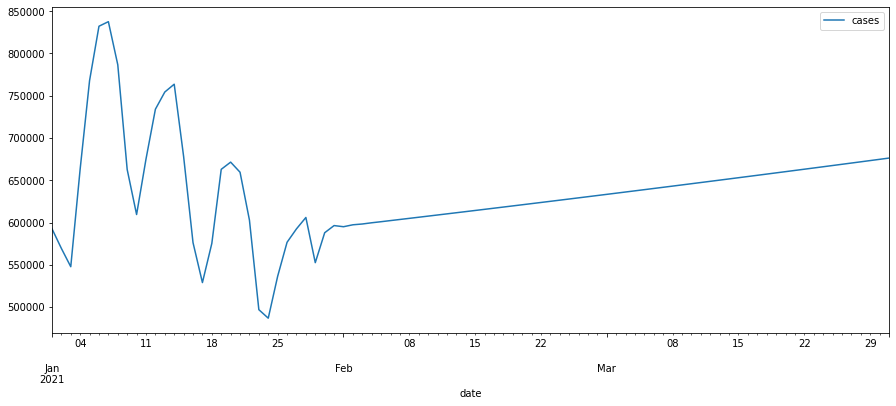

In [ ]:
f['date']=d
f['cases']=final
f = f.set_index('date')
f.plot(figsize=(15,6))


In [ ]:
final_table

,fb_prophet,Date,ARIMA,LSTM
214,734973.255,2021-01-01,642035.995,592759.938
215,702608.806,2021-01-02,539192.166,569470.188
216,650622.248,2021-01-03,497677.718,547786.188
217,669707.502,2021-01-04,551392.106,663377.688
218,712974.702,2021-01-05,661579.674,767903.625
...,...,...,...,...
299,987596.097,2021-03-27,748221.457,670370.312
300,935609.539,2021-03-28,765654.805,671835.500
301,954694.793,2021-03-29,862502.869,673303.875
302,997961.992,2021-03-30,967084.136,674775.375


## Country Wise LSTM model

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten

In [ ]:
df2 = df
new_header = df2.iloc[0] #grab the first row for the header
df2 = df2[1:] #take the data less the header row
df2.columns = new_header #set the header row as the df header# df.iloc[0,0]

country=input("Country ")
df1 = df2[country]
a=[]
try:
    if len(df1.columns)>2:
        df1 = df1.sum(axis = 1)
        a.append(df1[0])
        for i in range(len(df1)-1):
            a.append(df1[i+1]-df1[i])
        df1 = df1.reset_index()
        df1.columns =["date","cases"]
        df1["cases"]=a
except:
    a.append(df1[0])
    for i in range(len(df1)-1):
        a.append(df1[i+1]-df1[i])
    df1 = df1.reset_index()
    df1.columns =["date","cases"]
    df1["cases"]=a
df1['date'] =  pd.to_datetime(df1['date']).dt.strftime('%Y-%m-%d')
t =df1.loc[(df1["date"]>="2021-01-01") & (df1["date"]<="2021-01-31")]
df1 =df1.loc[(df1["date"]>="2020-06-01") & (df1["date"]<="2020-12-31")]

# df1
# t

Country US


In [ ]:
def prepare_data(timeseries_data, n_features):
	X, y =[],[]
	for i in range(len(timeseries_data)):
		# find the end of this pattern
		end_ix = i + n_features
		# check if we are beyond the sequence
		if end_ix > len(timeseries_data)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = timeseries_data[i:end_ix], timeseries_data[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return np.array(X), np.array(y)



x = df1['cases'].values
train = x
test = t['cases'].values
# define input sequence
timeseries_data_train = train
timeseries_data_test = test

# choose a number of time steps
n_steps = 2
# split into samples
train_x, train_y = prepare_data(timeseries_data_train, n_steps)
test_x, test_y = prepare_data(timeseries_data_test, n_steps)

test_x

array([[152344, 300282],
       [300282, 208556],
       [208556, 183790],
       [183790, 233526],
       [233526, 253917],
       [253917, 276738],
       [276738, 292044],
       [292044, 261974],
       [261974, 213281],
       [213281, 213963],
       [213963, 226238],
       [226238, 229871],
       [229871, 234975],
       [234975, 240707],
       [240707, 200764],
       [200764, 177404],
       [177404, 142605],
       [142605, 176984],
       [176984, 182579],
       [182579, 193055],
       [193055, 190032],
       [190032, 170138],
       [170138, 131075],
       [131075, 151095],
       [151095, 146597],
       [146597, 152478],
       [152478, 168620],
       [168620, 166113],
       [166113, 142091]])

In [ ]:
# print(X),print(y)
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1
train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], n_features))


In [ ]:
# define model
model = Sequential()
model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(64, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(train_x, train_y, epochs=600, verbose=1)

Epoch 1/600
7/7 [==============================] - 3s 8ms/step - loss: 10574980480.0000
Epoch 2/600
7/7 [==============================] - 0s 7ms/step - loss: 9142220160.0000
Epoch 3/600
7/7 [==============================] - 0s 7ms/step - loss: 9240329280.0000
Epoch 4/600
7/7 [==============================] - 0s 7ms/step - loss: 6721796992.0000
Epoch 5/600
7/7 [==============================] - 0s 7ms/step - loss: 4930752352.0000
Epoch 6/600
7/7 [==============================] - 0s 8ms/step - loss: 3495375712.0000
Epoch 7/600
7/7 [==============================] - 0s 7ms/step - loss: 2103433120.0000
Epoch 8/600
7/7 [==============================] - 0s 8ms/step - loss: 920039560.0000
Epoch 9/600
7/7 [==============================] - 0s 7ms/step - loss: 335929724.0000
Epoch 10/600
7/7 [==============================] - 0s 8ms/step - loss: 485608220.0000
Epoch 11/600
7/7 [==============================] - 0s 7ms/step - loss: 473447848.0000
Epoch 12/600
7/7 [==========================

In [ ]:

# temp_input=list(x_input)
n_features = 1
test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], n_features))
out = model.predict(test_x)
print(test_x.shape[0],test_x.shape[1])
# print(test_x)
print(out)

29 2
[[244845.14]
 [226762.  ]
 [186012.58]
 [221065.3 ]
 [252045.75]
 [274643.72]
 [290627.16]
 [264665.1 ]
 [219397.52]
 [213879.86]
 [225104.69]
 [229518.7 ]
 [234488.95]
 [240163.36]
 [204889.14]
 [179500.34]
 [147318.78]
 [169098.02]
 [182056.03]
 [192089.11]
 [190287.36]
 [171921.92]
 [137369.78]
 [148742.23]
 [146991.94]
 [151933.45]
 [167145.2 ]
 [166325.1 ]
 [144258.2 ]]


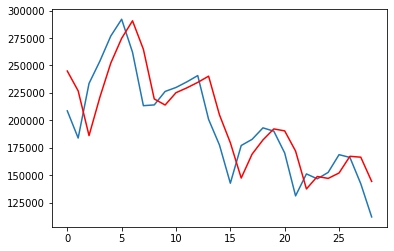

In [ ]:
plt.plot(test_y)
plt.plot(out,color='red')

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score
r2 = r2_score(test_y, out)
mse = mean_squared_error(test_y, out)
print(r2)  
print(mse)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mae = mean_absolute_percentage_error(test_y, out)
print(mae)
metrics_us['LSTM'] = [r2,mse,mae]
metrics_us

0.651613883252034
697072699.6375353
27.24475711894556


,ARIMA
0,0.652
1,697072699.638
2,27.245


In [ ]:
final = np.concatenate((out,all))
# plt.plot(test_y)
# plt.plot(final,color='red')
final_table_us['LSTM']=final

ValueError: ignored

In [ ]:
from datetime import datetime
d = pd.date_range(start="2021-01-01",end="2021-03-31")
f = pd.DataFrame()

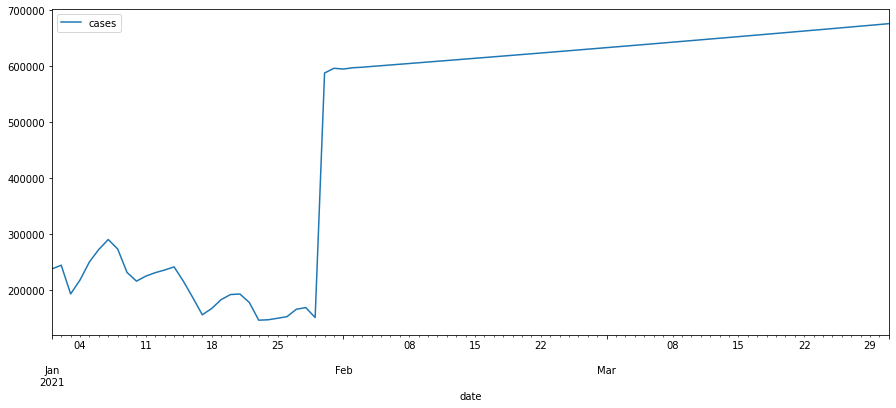

In [ ]:
f['date']=d
f['cases']=final
f = f.set_index('date')
f.plot(figsize=(15,6))

In [ ]:
final_table_us

,Date,fb_prophet,ARIMA,LSTM
214,2021-01-01,247317.755,230589.883,237434.719
215,2021-01-02,242035.833,229377.051,244095.594
216,2021-01-03,231031.418,227354.064,192736.094
217,2021-01-04,236790.170,225684.843,217716.250
218,2021-01-05,246843.843,223905.450,250109.031
...,...,...,...,...
299,2021-03-27,421687.071,135723.184,670370.312
300,2021-03-28,410682.655,135097.758,671835.500
301,2021-03-29,416441.408,134480.095,673303.875
302,2021-03-30,426495.081,133870.099,674775.375


## Regression


In [ ]:
df2 = df
new_header = df2.iloc[0] #grab the first row for the header
df2 = df2[1:] #take the data less the header row
df2.columns = new_header #set the header row as the df header# df.iloc[0,0]

country=input("Country ")
df1 = df2[country]
a=[]
try:
    if len(df1.columns)>2:
        df1 = df1.sum(axis = 1)
        a.append(df1[0])
        for i in range(len(df1)-1):
            a.append(df1[i+1]-df1[i])
        df1 = df1.reset_index()
        df1.columns =["date","cases"]
        df1["cases"]=a
except:
    a.append(df1[0])
    for i in range(len(df1)-1):
        a.append(df1[i+1]-df1[i])
    df1 = df1.reset_index()
    df1.columns =["date","cases"]
    df1["cases"]=a
df1['date'] =  pd.to_datetime(df1['date'])
df1 =df1.loc[(df1["date"]>="2020-06-01") & (df1["date"]<"2020-12-31")]

# df1


Country India


In [ ]:
a=[]
for i in range(1,len(df1)+1):
  a.append(i)
df1['date']=a

MSE: 630846245.5913724


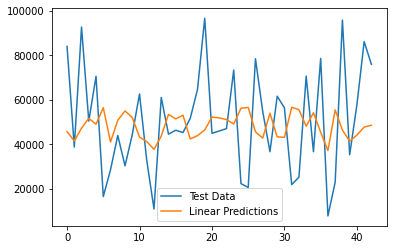

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import auc, accuracy_score, mean_squared_error
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold, RandomizedSearchCV
import numpy as np

X_train, X_test, y_train, y_test = train_test_split(np.array(df1['date']), np.array(df1['cases']), test_size=0.2)
Lreg = LinearRegression(normalize=True).fit(X_train.reshape(-1,1), y_train.reshape(-1,1))

# check against testing data
m_pred = Lreg.predict(X_test.reshape(-1,1))
plt.plot(y_test)
plt.plot(m_pred)
plt.legend(['Test Data', 'Linear Predictions'])
# print('MAE:', mean_absolute_error(m_pred, y_test))
print('MSE:',mean_squared_error(m_pred, y_test))

In [ ]:
# from sklearn.linear_model import Ridge

# reg = Ridge(alpha=9.0).fit(X_train.reshape(-1,1), y_train.reshape(-1,1))

# # check against testing data
# m_pred = reg.predict(X_test.reshape(-1,1))
# plt.plot(y_test)
# plt.plot(m_pred)
# plt.legend(['Test Data', 'Ridge Predictions'])
# # print('MAE:', mean_absolute_error(m_pred, y_test_confirmed))
# print('MSE:',mean_squared_error(m_pred, y_test))

## Global Age summarized dataset


In [ ]:
n = pd.read_csv('COVID-19_Cases_Summarized_by_Age_Group.csv')

In [ ]:
n

,Specimen Collection Date,Age Group,New Confirmed Cases,Cumulative Confirmed Cases,Last Updated at
0,2020/03/13,25-29,3,7,01/20/2021 02:15:10 PM
1,2020/03/14,25-29,2,9,01/20/2021 02:15:10 PM
2,2020/03/15,25-29,1,10,01/20/2021 02:15:10 PM
3,2020/03/16,25-29,1,11,01/20/2021 02:15:10 PM
4,2020/03/17,25-29,0,11,01/20/2021 02:15:10 PM
...,...,...,...,...,...
3967,2021/01/14,14-17,9,837,01/20/2021 02:15:10 PM
3968,2021/01/15,14-17,5,842,01/20/2021 02:15:10 PM
3969,2021/01/16,14-17,3,845,01/20/2021 02:15:10 PM
3970,2021/01/17,14-17,0,845,01/20/2021 02:15:10 PM


In [ ]:
n.drop(n.iloc[:, 4:], inplace = True, axis = 1) 
n = n.drop(n.columns[[3]],axis=1)


In [ ]:
n['Age Group'] = n['Age Group'].astype('string')

# n = n.loc[(df1["date"]=="70-75")]
# n.head(100)
n['Age Group']

0       25-29
1       25-29
2       25-29
3       25-29
4       25-29
        ...  
3967    14-17
3968    14-17
3969    14-17
3970    14-17
3971    14-17
Name: Age Group, Length: 3972, dtype: string

In [ ]:
n.columns = ['date','age','cases']
n['date'] =  pd.to_datetime(n['date']).dt.strftime('%Y-%m-%d')


In [ ]:
sixties = n.loc[(n["age"]=="60-69")]
seventies = n.loc[(n["age"]=="70-79")]
eighties = n.loc[(n["age"]>"70-79")&(n["age"]!="Unknown")]


sixties = sixties.drop(sixties.columns[[1]],axis=1)
seventies = seventies.drop(seventies.columns[[1]],axis=1)
eighties = eighties.drop(eighties.columns[[1]],axis=1)

eighties

,date,cases
2769,2020-03-18,1
2770,2020-03-19,1
2771,2020-03-20,0
2772,2020-03-21,1
2773,2020-03-22,2
...,...,...
3071,2021-01-14,8
3072,2021-01-15,22
3073,2021-01-16,10
3074,2021-01-17,2


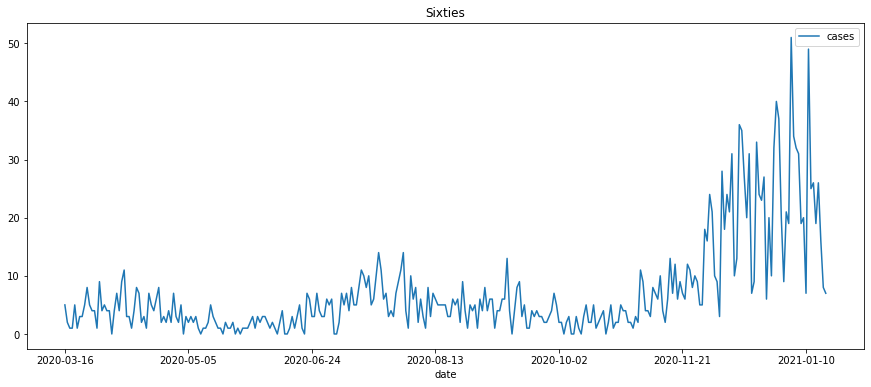

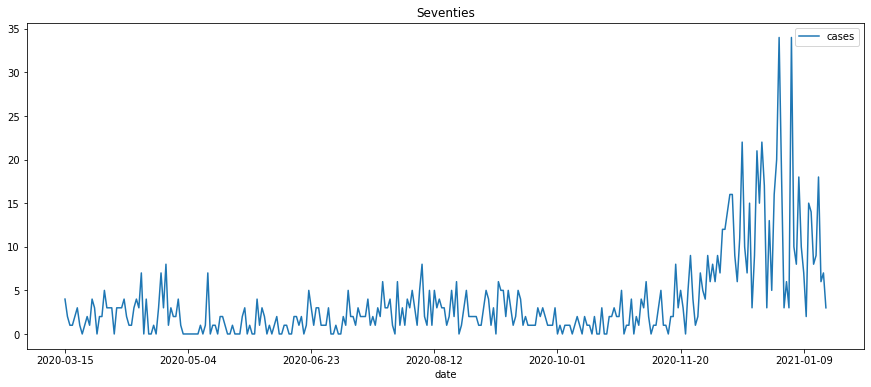

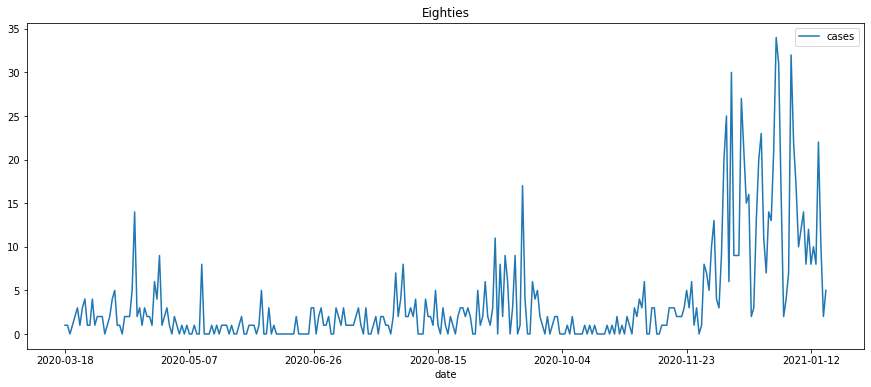

In [ ]:
sixties.set_index('date').plot(figsize=(15,6),title="Sixties")
seventies.set_index('date').plot(figsize=(15,6),title="Seventies")
eighties.set_index('date').plot(figsize=(15,6),title="Eighties")

In [ ]:
model_sixties = Prophet()
sixties.columns = ['ds', 'y']
model_sixties.fit(sixties)
future = model_sixties.make_future_dataframe(periods=int(input("Predict for next how many days? ")))
forecast = model_sixties.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
plot_plotly(model_sixties, forecast)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predict for next how many days? 60


In [ ]:
plot_components_plotly(model_sixties, forecast)


In [ ]:
model_seventies = Prophet()
seventies.columns = ['ds', 'y']
model_seventies.fit(seventies)
future = model_seventies.make_future_dataframe(periods=int(input("Predict for next how many days? ")))
forecast = model_seventies.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
plot_plotly(model_seventies, forecast)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predict for next how many days? 100


In [ ]:
plot_components_plotly(model_seventies, forecast)


In [ ]:
model_eighties = Prophet()
eighties.columns = ['ds', 'y']
model_eighties.fit(eighties)
future = model_eighties.make_future_dataframe(periods=int(input("Predict for next how many days? ")))
forecast = model_eighties.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
plot_plotly(model_eighties, forecast)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predict for next how many days? 100


In [ ]:
plot_components_plotly(model_eighties, forecast)

## Auto ARIMA global

```
# This is formatted as code
```



In [ ]:
# ! pip install pmdarima

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2790.529, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3383.671, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2840.664, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3173.052, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2791.007, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2791.266, Time=0.20 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=3058.103, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2805.906, Time=0.06 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2793.025, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2791.235, Time=0.22 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 1.408 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(1, 0, 1)   Log Likelihood        

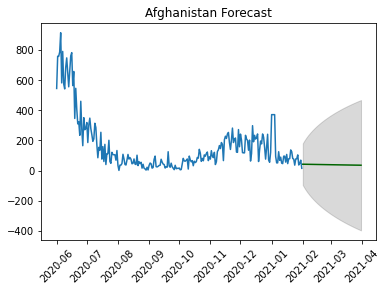

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2807.211, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2857.457, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2809.477, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2805.324, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2855.898, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2807.278, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2808.485, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2805.514, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.059 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1399.662
Date:                Fri, 05 Feb 2021   AIC                           2805.324
Time:                        14:47:1

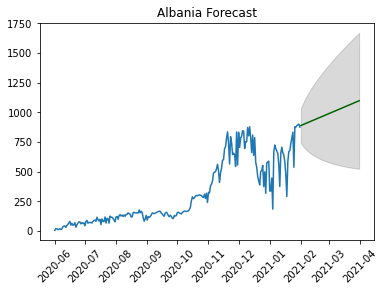

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=2433.742, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=2679.562, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=2506.309, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=2467.773, Time=0.15 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=2677.562, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=2434.808, Time=0.25 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=2433.767, Time=0.21 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=2438.927, Time=0.15 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=2485.225, Time=0.14 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=2435.233, Time=0.45 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=2431.746, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=2465.790, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=2504.313, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=2432.813, Time=0.13 sec
 ARIMA(1,2,2)(0,0,0)[0]          

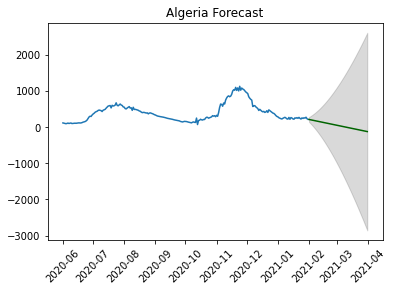

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2083.482, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2184.816, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2127.843, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2081.727, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2182.840, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2083.478, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2084.538, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2080.153, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2081.939, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2081.936, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2125.859, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2083.936, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.360 seconds
                               SARIMAX Results                                
Dep. Vari

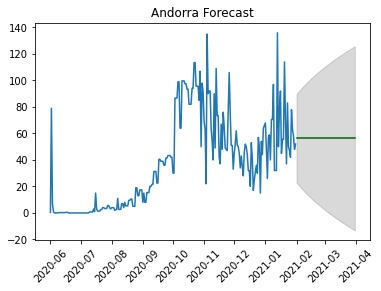

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2471.727, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2585.607, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2507.803, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2471.079, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2583.607, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2471.772, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2471.683, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2469.176, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2469.813, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2469.857, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2505.808, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2469.772, Time=0.12 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.216 seconds
                               SARIMAX Results                                
Dep. Vari

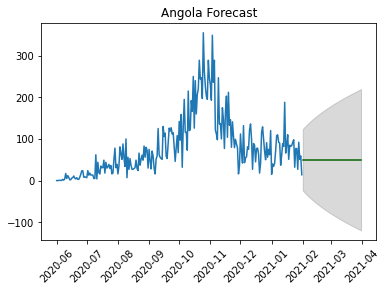

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=889.320, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=911.844, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=908.986, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=906.962, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=910.277, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=891.241, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=891.266, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=899.543, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=910.005, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=893.227, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=888.425, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=905.423, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=907.429, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=890.354, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=890.3

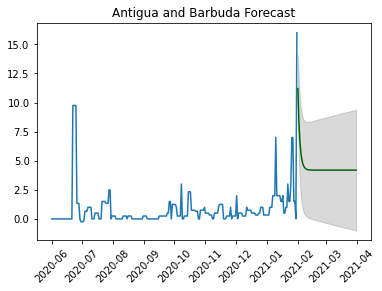

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4338.096, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4349.260, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4342.604, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4336.904, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4347.287, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4307.702, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4292.825, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4205.779, Time=0.57 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4261.404, Time=0.49 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4203.334, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4249.488, Time=0.36 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=4164.311, Time=0.86 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4227.724, Time=0.47 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=4147.544, Time=0.62 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept

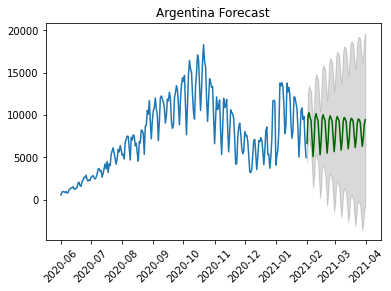

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3421.923, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3453.078, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3454.408, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3453.060, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3451.078, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3399.588, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3431.265, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3399.257, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3427.704, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3379.819, Time=0.57 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3412.285, Time=0.09 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3339.733, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3353.448, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3260.540, Time=1.21 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

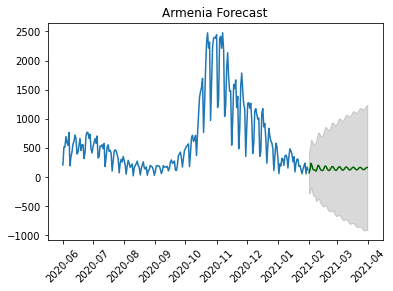

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2606.557, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2708.456, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2659.056, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2608.441, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2706.456, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2572.953, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2572.133, Time=0.14 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2573.640, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2574.390, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2570.134, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2657.057, Time=0.04 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=2571.641, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2570.954, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.557, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]          

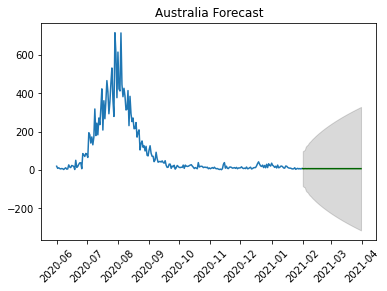

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3765.044, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3770.941, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3771.370, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3770.442, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3768.962, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3738.156, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3760.851, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3730.754, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3749.991, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3710.300, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3712.539, Time=0.13 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3708.960, Time=0.27 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3707.020, Time=0.14 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=3705.196, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]          

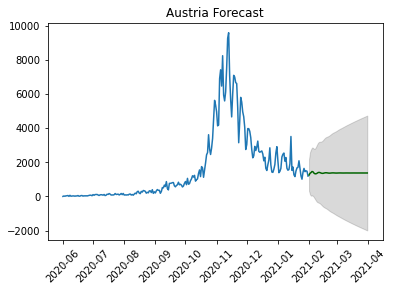

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=3456.721, Time=0.36 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=3768.618, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=3607.348, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=3766.621, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=3450.240, Time=0.36 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=3546.172, Time=0.07 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=3448.446, Time=0.55 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=3512.505, Time=0.08 sec
 ARIMA(4,2,1)(0,0,0)[0] intercept   : AIC=3448.508, Time=0.71 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=3442.882, Time=0.73 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(4,2,2)(0,0,0)[0] intercept   : AIC=3419.552, Time=0.95 sec
 ARIMA(5,2,2)(0,0,0)[0] intercept   : AIC=3411.120, Time=1.18 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=3

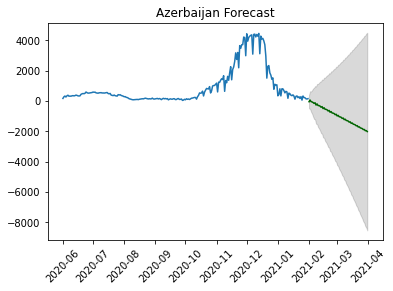

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2315.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2423.381, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2387.970, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2314.530, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2421.381, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2314.487, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2302.233, Time=0.17 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2302.778, Time=0.37 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2302.670, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2306.010, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2311.226, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2302.485, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2300.244, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2312.498, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[0]          

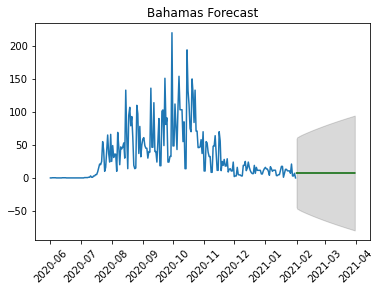

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2801.781, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2885.317, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2825.545, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2800.892, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2883.318, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2801.504, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2801.368, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2798.891, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2799.780, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2799.506, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2823.547, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2799.383, Time=0.16 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.225 seconds
                               SARIMAX Results                                
Dep. Vari

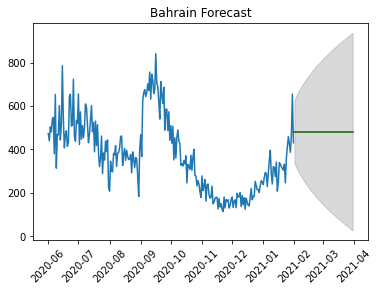

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3433.661, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3460.775, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3457.755, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3453.921, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3458.975, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3430.914, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3452.087, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3428.685, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3444.263, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3426.986, Time=0.60 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3438.974, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3416.200, Time=0.42 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3417.995, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3392.488, Time=1.08 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

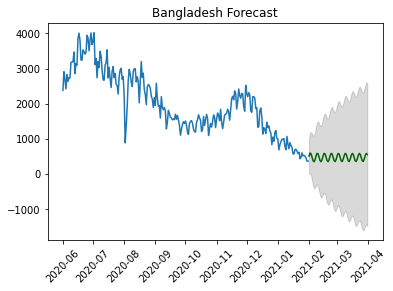

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1833.098, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1911.661, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1856.485, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1834.105, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1909.674, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1830.226, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1848.576, Time=0.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1832.155, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1824.837, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1831.449, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1826.825, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1817.234, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1832.944, Time=0.18 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : 

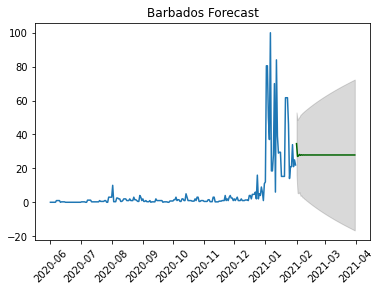

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.610, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2988.935, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2982.548, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2976.548, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2987.223, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2967.205, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2975.426, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2968.148, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2969.599, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2967.784, Time=0.31 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2973.511, Time=0.07 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2970.733, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2966.430, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2966.781, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]          

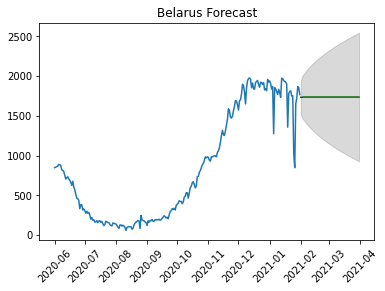

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4250.231, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4254.544, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4255.638, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4254.793, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4252.556, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4229.194, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4239.410, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4230.304, Time=0.20 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4182.087, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4234.426, Time=0.53 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4232.572, Time=0.72 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4185.940, Time=0.90 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4226.540, Time=0.48 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=4187.309, Time=0.87 sec
 ARIMA(2,1,2)(0,0,0)[0]          

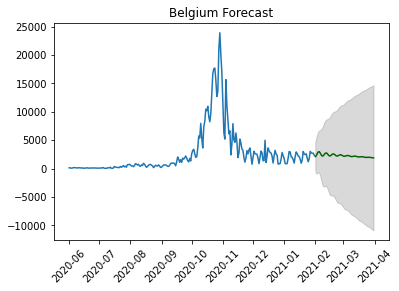

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2580.035, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2627.618, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2603.284, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2591.976, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2625.618, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2581.328, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2581.655, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2584.421, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2602.689, Time=0.14 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2578.078, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2579.096, Time=0.53 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2579.144, Time=0.61 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2577.893, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2579.410, Time=0.20 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept

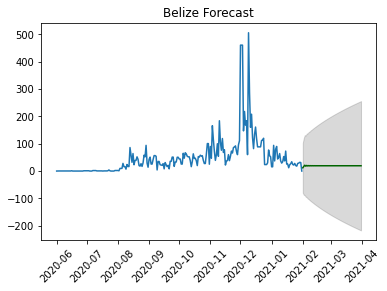

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1994.975, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2087.200, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2022.379, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1993.402, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2085.203, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1995.103, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1996.964, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1991.506, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1993.091, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1993.215, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2020.394, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1995.064, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.153 seconds
                               SARIMAX Results                                
Dep. Vari

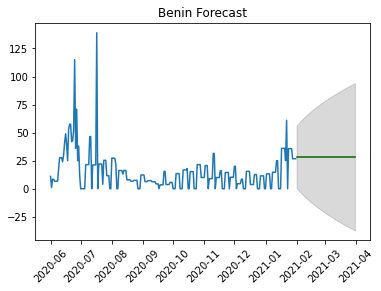

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1409.220, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1621.551, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1459.084, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1539.113, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1408.971, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1415.977, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1409.735, Time=0.14 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1410.944, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1409.069, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1408.307, Time=0.06 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=1410.254, Time=0.08 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=inf, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1405.542, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1411.115, Time=0.10 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : 

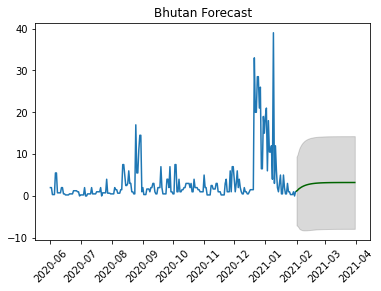

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3426.665, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3462.497, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3454.141, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3450.986, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3460.537, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3426.637, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3455.455, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3406.253, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3446.644, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3382.525, Time=0.65 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3404.891, Time=0.13 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3378.398, Time=0.61 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3382.447, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3367.480, Time=1.10 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

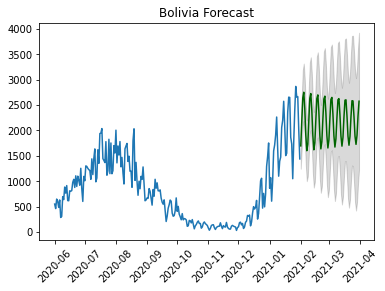

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3254.674, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3291.783, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3289.005, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3275.735, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3289.783, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3242.069, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3268.258, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3242.305, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3182.771, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3246.207, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3180.877, Time=0.88 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=3137.034, Time=0.91 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3227.573, Time=0.42 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3117.295, Time=1.20 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept

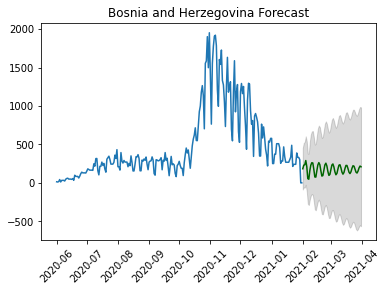

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2953.509, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3141.047, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2994.517, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3061.038, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2948.540, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2970.543, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2947.738, Time=0.35 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2964.479, Time=0.08 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=2949.502, Time=0.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2947.717, Time=0.36 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2951.505, Time=0.21 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=2949.550, Time=0.51 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=2949.527, Time=0.27 sec
 ARIMA(3,0,3)(0,0,0)[0]             : 

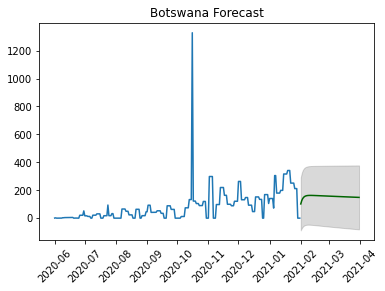

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5314.122, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5364.282, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5366.179, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5366.062, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5362.289, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5287.812, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5352.185, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5281.201, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5344.945, Time=0.11 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5247.304, Time=0.26 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5311.822, Time=0.13 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5192.687, Time=0.32 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=5225.674, Time=0.24 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=5148.580, Time=0.90 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

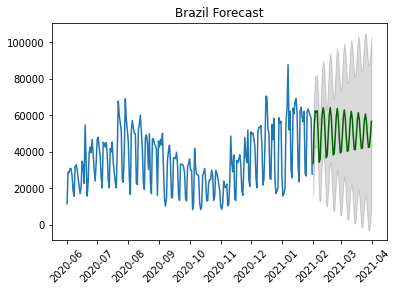

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=161.156, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=407.256, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=160.868, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=241.165, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=161.244, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=153.805, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=155.794, Time=0.23 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=155.796, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=162.959, Time=0.10 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=163.190, Time=0.15 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=157.562, Time=0.52 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=153.118, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=160.238, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=160.291, Time=0.12 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=155.0

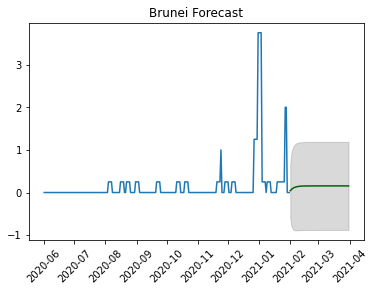

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3802.266, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3825.944, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3827.377, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3817.349, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3823.946, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3749.202, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3750.406, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3751.094, Time=0.17 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3715.066, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3729.541, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3717.094, Time=0.69 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3704.012, Time=0.81 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3699.971, Time=0.80 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3728.187, Time=0.46 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept

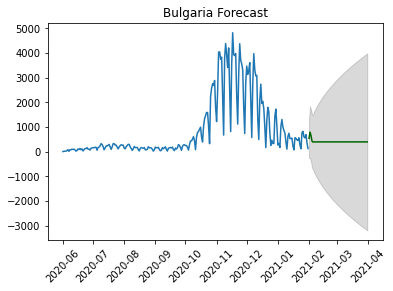

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2369.680, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2469.274, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2411.925, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2367.684, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2467.299, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2369.680, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2371.670, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2366.268, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2368.260, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2368.259, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2410.022, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2369.928, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.336 seconds
                               SARIMAX Results                                
Dep. Vari

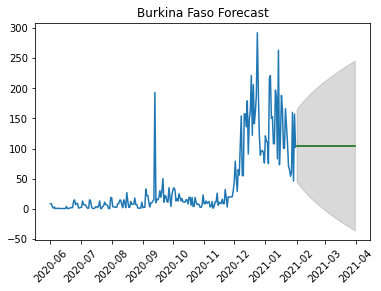

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3128.981, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3178.610, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3143.449, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3128.224, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3176.622, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3129.094, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3132.223, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3126.317, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3127.091, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3127.202, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3141.480, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3130.316, Time=0.10 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.417 seconds
                               SARIMAX Results                                
Dep. Vari

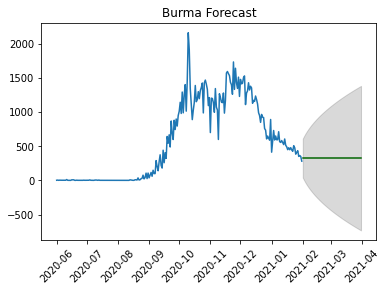

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1681.334, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1770.937, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1752.852, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1682.762, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1768.955, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1656.095, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1676.048, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1656.953, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1655.759, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1663.664, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1657.120, Time=0.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1655.741, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1654.324, Time=0.26 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1652.541, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept

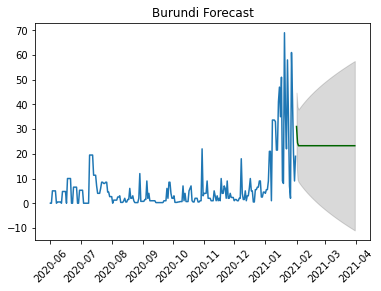

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2257.429, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2359.395, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2317.026, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2257.730, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2357.415, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2258.678, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2259.085, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2257.184, Time=0.16 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2258.939, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2259.060, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2256.100, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2256.575, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2257.994, Time=0.17 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=2257.833, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]          

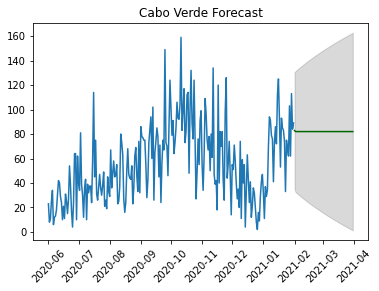

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1040.909, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1206.117, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1038.966, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1090.384, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1040.929, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1042.526, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1026.968, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1139.985, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1027.725, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1027.468, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1049.586, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1029.371, Time=0.21 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.816 seconds
                               SARIMAX Results                                
Dep. Vari

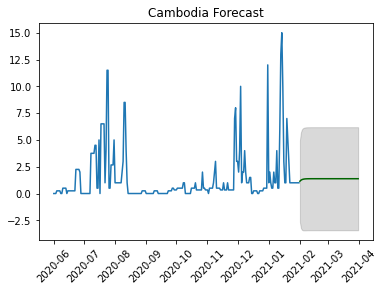

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2996.352, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3174.261, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3003.626, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3073.288, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2976.778, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2998.172, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2978.699, Time=0.45 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2978.718, Time=0.39 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2984.970, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2998.602, Time=0.05 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2981.672, Time=0.10 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0]          
Total fit time: 2.163 seconds
                               SARIMAX Results                                
Dep. Variable:

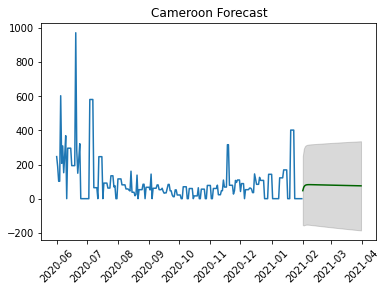

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4130.273, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4225.459, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4210.105, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4130.696, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4223.479, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4096.149, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4134.021, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4098.138, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4074.690, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4104.428, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4090.688, Time=0.88 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4072.782, Time=0.82 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4072.416, Time=0.76 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4071.760, Time=0.56 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept

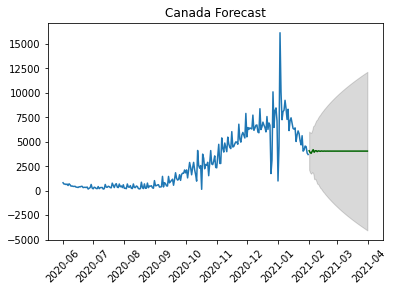

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2216.806, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2320.195, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2292.049, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2217.918, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2318.213, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2210.316, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2254.588, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2212.095, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2206.638, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2214.944, Time=0.28 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2213.155, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2200.737, Time=0.67 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2205.602, Time=0.64 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : 

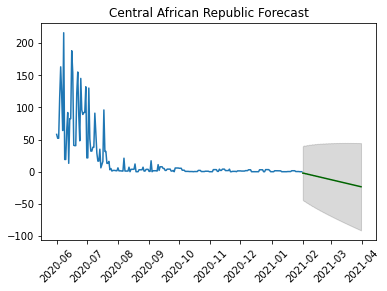

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1709.337, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1829.879, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1764.739, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1709.778, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1827.890, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1704.825, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1713.653, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1706.034, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1698.422, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1704.680, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1699.373, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1697.131, Time=0.41 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1697.142, Time=0.32 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=1698.875, Time=0.88 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept

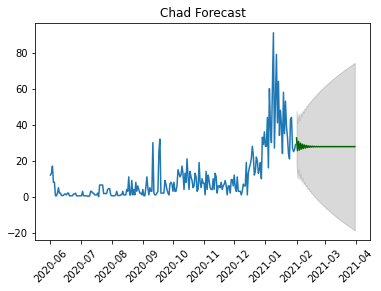

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3984.412, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4058.835, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4032.175, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3991.969, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4056.844, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3984.705, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3983.653, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3985.620, Time=0.50 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3978.490, Time=0.83 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3974.142, Time=0.76 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=4049.063, Time=0.91 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=4129.949, Time=0.99 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=4

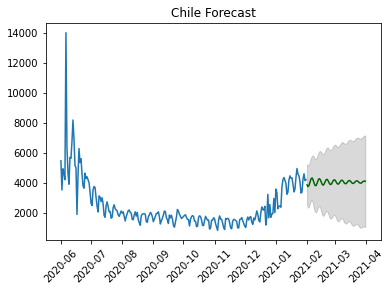

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2209.650, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2261.517, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2222.247, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2209.424, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2259.568, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2205.545, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2210.392, Time=0.18 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2192.448, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2191.725, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2189.865, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2188.610, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2188.519, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2191.927, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2186.012, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept

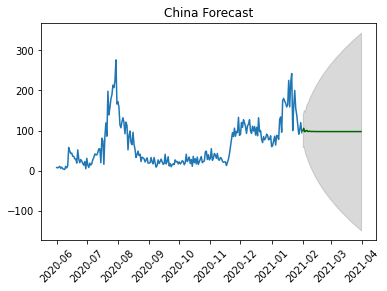

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4233.870, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4253.611, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4250.338, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4247.705, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4251.706, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4233.169, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4248.175, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4228.835, Time=0.19 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4239.237, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4226.066, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4230.209, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4220.966, Time=0.32 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4218.961, Time=0.14 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=4218.023, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0]          

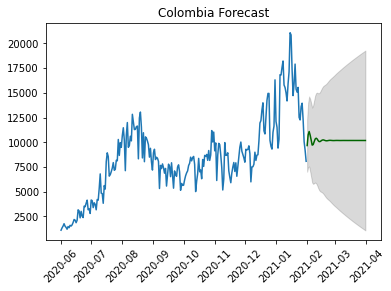

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2204.679, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2361.569, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2281.000, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2207.694, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2359.569, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2204.396, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2261.193, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2178.146, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2182.258, Time=0.14 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2178.060, Time=0.46 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2180.201, Time=0.19 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2180.046, Time=0.60 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=2180.035, Time=0.64 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2178.104, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept

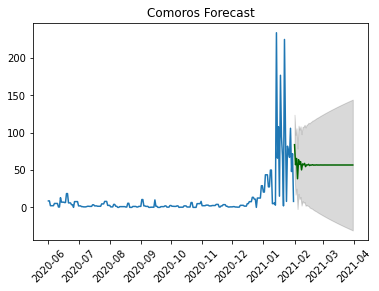

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2411.044, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2616.687, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2409.490, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2486.423, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2411.078, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2392.821, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2513.453, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2394.511, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2394.555, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2423.065, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2396.298, Time=0.44 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 1.514 seconds
                               SARIMAX Results                                
Dep. Variable:

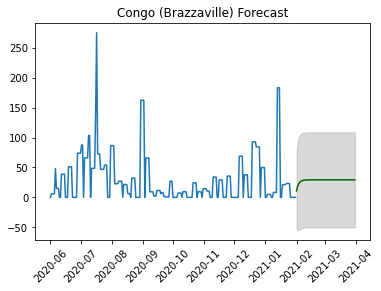

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2569.054, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2658.792, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2626.520, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2573.152, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2656.795, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2569.734, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2570.516, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2568.516, Time=0.16 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2570.515, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2567.566, Time=0.63 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2549.027, Time=0.84 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2570.389, Time=0.49 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2551.187, Time=0.97 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=2564.312, Time=0.90 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept

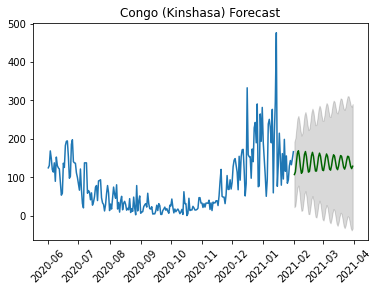

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3265.446, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3306.516, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3306.219, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3305.358, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3304.516, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3252.743, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3305.963, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3219.352, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3282.705, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3194.514, Time=0.61 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3238.493, Time=0.13 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3177.246, Time=0.62 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3195.127, Time=0.45 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : 

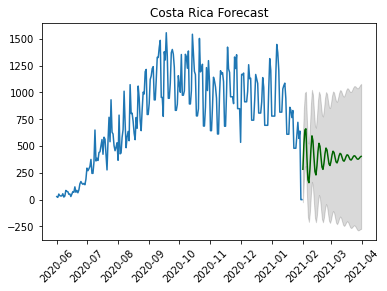

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2678.031, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2747.909, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2708.765, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2679.618, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2745.919, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2679.979, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2678.888, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2678.204, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2693.448, Time=0.16 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2679.854, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2676.194, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2677.765, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2706.796, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2678.141, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0]          

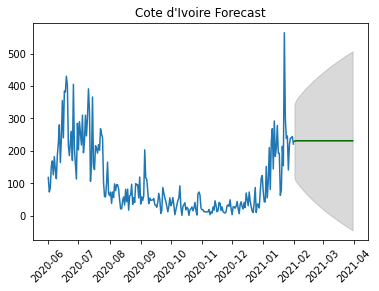

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3690.083, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3701.202, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3698.603, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3692.307, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3699.206, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3618.657, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3665.843, Time=0.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3614.742, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3655.861, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3585.297, Time=0.46 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3622.325, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3533.767, Time=0.61 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3533.346, Time=0.16 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=3531.441, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0]          

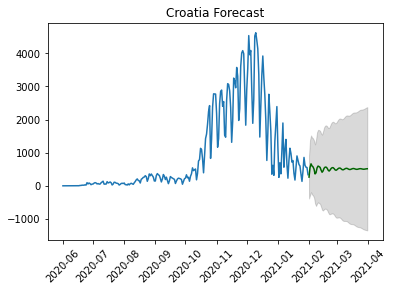

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2558.827, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2584.515, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2563.923, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2556.914, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2584.204, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2558.772, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2560.578, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2559.162, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.225 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1275.457
Date:                Fri, 05 Feb 2021   AIC                           2556.914
Time:                        14:52:1

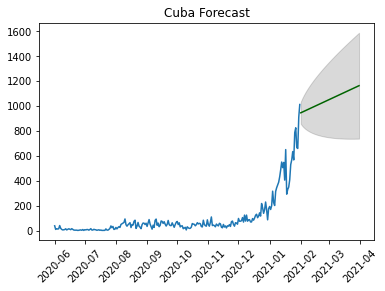

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2851.503, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2901.301, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2892.119, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2868.370, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2899.306, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2846.996, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2879.823, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2842.534, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2863.346, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2838.175, Time=0.47 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2839.989, Time=0.30 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2833.403, Time=1.06 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=2837.259, Time=0.37 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=2834.362, Time=1.19 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

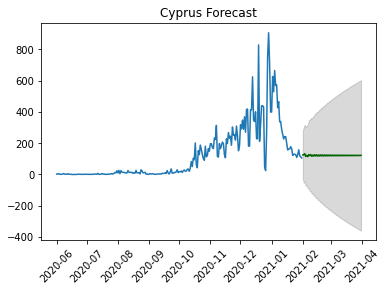

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4431.775, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4454.840, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4454.215, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4452.026, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4452.856, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4389.198, Time=0.58 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4437.661, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4385.624, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4425.848, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4358.370, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4391.666, Time=0.13 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4318.761, Time=0.29 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4319.866, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=4294.625, Time=0.63 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

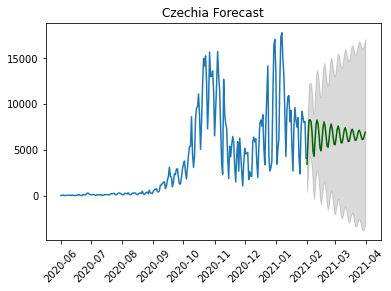

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3416.604, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3478.861, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3415.966, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3418.023, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3476.868, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3417.305, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3416.725, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3413.983, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=3415.325, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3414.628, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3416.060, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=3414.775, Time=0.14 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.084 seconds
                               SARIMAX Results                                
Dep. Vari

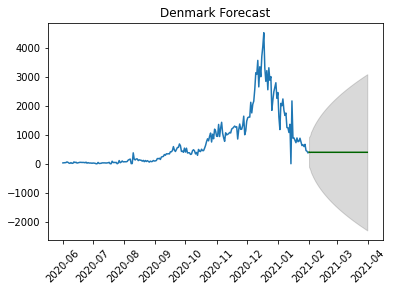

/usr/local/lib/python3.6/dist-packages/pmdarima/arima/auto.py:460: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

invalid value encountered in double_scalars

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning:

invalid value encountered in true_divide



 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5189.054, Time=0.02 sec
Total fit time: 0.025 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:                        SARIMAX   Log Likelihood                2595.527
Date:                Fri, 05 Feb 2021   AIC                          -5189.054
Time:                        14:52:35   BIC                          -5185.552
Sample:                             0   HQIC                         -5187.644
                                - 245                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2          1e-10   1.27e-10      0.790      0.430   -1.48e-10    3.48e-10
Ljung-Box (L1) (Q):               

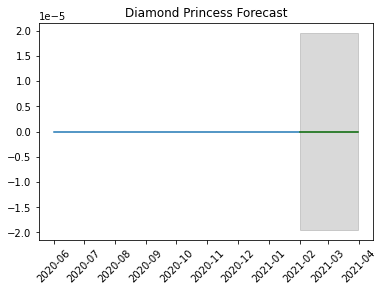

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1959.791, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2324.064, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1982.377, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2193.458, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1941.090, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1938.160, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=1940.104, Time=0.37 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1935.891, Time=0.45 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1936.357, Time=0.19 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=1941.632, Time=0.52 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=1938.985, Time=0.44 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1937.904, Time=0.27 sec
 ARIMA(4,0,3)(0,0,0)[0]             : AIC=1

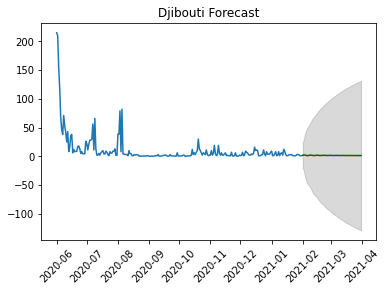

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=592.328, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=702.230, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=610.188, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=647.671, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=594.327, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=594.327, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=624.156, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=594.876, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=596.296, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=588.034, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=621.086, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=598.414, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=589.616, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=589.641, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=660.5

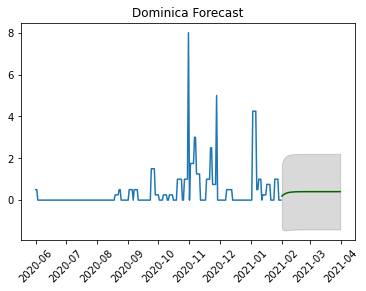

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3475.480, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3558.372, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3533.722, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3479.883, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3556.421, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3472.305, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3505.656, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3474.110, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3465.608, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3463.613, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3472.897, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3465.606, Time=0.63 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3467.981, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3466.502, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]          

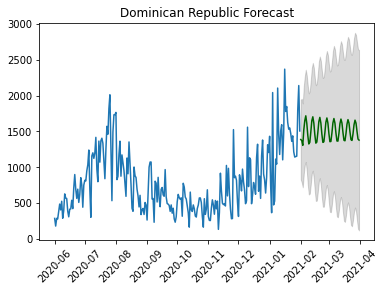

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3857.656, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4118.932, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3919.326, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4004.457, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=3848.087, Time=0.47 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=3971.197, Time=0.09 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=3849.943, Time=0.46 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=3849.880, Time=0.39 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=3956.731, Time=0.14 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=3848.161, Time=0.50 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3845.130, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=3843.373, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3841.792, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : 

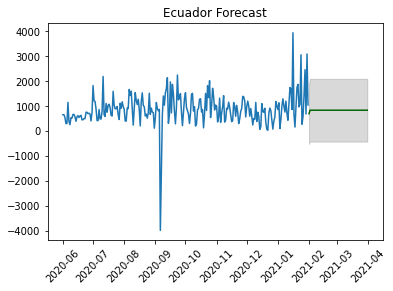

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2839.993, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2839.901, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2840.071, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2839.265, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2838.371, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.608 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1418.185
Date:                Fri, 05 Feb 2021   AIC                           2838.371
Time:                        14:53:09   BIC                           2841.868
Sample:                             0   HQIC                          2839.779
                                - 245                                       

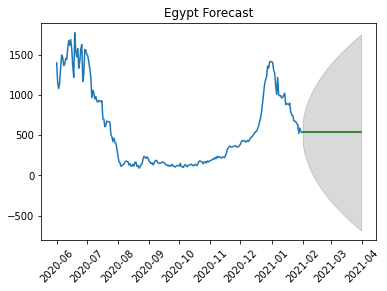

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2368.174, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2380.820, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2372.232, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2367.803, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2378.953, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2367.209, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2368.785, Time=0.18 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2368.340, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2369.384, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2365.537, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2366.074, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2367.105, Time=0.11 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=2366.639, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2366.490, Time=0.06 sec
 ARIMA(1,1,3)(0,0,0)[0]          

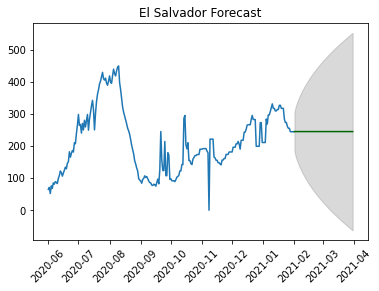

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2559.910, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2761.775, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2561.483, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2600.058, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2533.374, Time=0.37 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2593.802, Time=0.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2532.569, Time=0.56 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2587.769, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2558.998, Time=0.23 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.63 s

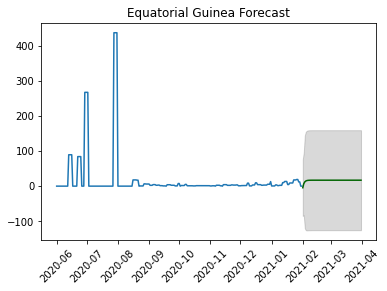

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1978.586, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2038.815, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2030.880, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2018.204, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2036.815, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1977.474, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2026.726, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1973.357, Time=0.34 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2015.704, Time=0.12 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=1973.332, Time=0.40 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=1988.383, Time=0.23 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=1972.184, Time=0.54 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=1989.626, Time=0.27 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=1967.685, Time=0.57 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

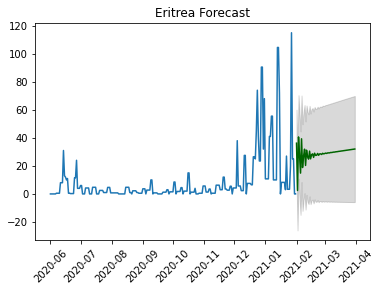

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2915.717, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2979.644, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2978.215, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2944.494, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2977.718, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2894.613, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2962.615, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2885.442, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2956.212, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2850.490, Time=0.56 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2924.802, Time=0.29 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2817.641, Time=0.80 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=2854.494, Time=0.42 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=2808.742, Time=1.18 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

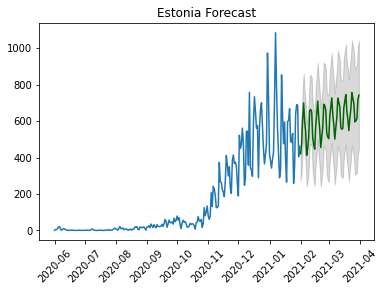

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2299.834, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2339.460, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.224, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2293.719, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2337.467, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2293.965, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2293.920, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2292.235, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2297.893, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2292.675, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2296.307, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2292.280, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.456 seconds
                               SARIMAX Results                                
Dep. Vari

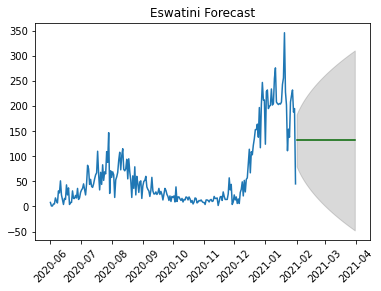

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3124.611, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3188.754, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3131.051, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3124.301, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3186.798, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3124.788, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3126.472, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3122.544, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3122.833, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3123.014, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3129.177, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3124.699, Time=0.15 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.709 seconds
                               SARIMAX Results                                
Dep. Vari

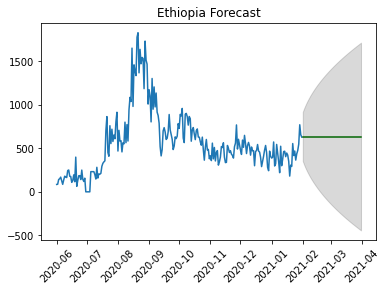

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-35.386, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=189.478, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-36.147, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=27.974, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-35.563, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-32.147, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-40.971, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=142.491, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-41.768, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-42.271, Time=0.19 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=-46.044, Time=0.18 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=-67.340, Time=0.27 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=-65.340, Time=0.55 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=-64.922, Time=0.46 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=-62.89

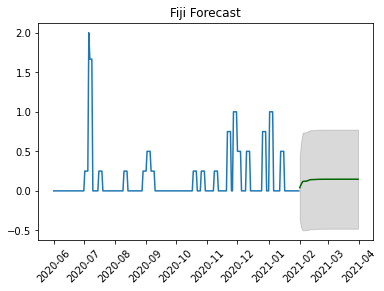

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2747.576, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2804.658, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2791.018, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2763.579, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2802.742, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2745.716, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2784.935, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2735.975, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2767.280, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2732.488, Time=0.56 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2751.799, Time=0.28 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2728.541, Time=0.75 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=2740.697, Time=0.36 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=2702.685, Time=1.13 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

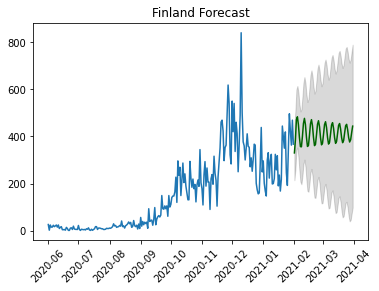

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5164.033, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5261.623, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5201.556, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5162.463, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5259.636, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5164.606, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5164.832, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5160.313, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5161.955, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=5161.919, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5199.592, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=5162.733, Time=0.29 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.449 seconds
                               SARIMAX Results                                
Dep. Vari

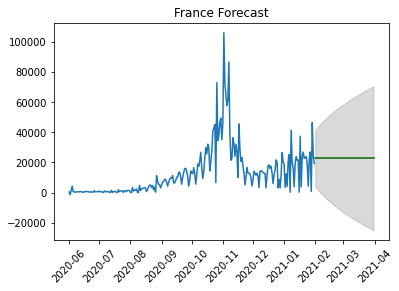

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2170.362, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2207.549, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2198.530, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2192.655, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2205.570, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2171.625, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2171.888, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2173.134, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2195.785, Time=0.20 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2153.394, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2154.821, Time=0.43 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2156.790, Time=0.43 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2169.618, Time=0.34 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : 

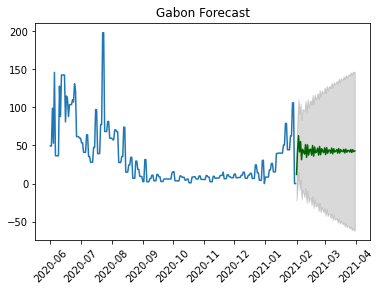

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2089.231, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2139.861, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2124.815, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2096.898, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2137.861, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2085.955, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2106.235, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2086.583, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2084.029, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2087.743, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2084.412, Time=0.71 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2071.706, Time=0.86 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2081.528, Time=0.65 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2073.261, Time=0.99 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept

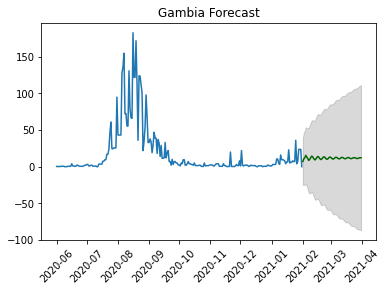

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3647.809, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3693.898, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3680.048, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3653.416, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3691.904, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3642.024, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3659.444, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3642.363, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3606.264, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3645.633, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3606.528, Time=0.81 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3608.021, Time=0.93 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3644.278, Time=0.40 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3608.708, Time=0.95 sec
 ARIMA(2,1,2)(0,0,0)[0]          

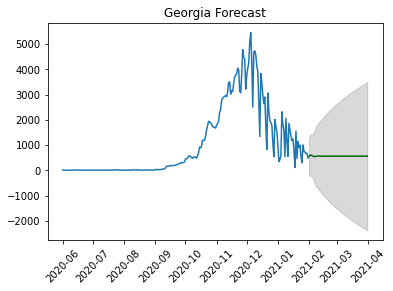

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4953.778, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5030.416, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5014.949, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4965.813, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5028.418, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4949.879, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5010.628, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4933.578, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4993.355, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4913.830, Time=0.25 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4969.549, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4882.542, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4921.348, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=4854.657, Time=0.72 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

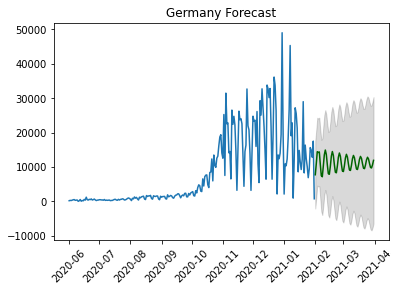

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3224.349, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3316.009, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3280.982, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3222.361, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3314.201, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3224.332, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3221.218, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3209.478, Time=0.34 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3209.112, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3214.963, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3209.400, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3212.568, Time=0.09 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3211.184, Time=0.52 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=3208.057, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]          

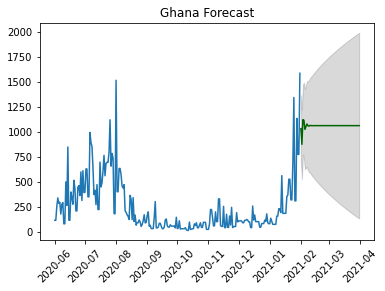

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3370.037, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.595, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3383.683, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3383.007, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.611, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3340.729, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3371.254, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3332.203, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3355.462, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3322.041, Time=0.42 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3337.781, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3294.490, Time=0.55 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3292.628, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=3290.977, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]          

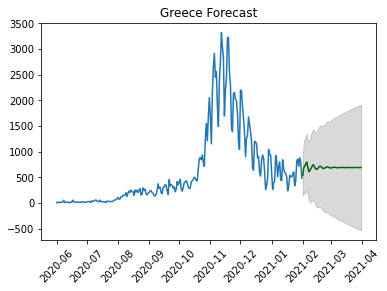

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=466.782, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=859.441, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=466.415, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=659.387, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=466.626, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=468.502, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=466.317, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=826.111, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=466.110, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=467.575, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=467.874, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=466.351, Time=0.19 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=469.512, Time=0.31 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 1.561 seconds
                               SARI

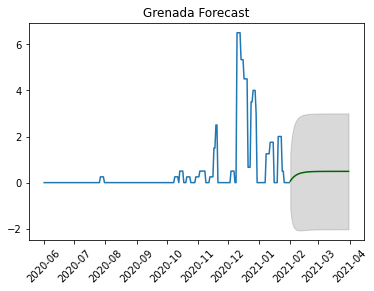

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3578.019, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3683.040, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3660.673, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3582.108, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3681.042, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3571.046, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3631.551, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3571.690, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3559.973, Time=0.60 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3574.512, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3562.552, Time=0.54 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=3558.2

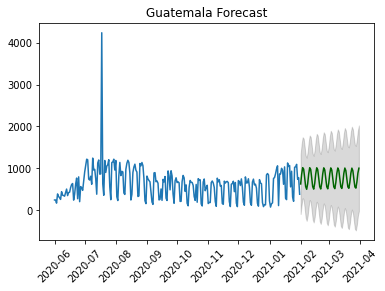

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2305.655, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2644.300, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2365.894, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2508.930, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2294.640, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2348.960, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2295.853, Time=0.27 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2296.046, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2294.228, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2448.171, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=2295.961, Time=0.30 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2431.879, Time=0.11 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=2293.561, Time=0.35 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2293.425, Time=0.46 sec
 ARIMA(3,0,2)(0,0,0)[0]          

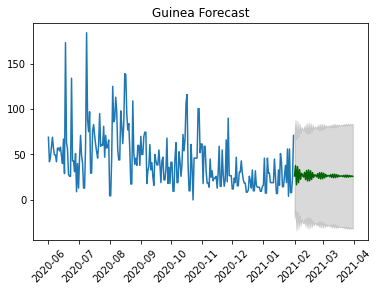

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1397.218, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1418.071, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1420.059, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1420.054, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1416.072, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1390.734, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1416.631, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1391.411, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1391.837, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1391.992, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1416.011, Time=0.13 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1391.523, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1388.900, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1395.441, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]          

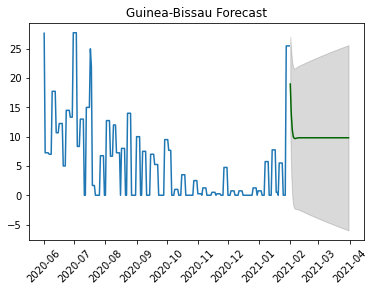

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2166.067, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2280.344, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2211.716, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2164.872, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2278.367, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2166.220, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2162.249, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2160.464, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2166.117, Time=0.28 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2162.406, Time=0.61 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2169.948, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2163.673, Time=0.34 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2163.175, Time=0.96 sec
 ARIMA(2,1,2)(0,0,0)[0]             : 

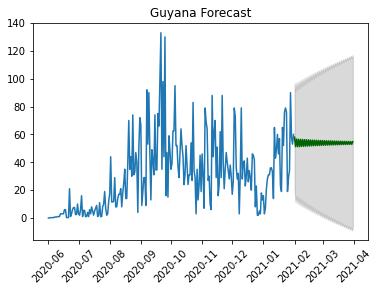

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2364.923, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2505.365, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2421.357, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2366.159, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2503.472, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2370.404, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2364.822, Time=0.13 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2366.774, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2365.184, Time=0.09 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0] intercept
Total fit time: 2.789 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:

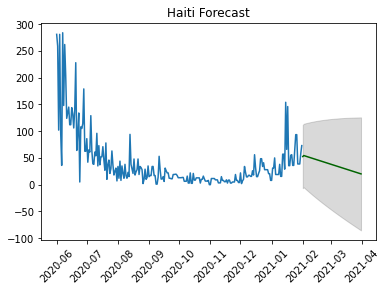

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-183.734, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=175.162, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-185.059, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=6.438, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-184.060, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-189.725, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-200.332, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-192.784, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=-198.397, Time=0.55 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-209.574, Time=0.40 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-199.566, Time=0.19 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=-207.649, Time=0.59 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=-199.417, Time=0.48 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-191.096, Time=0.48 sec
 ARIMA(4,0,3)(0,0,0)[0]             :

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

divide by zero encountered in double_scalars



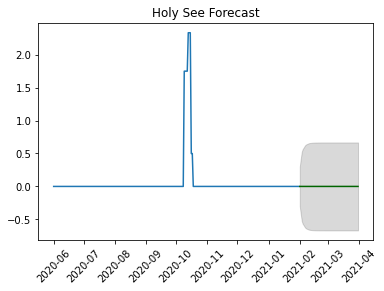

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3370.886, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3867.575, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3454.731, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3683.644, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3372.529, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=3372.502, Time=0.24 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=3624.388, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3410.040, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=3371.292, Time=0.42 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3365.703, Time=0.42 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3415.310, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3394.895, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3367.698, Time=0.52 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3367.811, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept

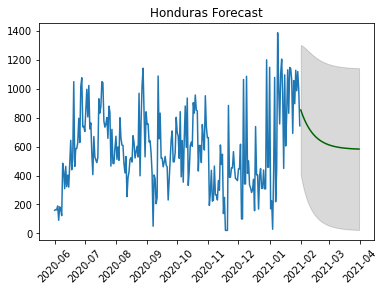

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3791.994, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3808.499, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3809.952, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3809.429, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3806.521, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3765.365, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3793.598, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3763.965, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3789.849, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3740.777, Time=0.48 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3756.022, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3731.877, Time=0.30 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3731.102, Time=0.15 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=3729.258, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0]          

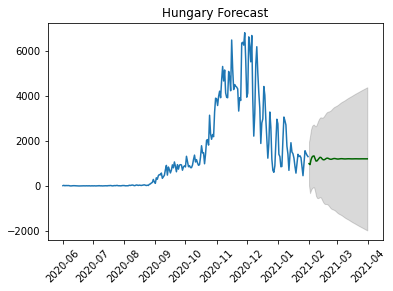

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1832.429, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1889.740, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1846.357, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1830.748, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1887.740, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1832.254, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1833.636, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1828.748, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1830.429, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1830.254, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1844.357, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1831.636, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.086 seconds
                               SARIMAX Results                                
Dep. Vari

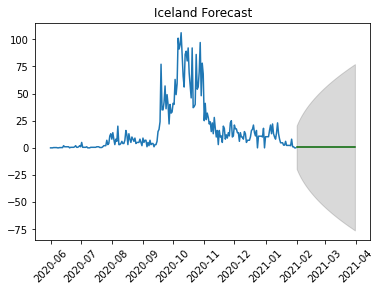

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4853.568, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4879.564, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4873.214, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4861.308, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4877.568, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4847.051, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4851.295, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4848.959, Time=0.22 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4848.608, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4847.917, Time=0.20 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4851.678, Time=0.11 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4850.919, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=4845.079, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4851.592, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]          

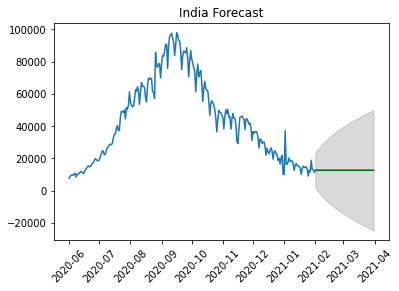

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3860.020, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3897.759, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3886.842, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3878.659, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3896.851, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3860.562, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3861.467, Time=0.57 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3863.564, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3887.828, Time=0.05 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3846.616, Time=0.73 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3822.922, Time=0.79 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3837.977, Time=0.65 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=3822.789, Time=0.92 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3839.957, Time=0.50 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept

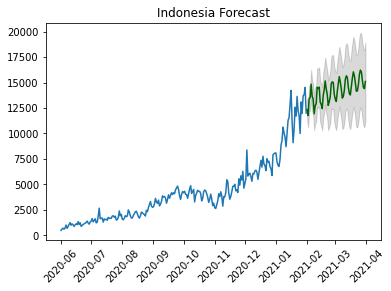

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=3542.293, Time=0.39 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=3708.854, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=3587.968, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=3543.401, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=3706.857, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=3536.273, Time=0.56 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=3588.688, Time=0.08 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=3515.900, Time=0.62 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=3569.554, Time=0.08 sec
 ARIMA(4,2,1)(0,0,0)[0] intercept   : AIC=3512.355, Time=0.66 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=3558.063, Time=0.12 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=3499.372, Time=0.73 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=3529.922, Time=0.49 sec
 ARIMA(5,2,2)(0,0,0)[0] intercept   : AIC=3484.908, Time=1.15 sec
 ARIMA(4,2,2)(0,0,0)[0] intercept

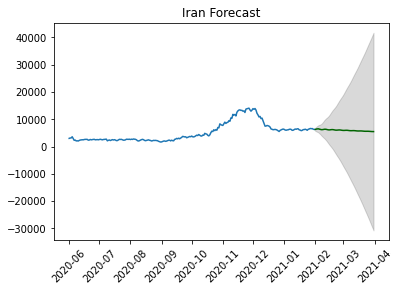

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3585.804, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3611.973, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3613.014, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3611.192, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3609.975, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3570.405, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3589.382, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3572.336, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3571.805, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3570.360, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3568.606, Time=0.17 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3570.317, Time=0.45 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3564.576, Time=0.71 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3534.811, Time=0.91 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept

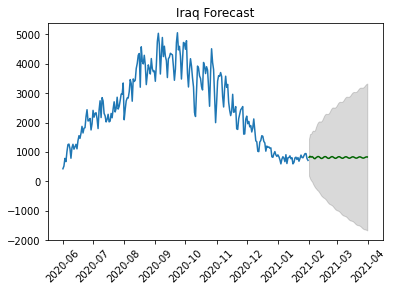

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3687.768, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4273.121, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3713.147, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4077.939, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3667.341, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3671.624, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3659.251, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3665.044, Time=0.07 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=3660.293, Time=0.33 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=3656.910, Time=0.47 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=3656.102, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=3660.446, Time=0.19 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=3657.618, Time=0.42 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=3660.467, Time=0.20 sec
 ARIMA(3,0,3)(0,0,0)[0]          

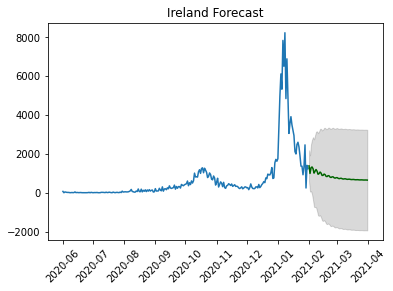

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4199.996, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4284.478, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4246.117, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4197.886, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4282.515, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4198.793, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4194.315, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4195.824, Time=0.53 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4155.120, Time=0.82 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4181.011, Time=0.61 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=4153.799, Time=0.94 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=4163.555, Time=0.54 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=4154.546, Time=1.02 sec
 ARIMA(1,1,5)(0,0,0)[0] intercept   : 

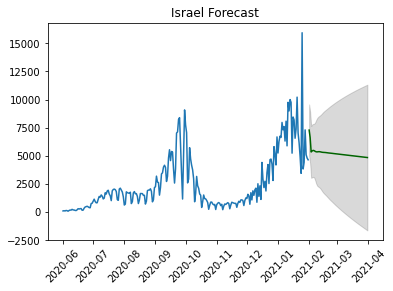

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4493.700, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4497.407, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4497.647, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4497.024, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4495.495, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4470.999, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4492.377, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4458.983, Time=0.14 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4477.136, Time=0.13 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4440.437, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4443.471, Time=0.16 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4437.299, Time=0.31 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4435.280, Time=0.15 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=4434.005, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0]          

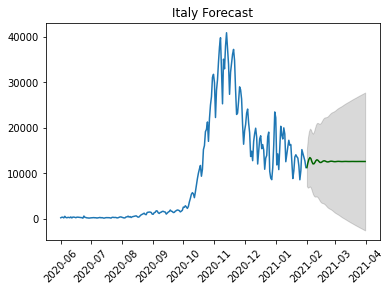

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2398.985, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2485.248, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2441.918, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2398.456, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2483.289, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2398.838, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2400.414, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2396.965, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2397.608, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2397.460, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2439.991, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2398.986, Time=0.11 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.399 seconds
                               SARIMAX Results                                
Dep. Vari

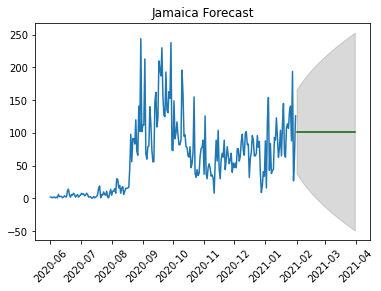

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3621.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3631.990, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3621.012, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3619.222, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3630.161, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3620.786, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3608.519, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3537.933, Time=0.70 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3591.181, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3536.724, Time=0.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3576.077, Time=0.62 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=3539.353, Time=0.96 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3536.132, Time=1.07 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3536.788, Time=0.92 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept

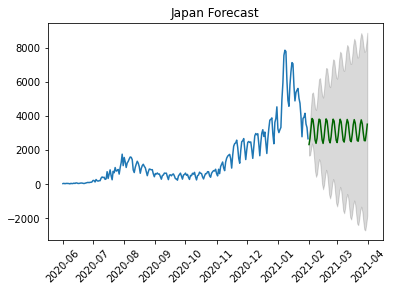

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3738.277, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3779.046, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3760.585, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3746.721, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3777.066, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3739.701, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3740.166, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3739.590, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3761.011, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3730.444, Time=0.67 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3716.599, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3718.270, Time=0.38 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=3716.235, Time=0.70 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3720.275, Time=0.41 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept

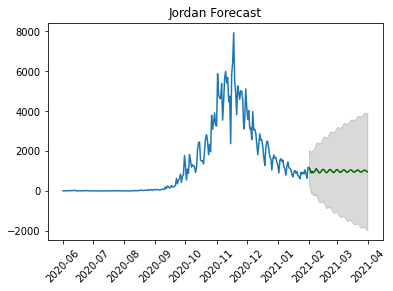

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4185.853, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4307.009, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4251.017, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4275.809, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4187.790, Time=0.32 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=4187.798, Time=0.25 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=4251.692, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=4219.758, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=4189.338, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=4198.981, Time=0.07 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 1.656 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(1, 0, 1)   Log Likelihood        

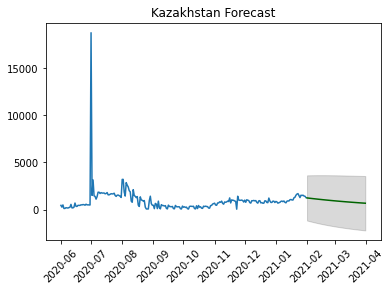

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3241.576, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3313.914, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3284.473, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3245.010, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3311.914, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3241.932, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3243.082, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3241.086, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3243.062, Time=0.46 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3239.087, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3243.010, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3241.082, Time=0.20 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=3241.062, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[0]             : 

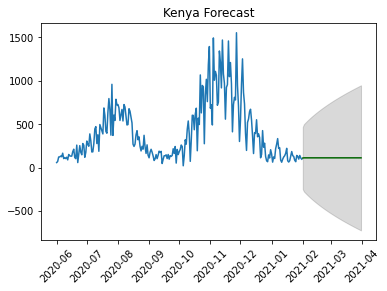

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2767.046, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2796.344, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2776.798, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2765.814, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2794.397, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2766.498, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2765.690, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2765.694, Time=0.34 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2750.540, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2764.242, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2741.464, Time=0.90 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=2744.159, Time=0.95 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=2743.411, Time=0.76 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : 

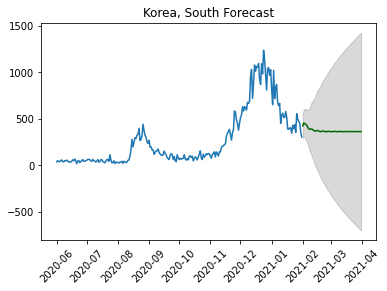

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2820.601, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2863.799, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2837.225, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2820.563, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2861.976, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2820.508, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2822.504, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2822.495, Time=0.36 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2821.296, Time=0.63 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2818.951, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2818.940, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2819.042, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2835.419, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2820.948, Time=0.14 sec

Best model:  ARIMA(0,1,1)(0,0,0)

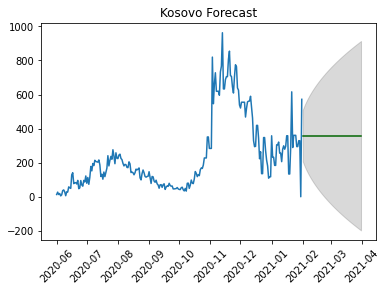

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2977.858, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3023.741, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3010.476, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2990.408, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3021.743, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2976.952, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2997.947, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2977.426, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2969.418, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2977.995, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2977.959, Time=0.77 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2976.666, Time=0.66 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2970.654, Time=0.79 sec
 ARIMA(2,1,2)(0,0,0)[0]             : 

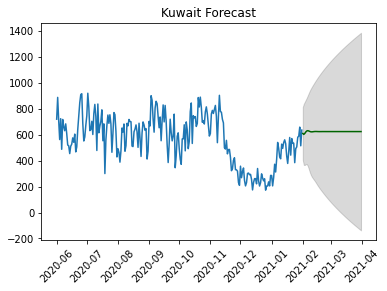

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3943.153, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3996.542, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3961.620, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3968.590, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3941.141, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3961.638, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3940.869, Time=0.42 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3958.351, Time=0.04 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=3942.391, Time=0.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=3943.449, Time=0.51 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=3941.485, Time=0.38 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=3954.912, Time=0.05 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=3944.962, Time=0.36 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=3945.465, Time=0.36 sec

Best model:  ARIMA(3,0,1)(0,0,0)

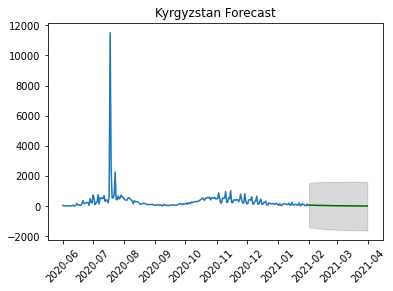

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=126.245, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=327.904, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=128.190, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=159.196, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=123.748, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=125.180, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=123.802, Time=0.19 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=123.117, Time=0.06 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=116.703, Time=0.10 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=79.470, Time=0.19 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=80.445, Time=0.23 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=81.036, Time=0.34 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=79.456, Time=0.3

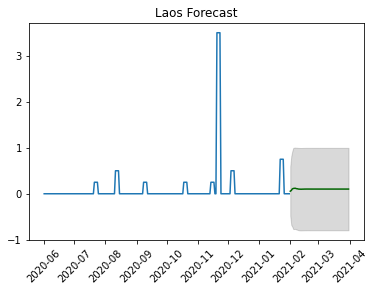

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3190.035, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3242.776, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3243.576, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3241.161, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3240.810, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3129.438, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3210.292, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3124.470, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3205.251, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3077.919, Time=0.66 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3169.810, Time=0.33 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3026.889, Time=0.87 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3077.479, Time=0.43 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3012.148, Time=1.10 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

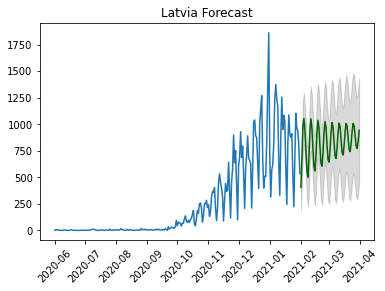

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3581.855, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3596.141, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3598.058, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3598.013, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3594.269, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3560.677, Time=0.62 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3585.560, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3556.420, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3573.797, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3551.045, Time=0.50 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3564.019, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3528.917, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3527.646, Time=0.13 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=3527.808, Time=0.12 sec

Best model:  ARIMA(5,1,0)(0,0,0)

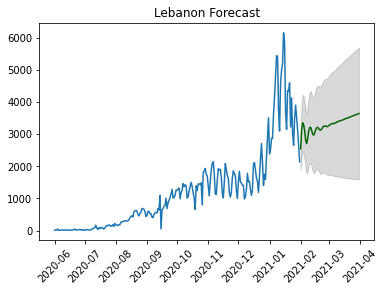

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2811.090, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2930.838, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2891.089, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2912.911, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2787.840, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2805.684, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2789.803, Time=0.19 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2789.800, Time=0.14 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2791.699, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2792.000, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=2790.039, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2787.327, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2811.449, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2802.255, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept

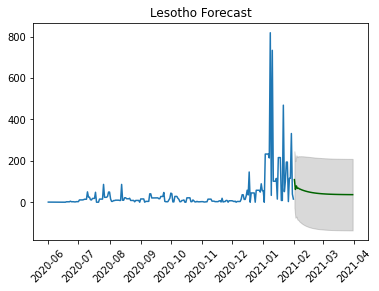

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1652.188, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1741.343, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1698.133, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1658.740, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1739.346, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1653.360, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1653.069, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1653.227, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1676.167, Time=0.20 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1654.938, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1650.611, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1656.889, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1696.146, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1651.871, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0]          

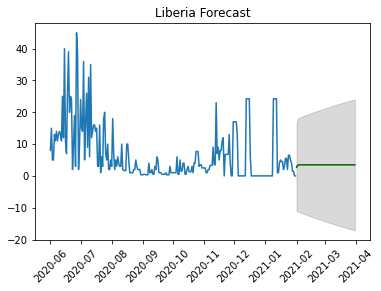

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3191.044, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3306.331, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3244.203, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3189.051, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3304.418, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3191.044, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3192.432, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3188.622, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3190.594, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3190.593, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3242.316, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3192.048, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.016 seconds
                               SARIMAX Results                                
Dep. Vari

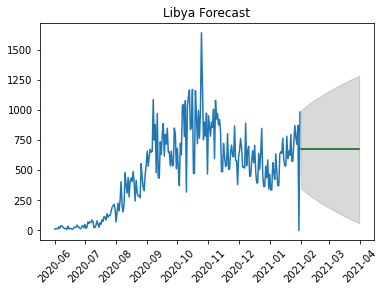

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1741.575, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1840.019, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1806.779, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1739.882, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1838.019, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1741.287, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1741.082, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1737.925, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1739.619, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1739.331, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1804.780, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1739.125, Time=0.14 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.281 seconds
                               SARIMAX Results                                
Dep. Vari

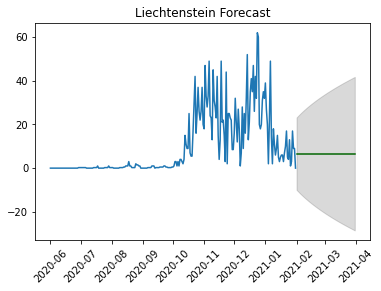

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3628.834, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3679.885, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3674.001, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3651.988, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3677.900, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3620.534, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3667.321, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3605.837, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3650.543, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3593.338, Time=0.68 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3631.402, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3567.830, Time=0.63 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3586.829, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3525.943, Time=0.99 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

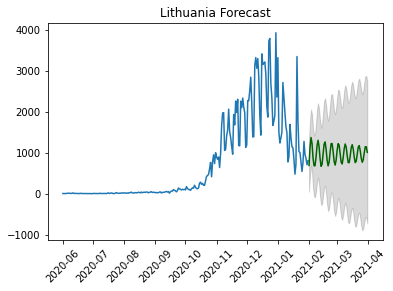

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2934.291, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2978.414, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2965.824, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2947.171, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2976.414, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2932.907, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2956.530, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2930.703, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2948.794, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2925.653, Time=0.40 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2934.605, Time=0.31 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2924.588, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=2928.024, Time=0.37 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=2925.507, Time=0.92 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

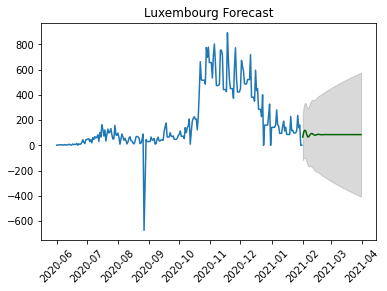

/usr/local/lib/python3.6/dist-packages/pmdarima/arima/auto.py:460: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

invalid value encountered in double_scalars

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning:

invalid value encountered in true_divide



 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5189.054, Time=0.02 sec
Total fit time: 0.024 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:                        SARIMAX   Log Likelihood                2595.527
Date:                Fri, 05 Feb 2021   AIC                          -5189.054
Time:                        14:59:59   BIC                          -5185.552
Sample:                             0   HQIC                         -5187.644
                                - 245                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2          1e-10   1.27e-10      0.790      0.430   -1.48e-10    3.48e-10
Ljung-Box (L1) (Q):               

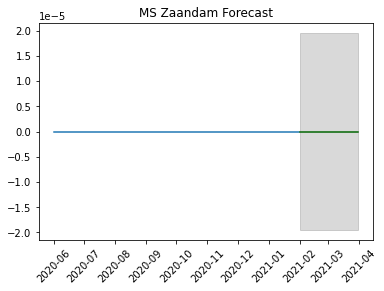

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2673.336, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2760.663, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2715.239, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2671.943, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2758.664, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2673.287, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2675.286, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2669.954, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2671.346, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2671.297, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2713.242, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2673.296, Time=0.16 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.624 seconds
                               SARIMAX Results                                
Dep. Vari

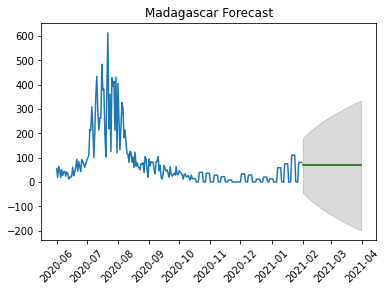

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2873.964, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2896.285, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2884.646, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2878.377, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2894.371, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2875.354, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2875.701, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2874.603, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2883.427, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2876.937, Time=0.60 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2872.514, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2876.660, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2882.788, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2873.905, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0]          

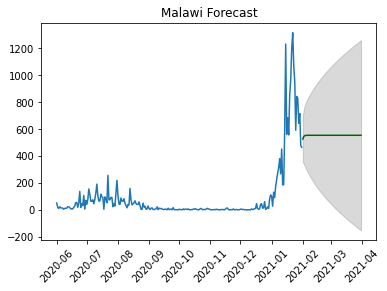

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3461.393, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3502.922, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3480.483, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3465.043, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3502.067, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3463.168, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3463.230, Time=0.40 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3461.485, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3470.868, Time=0.05 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3464.275, Time=0.65 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3466.166, Time=0.04 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 2.759 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  

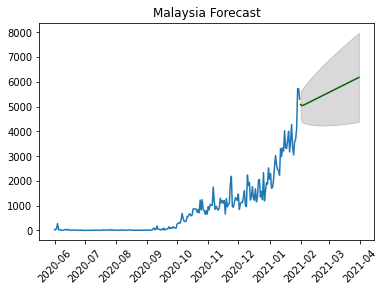

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2264.208, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2360.706, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2297.434, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2263.132, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2358.717, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2264.044, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2265.869, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2261.605, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2262.637, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2262.458, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2295.496, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2264.262, Time=0.15 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.290 seconds
                               SARIMAX Results                                
Dep. Vari

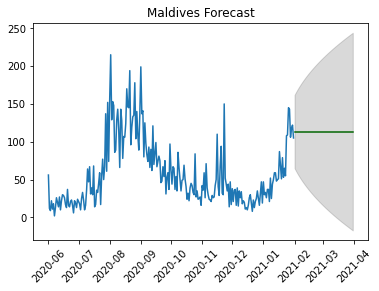

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2210.972, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2317.055, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2246.262, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2209.143, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2315.059, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2211.010, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2212.289, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2207.245, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2209.077, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2209.114, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2244.276, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2210.392, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.569 seconds
                               SARIMAX Results                                
Dep. Vari

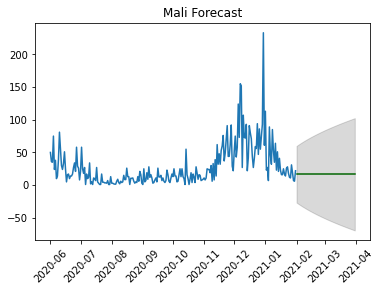

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2282.230, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2381.948, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2326.832, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2280.486, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2380.083, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2282.126, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2284.418, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2280.504, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.166 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1137.243
Date:                Fri, 05 Feb 2021   AIC                           2280.486
Time:                        15:00:1

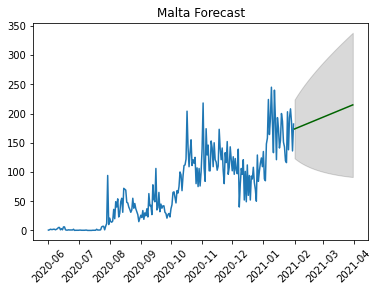

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-549.691, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-346.905, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-547.569, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-503.949, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-556.442, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-551.286, Time=0.09 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-556.486, Time=0.23 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-556.309, Time=0.14 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=-590.988, Time=0.47 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=-562.409, Time=0.15 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=-579.299, Time=0.56 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=-600.623, Time=0.52 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-611.358, Time=0.53 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-595.582, Time=0.36 sec
 ARIMA(3,0,3)(0,0,0)[0]          

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

divide by zero encountered in double_scalars



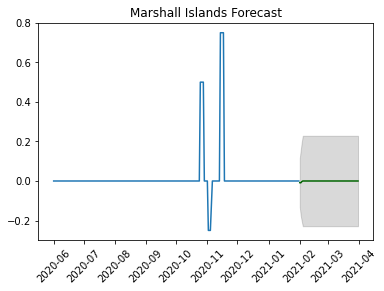

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2314.893, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2377.731, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2337.673, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2312.897, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.735, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2314.891, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2310.935, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2312.930, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2312.928, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2335.686, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.867 seconds
                               SARIMAX Results                                
Dep. Variable:     

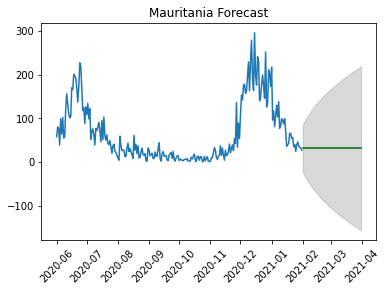

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=877.139, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=993.550, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=896.466, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=935.233, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=864.114, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=884.681, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=865.160, Time=0.23 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=865.480, Time=0.19 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=867.133, Time=0.18 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=884.727, Time=0.05 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=866.847, Time=0.43 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=864.137, Time=0.48 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0]          
Total fit time: 1.951 seconds
                               SARIMAX Results                                
Dep. Variable:       

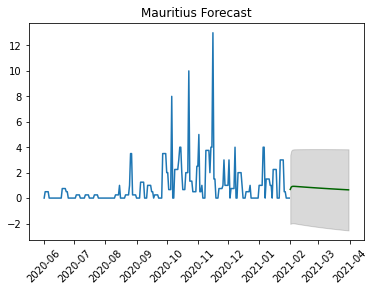

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4551.072, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4618.172, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4604.645, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4566.350, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4616.182, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4549.695, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4594.004, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4548.232, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4584.643, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4542.408, Time=0.26 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4573.636, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4526.363, Time=0.31 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4540.672, Time=0.13 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=4515.418, Time=1.02 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

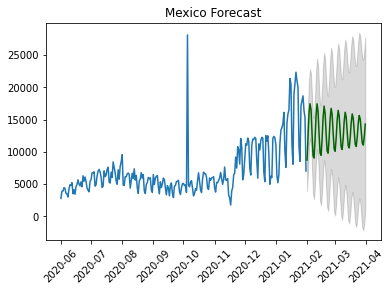

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-1191.537, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-990.170, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-1189.880, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-1159.077, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-1224.398, Time=0.23 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1155.220, Time=0.11 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-1248.297, Time=0.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-1218.659, Time=0.42 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-1310.296, Time=0.55 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-1312.223, Time=0.45 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-1314.264, Time=0.45 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-1312.275, Time=0.41 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-1310.280, Time=0.65 sec
 ARIMA(0,0,3)(0,0,0)[0] in

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

divide by zero encountered in double_scalars



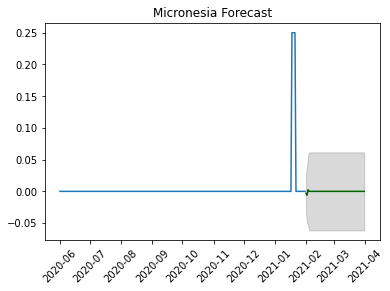

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3366.185, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3413.166, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3414.797, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3403.982, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3411.168, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3335.233, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3393.498, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3328.470, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3383.531, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3304.349, Time=0.43 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3371.071, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3191.318, Time=0.86 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3216.687, Time=0.47 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3134.992, Time=1.12 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

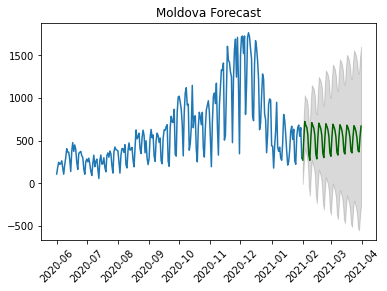

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1469.717, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1537.826, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1526.188, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1486.530, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1535.851, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1464.816, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1504.761, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1466.087, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1455.805, Time=0.55 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1466.298, Time=0.15 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1468.813, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1436.984, Time=1.06 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1462.783, Time=0.37 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=1439.092, Time=1.13 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept

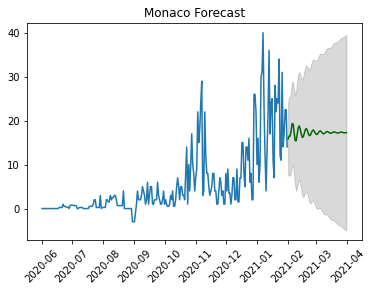

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1668.324, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1752.056, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1691.750, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1666.499, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1750.115, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1668.363, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1659.172, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1657.269, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1667.310, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1659.003, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1659.042, Time=0.61 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1657.042, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1668.463, Time=0.15 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=1659.042, Time=0.41 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept

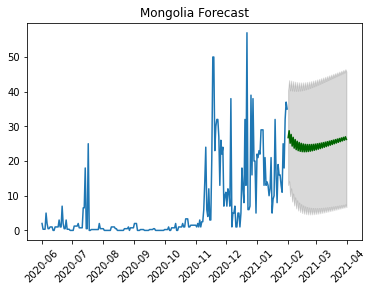

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2913.894, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2982.060, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2942.474, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2917.501, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2980.133, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2915.353, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2915.683, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2914.957, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2939.008, Time=0.12 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2915.551, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2913.198, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2916.410, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2940.626, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2914.715, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0]          

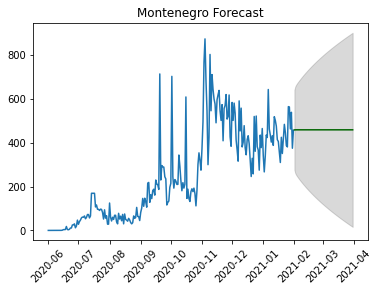

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3778.977, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3824.330, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3821.868, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3800.258, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3822.334, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3761.796, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3790.780, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3763.513, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3765.956, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3764.518, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3789.001, Time=0.07 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=3759.864, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3777.039, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0]             : 

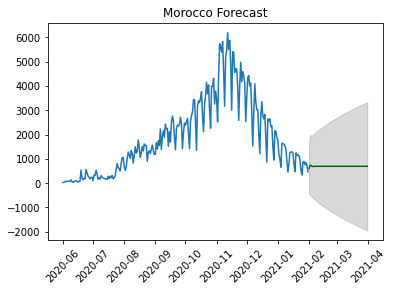

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2912.773, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3011.834, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2944.549, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2912.444, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3010.098, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2912.540, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2907.789, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2903.643, Time=0.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2901.652, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2904.981, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2903.651, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2904.179, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2900.605, Time=0.73 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=2887.727, Time=0.87 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept

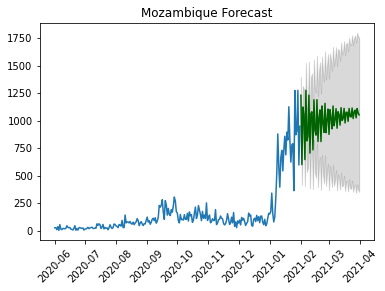

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2774.305, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2888.020, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2812.994, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2774.436, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2886.027, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2776.147, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2758.051, Time=0.49 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2774.116, Time=0.25 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2775.942, Time=0.52 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2775.990, Time=0.59 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2775.453, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2760.878, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2756.079, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2772.425, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[0]          

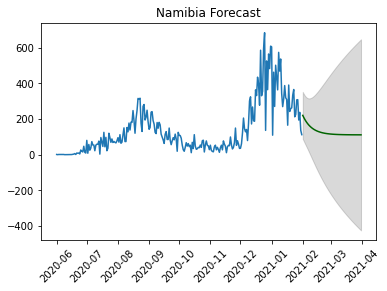

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3664.545, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3768.971, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3666.243, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3674.994, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3766.973, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3655.603, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3664.259, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3664.584, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3657.322, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3666.590, Time=0.10 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3665.531, Time=0.06 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3654.587, Time=0.76 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=3658.335, Time=0.39 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3648.464, Time=0.70 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept

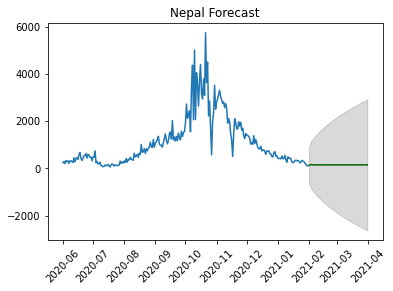

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3891.199, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3892.344, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3894.308, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3894.273, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3890.456, Time=0.01 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.575 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1944.228
Date:                Fri, 05 Feb 2021   AIC                           3890.456
Time:                        15:02:24   BIC                           3893.953
Sample:                             0   HQIC                          3891.865
                                - 245                                       

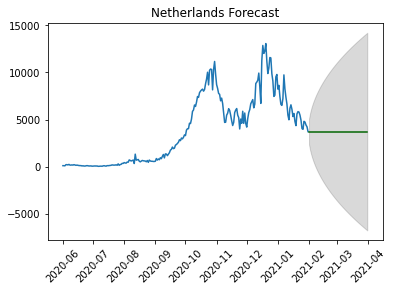

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1223.780, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1451.333, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1295.153, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1365.736, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1225.761, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1225.760, Time=0.11 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1339.310, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1260.164, Time=0.09 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1226.194, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1220.317, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1259.803, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1248.168, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1222.278, Time=0.26 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1222.273, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept

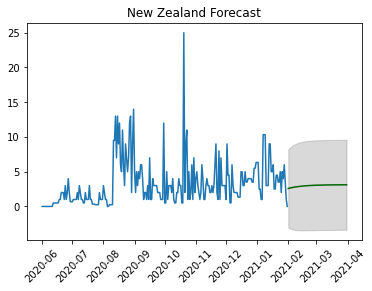

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2269.250, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2271.249, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2271.249, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2267.303, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.939 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1132.651
Date:                Fri, 05 Feb 2021   AIC                           2267.303
Time:                        15:02:29   BIC                           2270.800
Sample:                             0   HQIC                          2268.711
                                - 245                                         
Co

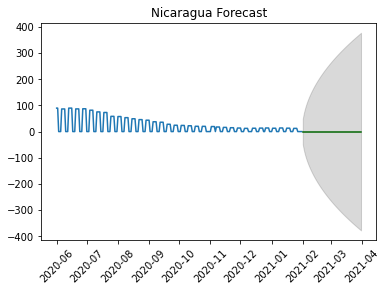

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1875.874, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1956.031, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1926.851, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1876.048, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1954.031, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1871.851, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1891.869, Time=0.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1873.842, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1873.009, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1872.670, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1887.371, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1874.877, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1869.986, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1874.031, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]          

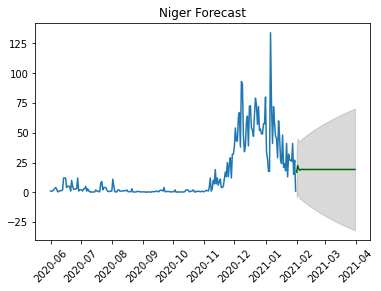

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3248.847, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3342.830, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3279.109, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3246.938, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3340.836, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3248.858, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3246.394, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3248.276, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3248.290, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3277.240, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3249.745, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.142 seconds
                               SARIMAX Results                                
Dep. Variable:

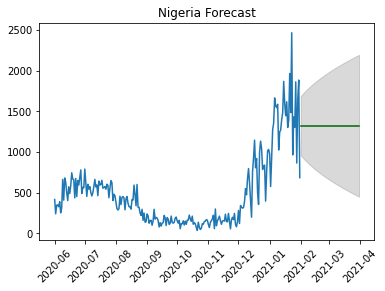

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3214.462, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3283.895, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3270.647, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3222.576, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3281.896, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3203.912, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3243.956, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3203.653, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3236.985, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3193.168, Time=0.65 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3229.783, Time=0.09 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3158.646, Time=0.55 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3190.240, Time=0.43 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3091.821, Time=1.03 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

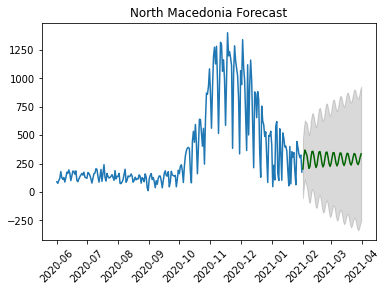

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2835.102, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2861.294, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2860.386, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2858.165, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2859.311, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2828.638, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2853.100, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2825.627, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2851.520, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2798.727, Time=0.57 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2817.300, Time=0.37 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2791.105, Time=0.53 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=2795.661, Time=0.42 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=2745.709, Time=1.16 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

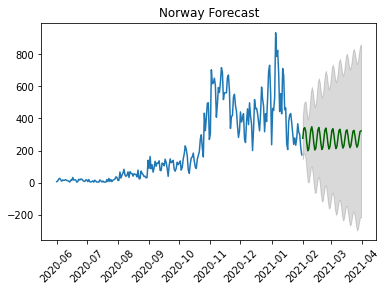

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3180.381, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3228.085, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3197.333, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3178.615, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3226.089, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3180.253, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3174.363, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3175.369, Time=0.42 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3175.343, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3179.590, Time=0.26 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3178.239, Time=0.16 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3177.334, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3172.490, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3178.382, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[0]          

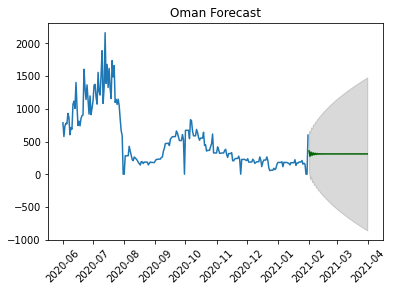

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3918.967, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4049.910, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3986.980, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3921.839, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4047.936, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3904.627, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3928.379, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3903.884, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3912.337, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3895.396, Time=0.32 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3893.935, Time=0.10 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3895.383, Time=0.16 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3897.345, Time=0.52 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=3892.423, Time=0.05 sec
 ARIMA(3,1,0)(0,0,0)[0]          

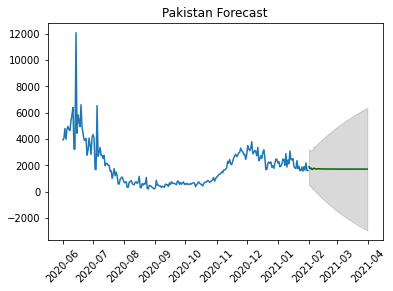

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3604.862, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3638.830, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3635.446, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3631.774, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3636.839, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3600.338, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3631.349, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3592.515, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3624.955, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3576.815, Time=0.52 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3603.747, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3559.803, Time=0.74 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3565.262, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3535.351, Time=1.21 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

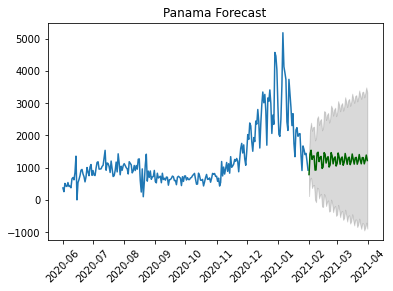

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1437.996, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1536.589, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1495.025, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1436.585, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1534.589, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1437.795, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1438.474, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1434.587, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1435.999, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1435.798, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1493.025, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1436.477, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.190 seconds
                               SARIMAX Results                                
Dep. Vari

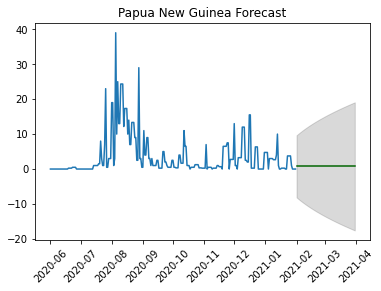

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3173.215, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3246.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3225.750, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3184.359, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3244.718, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3172.771, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3211.992, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3172.376, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3204.310, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3168.550, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3196.784, Time=0.09 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3153.514, Time=0.78 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3164.832, Time=0.40 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3143.782, Time=1.10 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

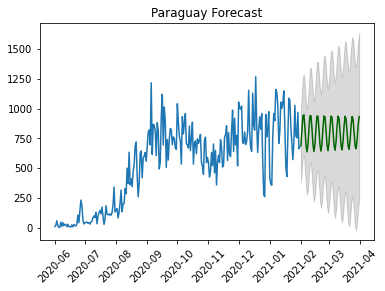

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4357.777, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4474.020, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4441.064, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4353.995, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4472.022, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4355.989, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4345.182, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4335.758, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4337.244, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4335.536, Time=0.26 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4339.142, Time=0.19 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=4334.292, Time=0.46 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4333.486, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4344.594, Time=0.19 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept

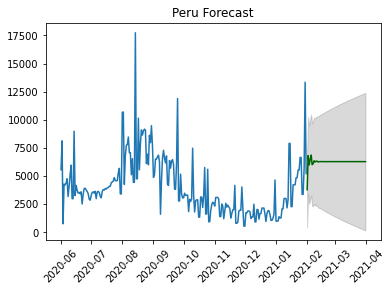

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3862.090, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3968.303, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3872.742, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3862.032, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3966.320, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3862.898, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3853.055, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3851.815, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3856.691, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3853.676, Time=0.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3853.836, Time=0.42 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3851.567, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3858.178, Time=0.57 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3853.571, Time=0.61 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept

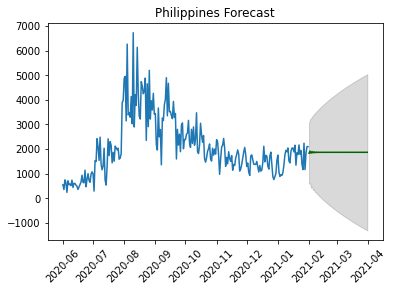

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4475.900, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4499.188, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4497.439, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4493.115, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4497.203, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4469.646, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4484.791, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4470.131, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4470.656, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4469.474, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4467.770, Time=0.08 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4470.357, Time=0.08 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4452.971, Time=0.70 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4438.212, Time=0.83 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept

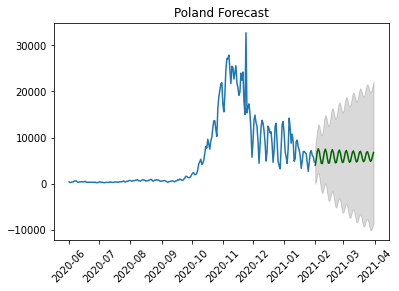

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4125.262, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4149.462, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4151.321, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4151.199, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4147.717, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4096.209, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4135.090, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4090.701, Time=0.64 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4125.606, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4072.709, Time=0.54 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4101.586, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4046.458, Time=0.37 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4050.419, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=4007.166, Time=1.10 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

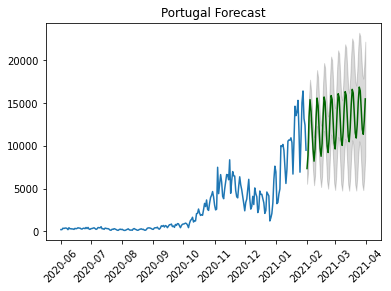

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2823.955, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3781.443, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3501.734, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2825.746, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2825.634, Time=0.27 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2824.638, Time=0.30 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 2.064 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1408.977
Dat

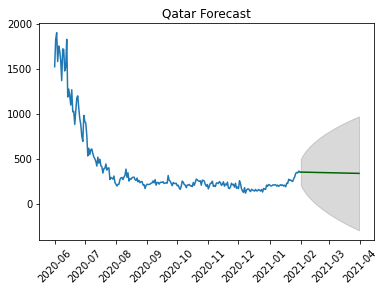

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4054.674, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4079.487, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4078.567, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4074.749, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4077.500, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4005.036, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4050.722, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4002.497, Time=0.68 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4043.612, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3975.783, Time=0.55 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4012.792, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3943.179, Time=0.30 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3949.733, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3908.252, Time=1.26 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

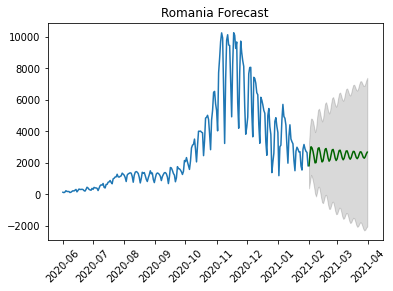

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=3870.651, Time=0.44 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=4037.186, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=3983.893, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=3869.541, Time=0.17 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=4035.199, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=3870.011, Time=0.39 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=3873.019, Time=0.79 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=3867.976, Time=0.14 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=3869.106, Time=0.26 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=3868.481, Time=0.18 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=3981.908, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=3871.302, Time=0.59 sec

Best model:  ARIMA(0,2,1)(0,0,0)[0]          
Total fit time: 3.176 seconds
                               SARIMAX Results                                
Dep. Vari

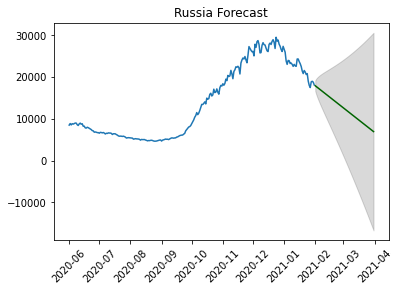

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2451.259, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2519.355, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2460.691, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2449.439, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2517.430, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2451.324, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2439.664, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2435.257, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2449.242, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2436.366, Time=0.70 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2436.909, Time=0.68 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2435.191, Time=0.56 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2444.912, Time=0.36 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=2436.253, Time=0.82 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept

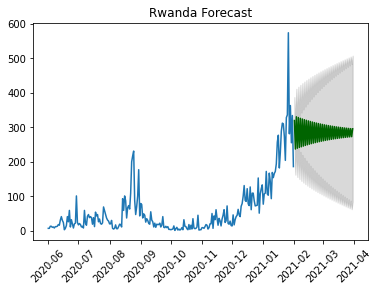

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-234.342, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-55.730, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-236.065, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-182.987, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-234.299, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-238.481, Time=0.32 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-236.696, Time=0.39 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-236.693, Time=0.35 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-237.616, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-233.021, Time=0.24 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-239.506, Time=0.48 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=-236.185, Time=0.61 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=-245.064, Time=0.58 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-242.173, Time=0.58 sec
 ARIMA(4,0,3)(0,0,0)[0]           

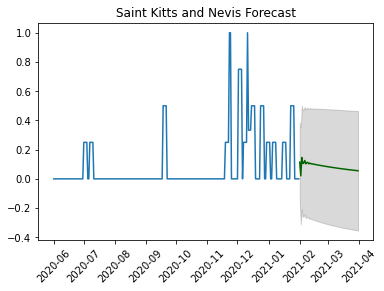

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1894.365, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2019.596, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1973.028, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1892.525, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2017.596, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1894.116, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1892.894, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.324 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 1)   Log Likelihood                -943.263
Date:                Fri, 05 Feb 2021   AIC                           1892.525
Time:                        15:05:20   B

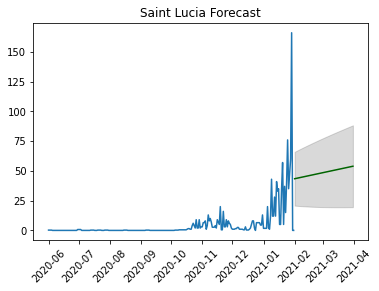

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1786.843, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1888.333, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1839.567, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1785.756, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1886.334, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1786.779, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1787.180, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1784.265, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1785.433, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1785.370, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1837.568, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1785.627, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.340 seconds
                               SARIMAX Results                                
Dep. Vari

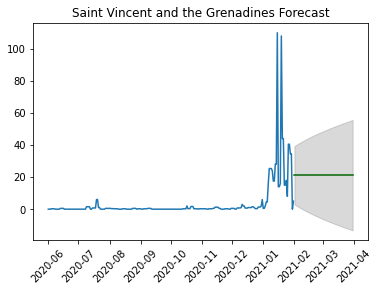

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-979.123, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-983.123, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-981.123, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-981.123, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-985.123, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.804 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 493.561
Date:                Fri, 05 Feb 2021   AIC                           -985.123
Time:                        15:05:23   BIC                           -981.626
Sample:                             0   HQIC                          -983.714
                                - 245                                       

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

divide by zero encountered in double_scalars



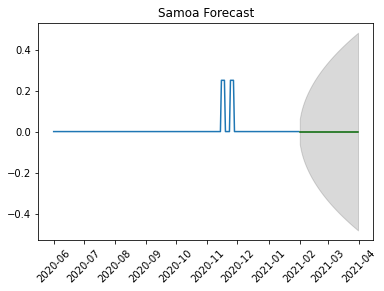

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1741.139, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1824.910, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1815.708, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1754.901, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1822.943, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1727.266, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1784.545, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1728.252, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1721.013, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1719.244, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1731.321, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1720.844, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1721.437, Time=0.18 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1717.846, Time=0.74 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept

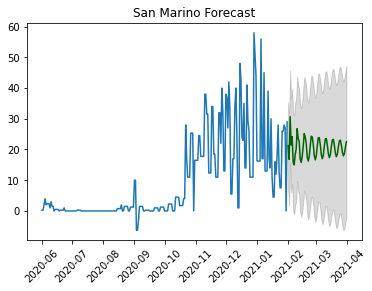

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1822.727, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1845.980, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1836.810, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1838.501, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1823.846, Time=0.21 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1823.797, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1839.144, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1836.369, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1825.039, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1819.938, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1822.363, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1822.115, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1821.778, Time=0.46 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1821.750, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept

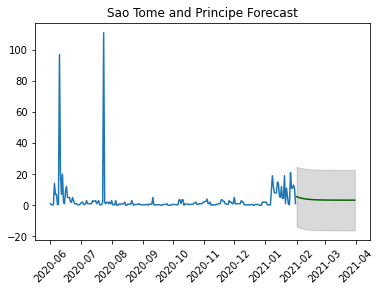

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3235.633, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3237.633, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3234.256, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3233.635, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3235.956, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3235.629, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3235.352, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3232.095, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3234.095, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3234.095, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3232.684, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3233.853, Time=0.14 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.825 seconds
                               SARIMAX Results                                
Dep. Vari

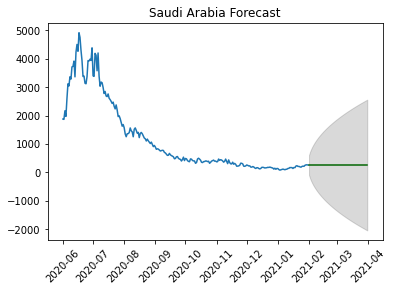

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2474.137, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2555.413, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2522.479, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2476.705, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2553.506, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2474.619, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2474.538, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2473.361, Time=0.26 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2474.471, Time=0.34 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2468.650, Time=0.75 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2442.229, Time=0.85 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2476.519, Time=0.47 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2442.298, Time=0.98 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : 

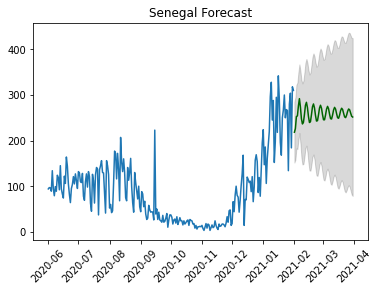

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=3718.104, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=3703.646, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=3716.107, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=3668.924, Time=0.16 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=3660.273, Time=0.09 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=3655.643, Time=0.09 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=3562.085, Time=0.27 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=3444.101, Time=1.13 sec
 ARIMA(4,2,1)(0,0,0)[0] intercept   : AIC=3549.873, Time=0.86 sec
 ARIMA(5,2,2)(0,0,0)[0] intercept   : AIC=3389.421, Time=1.28 sec
 ARIMA(4,2,2)(0,0,0)[0] intercept   : AIC=3468.521, Time=1.19 sec
 ARIMA(5,2,3)(0,0,0)[0] intercept   : AIC=3382.163, Time=1.46 sec
 ARIMA(4,2,3)(0,0,0)[0] intercept   : AIC=i

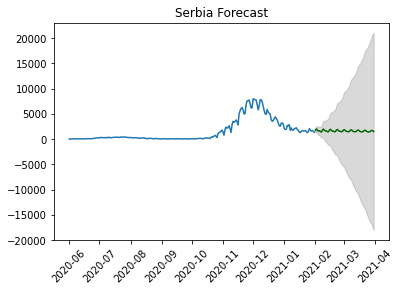

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1792.057, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1852.175, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1841.680, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1816.846, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1850.188, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1790.739, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1825.328, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1792.572, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1792.658, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1791.434, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1809.424, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1794.419, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1789.915, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1791.393, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0]          

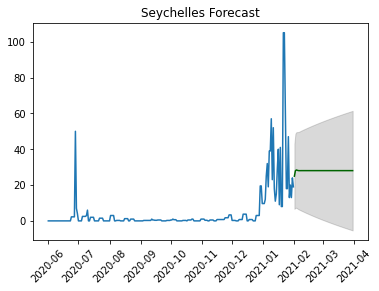

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1813.361, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1872.026, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1828.531, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1811.363, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1870.149, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1813.360, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1810.503, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1812.502, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1812.502, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1827.062, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.610 seconds
                               SARIMAX Results                                
Dep. Variable:     

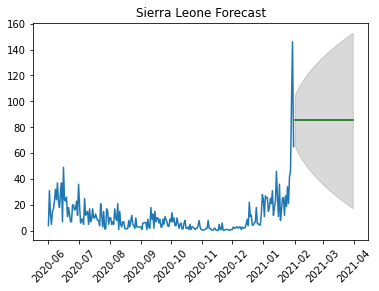

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2746.401, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2811.382, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2774.634, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2746.962, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2809.483, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2748.379, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2748.393, Time=0.40 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2746.503, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2765.321, Time=0.23 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2748.637, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2745.838, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2746.173, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2772.897, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2747.806, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0]          

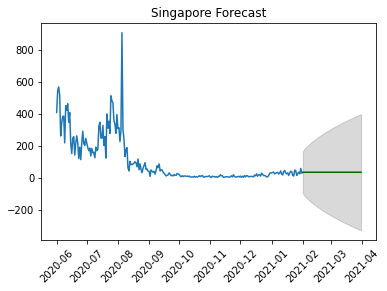

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3863.216, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3919.673, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3920.875, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3901.771, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3917.698, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3836.197, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3900.747, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3829.510, Time=0.66 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3890.669, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3804.790, Time=0.83 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3859.037, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3782.686, Time=0.72 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3802.039, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3769.596, Time=1.17 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

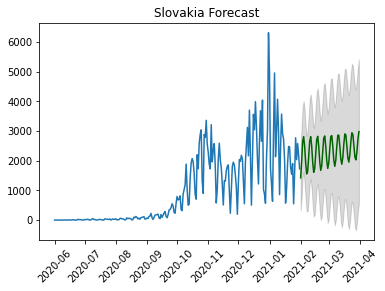

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3658.147, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3656.526, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3647.157, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3656.156, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3565.504, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3569.384, Time=0.80 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3565.055, Time=0.69 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3562.836, Time=0.71 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3545.705, Time=0.87 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3506.774, Time=0.73 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3554.309, Time=0.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3555.258, Time=0.63 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=i

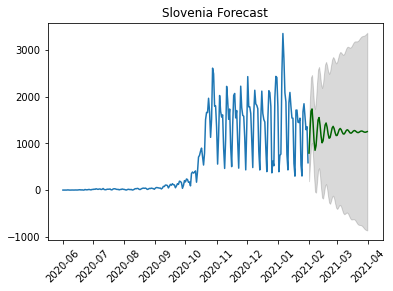

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-173.969, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-172.289, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-172.489, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-175.969, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.347 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  245
Model:               SARIMAX(0, 1, 0)   Log Likelihood                  88.985
Date:                Fri, 05 Feb 2021   AIC                           -175.969
Time:                        15:07:06   BIC                           -172.472
Sample:                             0   HQIC                          -174.561
                                - 245                                         
Co

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3108: RuntimeWarning:

divide by zero encountered in double_scalars



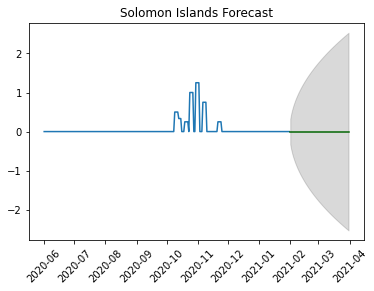

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1899.594, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2147.376, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1900.032, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1997.451, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1882.503, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1900.266, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1899.216, Time=0.12 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1883.352, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1885.815, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1899.393, Time=0.06 sec


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import pmdarima as pm
from pandas.plotting import register_matplotlib_converters


register_matplotlib_converters()

df = pd.read_csv('final_res_global.csv')
countries = np.unique(df['Country'])

# Set the training/validating time period
# Manually Update the number of days here in this Section
n_of_train = 214 + 31   # Jun 2020 - Jan 2021
n_of_test = 0           # 0      
n_of_forecast = 28 + 31 # Feb - Mar 2021
n_of_unuse = 375 - n_of_train - n_of_test 
train_start = '6/1/2020'
forecast_start = '2/1/2021'

data = []
wholeGlobal  = pd.DataFrame(data, columns = ['Actual', 'Forecast']) 
wholeGlobal['Actual'] = [0] * n_of_forecast
wholeGlobal['Forecast'] = [0] * n_of_forecast

past = pd.DataFrame(data, columns = ['Past'])
past['Past'] = [0] * n_of_train
# plt.locator_params(nbins=1, axis='both')

# Output File: Forecast Value
fc_output = pd.DataFrame(data, columns = ['Dates'])
fc_output['Dates'] = [0] * n_of_forecast

mape_output = pd.DataFrame(data, columns = ['countries', 'MAPE']) 

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  
    mpe = np.mean((forecast - actual)/actual)   
    return(mape, mpe)

# Iterate each countries to train the model and get the foreacast number for countries
for i in range(len(countries)): 
 for i in range(2): 
    country_df = df.loc[df['Country'] == countries[i]]
    country_df = country_df[['Date', 'New case']]
    country_df.set_index('Date', inplace=True) 
    country_df.index = (pd.date_range(start='1/23/2020', periods= len(country_df)))

    # Split the training / testing dataset
    tv = ['unuse']*n_of_unuse+['train']*n_of_train+ ['test']*n_of_test
    country_df['cat'] = tv
       
    # Data Noise Adjustment
    for j in range(len(country_df)):
        if country_df.iloc[j,0] > 0:
            pass        
        elif j < (len(country_df) - 2) and country_df.iloc[j,0] < 0:
            country_df.iloc[j,0] = (country_df.iloc[j-1,0] + country_df.iloc[j + 1,0])/2
        elif j < (len(country_df) - 2) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] != 0):
            country_df.iloc[j,0] = 0.5 * (country_df.iloc[j+1,0])
            country_df.iloc[j+1,0] = 0.5 * (country_df.iloc[j+1,0])       
        elif j < (len(country_df) - 3) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] == 0) and (country_df.iloc[j+2,0] != 0): 
                country_df.iloc[j,0] = 1/3 * (country_df.iloc[j+2,0])
                country_df.iloc[j+1,0] = 1/3 * (country_df.iloc[j+2,0])
                country_df.iloc[j+2,0] = 1/3 * (country_df.iloc[j+2,0])
        elif j < (len(country_df) - 3) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] == 0) and (country_df.iloc[j+2,0] == 0): 
                country_df.iloc[j,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+1,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+2,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+3,0] = 1/4 * (country_df.iloc[j+3,0])
           
    train_df = country_df.loc[country_df['cat'] == 'train']
    test_df = country_df.loc[country_df['cat'] == 'test']
     
    # Apply Auto Arima Model
    model = pm.auto_arima(train_df['New case'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
    print(model.summary())

    fc, confint = model.predict(n_periods=n_of_forecast, return_conf_int=True)
    index_of_fc = pd.date_range(start=forecast_start, periods=n_of_forecast)
    
    fc_output[countries[i]] = fc.tolist()
    
    # make series for plotting purpose
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot each individual countries                                 
    plt.plot(train_df['New case'])
    plt.plot(test_df['New case'])
    plt.plot(fc_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)
    
    plt.xticks(rotation=45)
    title = countries[i]+ " Forecast"
    plt.title(title)
    plt.show() 

    wholeGlobal['Forecast'] = wholeGlobal['Forecast'] + fc
    past['Past'] = past['Past'] + train_df['New case'].values

wholeGlobal.index = pd.date_range(start=forecast_start, periods=n_of_forecast)
past.index = pd.date_range(start=train_start, periods=n_of_train)
fc_output['Dates'] = pd.date_range(start=forecast_start, periods=n_of_forecast)

# ----------------------------------------------------------------------------------------
# Global Forecasting (aggregate all the countries)
# Plot US forecasting
plt.plot(past['Past'])
plt.plot(wholeGlobal['Forecast'], color='darkgreen')
plt.xticks(rotation=45)
plt.title("Global Forecast - Aggregate from 192 countries")
plt.show() 

# ----------------------------------------------------------------------------------------
# Global Forecasting (Not aggregate)
model2 = pm.auto_arima(past['Past'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
fc, confint = model2.predict(n_periods=n_of_forecast, return_conf_int=True)
index_of_fc = pd.date_range(start=forecast_start, periods = n_of_forecast)

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)
fc_series.index = pd.date_range(start=forecast_start, periods=n_of_forecast)
# Plot
plt.plot(past['Past'])
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)
plt.xticks(rotation=45)
plt.title("Global Forecast - from Globa; Total New Cases")
plt.show()  

# Output the forecast time series data
fc_output['Global'] = fc.tolist()
fc_output.to_csv('Global_FebMar.csv')




Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.135 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:                        15:18:4

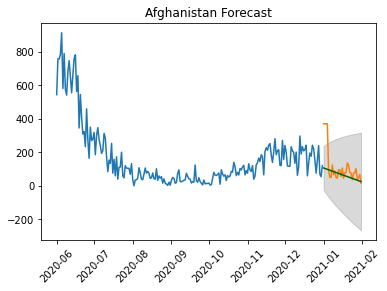

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.171 seconds
                               SARIMAX Results                 

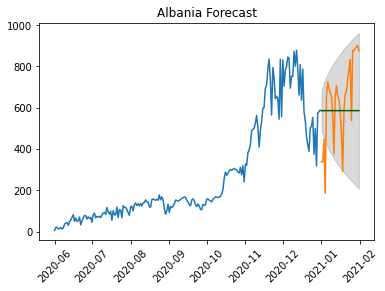

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.140 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

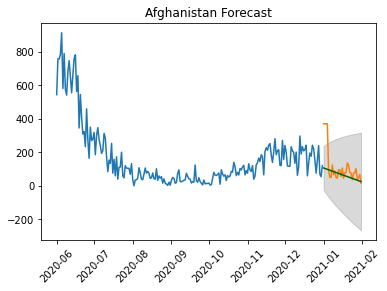

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.140 seconds
                               SARIMAX Results                 

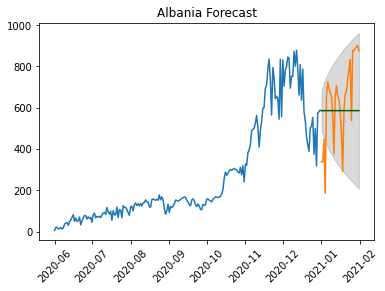

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.100 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

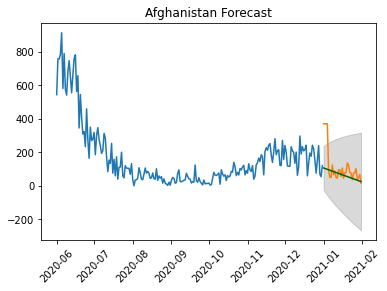

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.168 seconds
                               SARIMAX Results                 

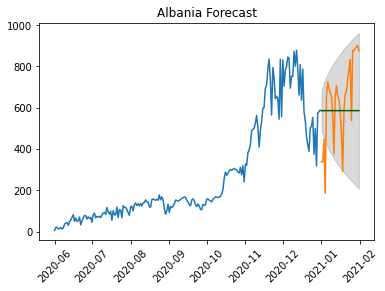

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.116 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

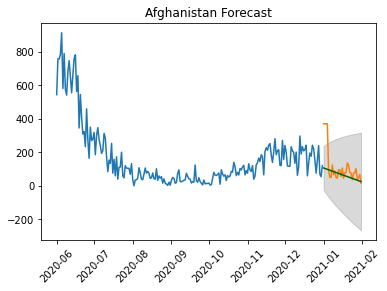

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.173 seconds
                               SARIMAX Results                 

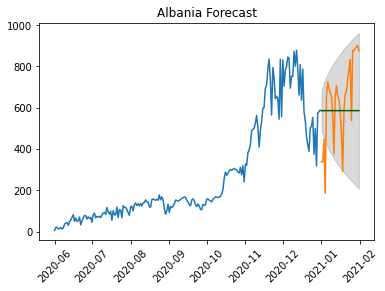

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.110 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

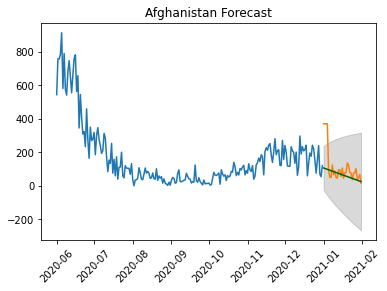

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.140 seconds
                               SARIMAX Results                 

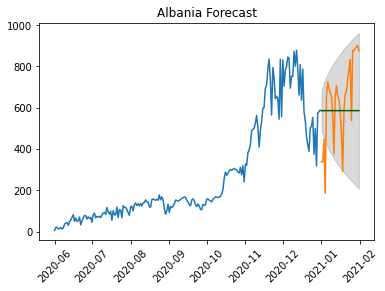

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.143 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

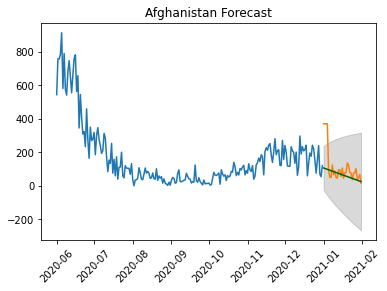

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.143 seconds
                               SARIMAX Results                 

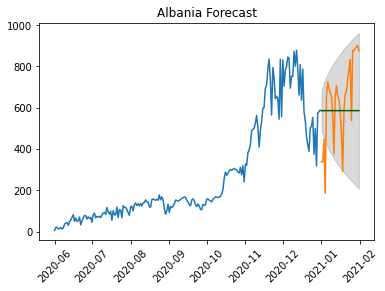

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.135 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

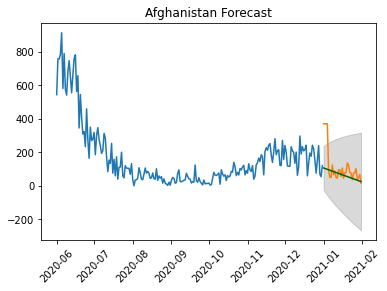

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.166 seconds
                               SARIMAX Results                 

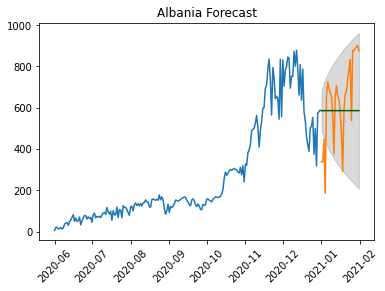

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.199 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

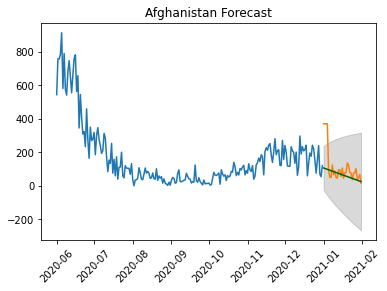

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.183 seconds
                               SARIMAX Results                 

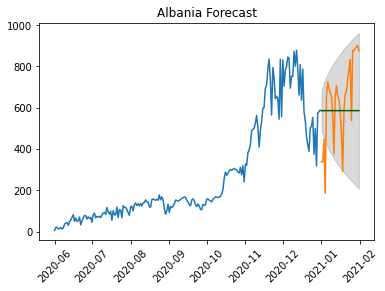

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.121 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

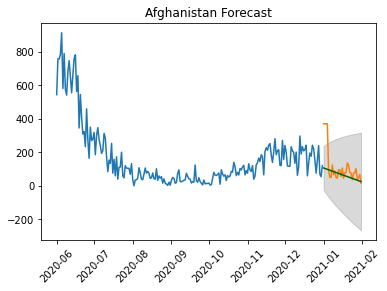

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.192 seconds
                               SARIMAX Results                 

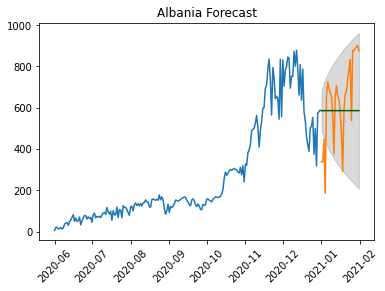

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.228 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

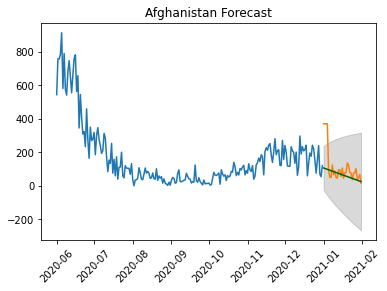

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.185 seconds
                               SARIMAX Results                 

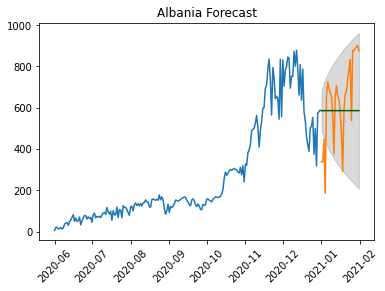

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.145 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

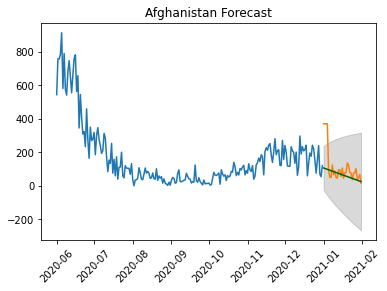

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.206 seconds
                               SARIMAX Results                 

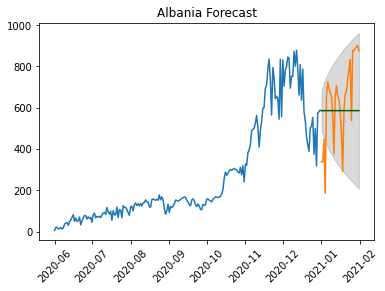

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.162 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

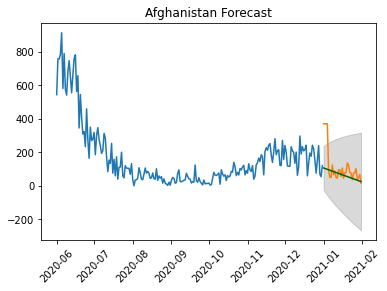

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.198 seconds
                               SARIMAX Results                 

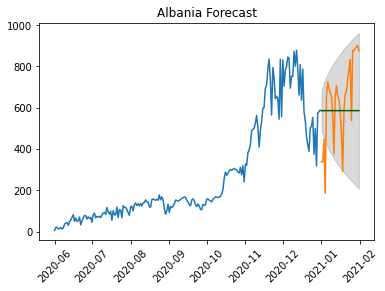

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.160 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

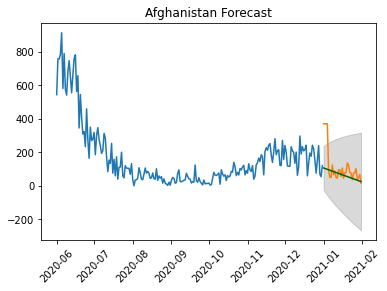

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.233 seconds
                               SARIMAX Results                 

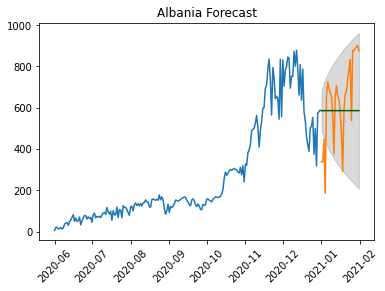

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.164 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

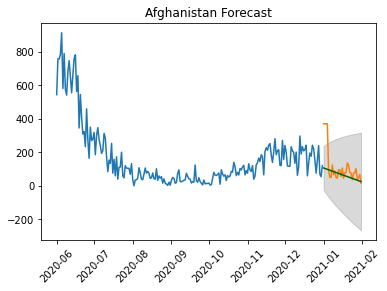

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.257 seconds
                               SARIMAX Results                 

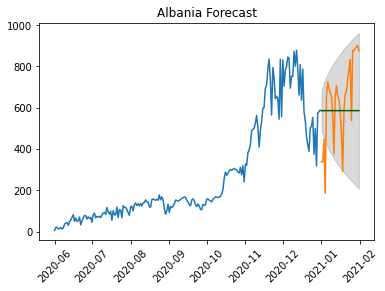

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.159 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

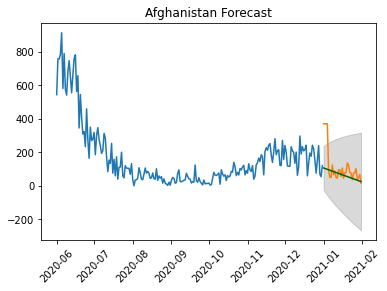

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.208 seconds
                               SARIMAX Results                 

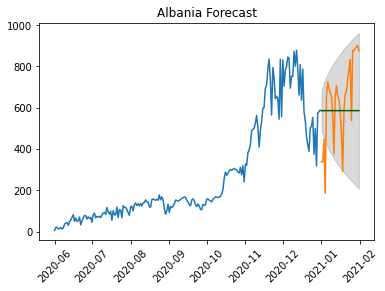

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.264 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

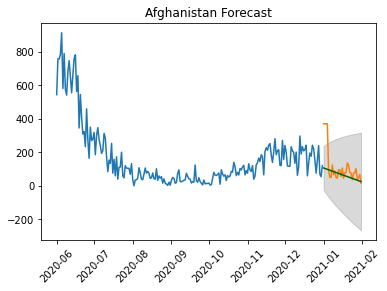

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.257 seconds
                               SARIMAX Results                 

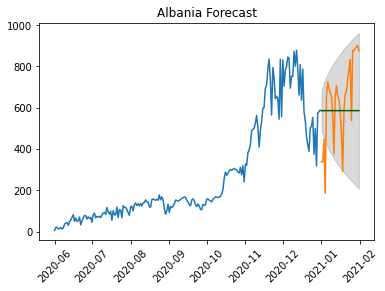

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.198 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

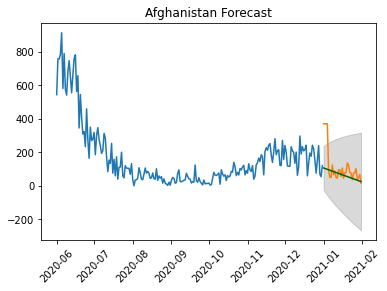

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.239 seconds
                               SARIMAX Results                 

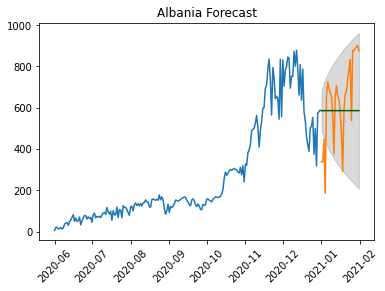

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.221 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

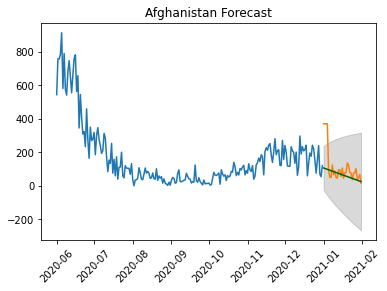

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.175 seconds
                               SARIMAX Results                 

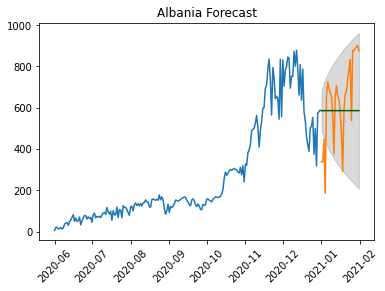

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.162 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

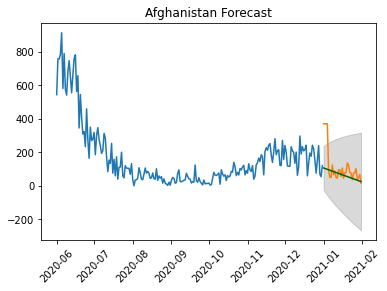

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.248 seconds
                               SARIMAX Results                 

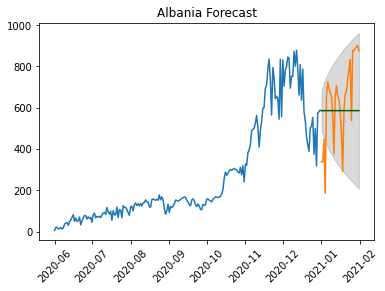

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.141 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

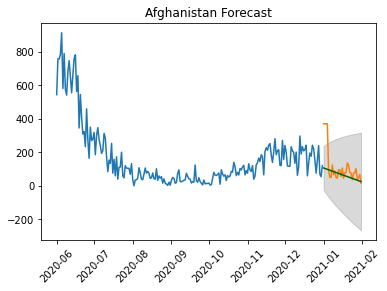

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.191 seconds
                               SARIMAX Results                 

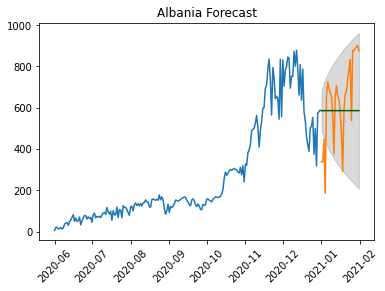

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.143 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

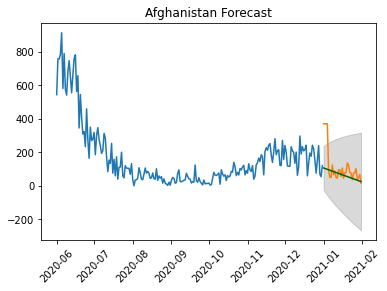

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.205 seconds
                               SARIMAX Results                 

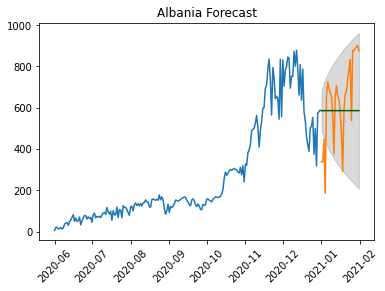

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.162 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

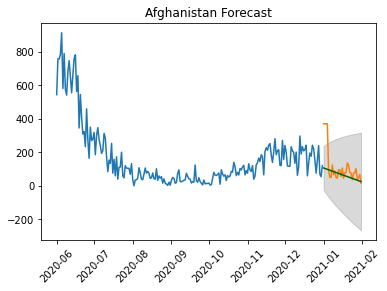

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.219 seconds
                               SARIMAX Results                 

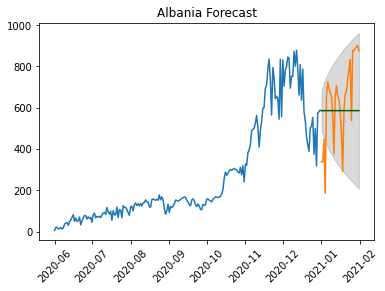

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.185 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

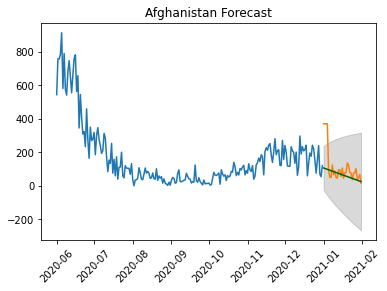

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.231 seconds
                               SARIMAX Results                 

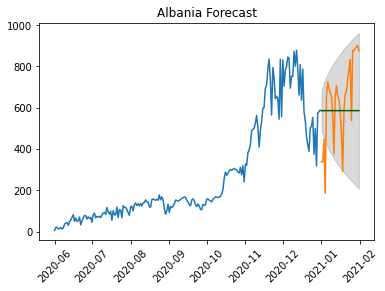

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.249 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

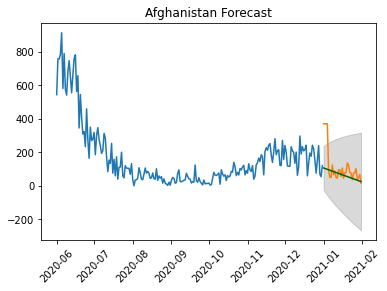

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.233 seconds
                               SARIMAX Results                 

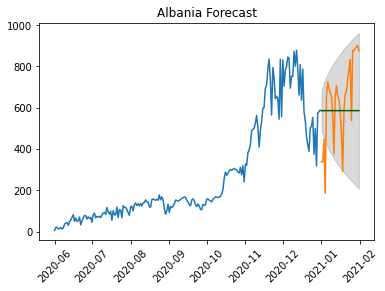

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.182 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

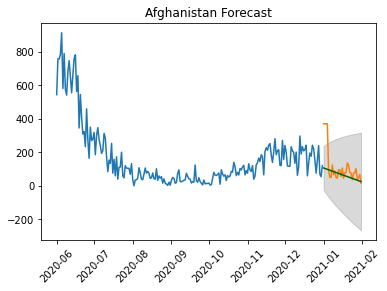

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.289 seconds
                               SARIMAX Results                 

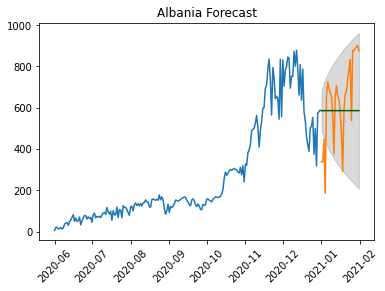

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.277 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

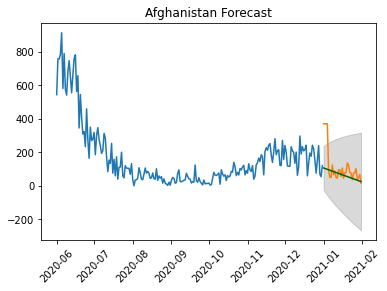

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.302 seconds
                               SARIMAX Results                 

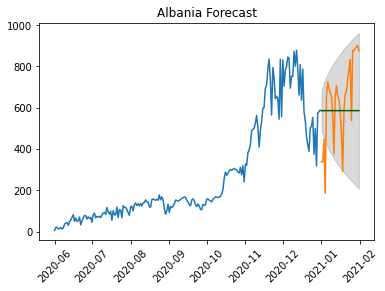

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.205 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

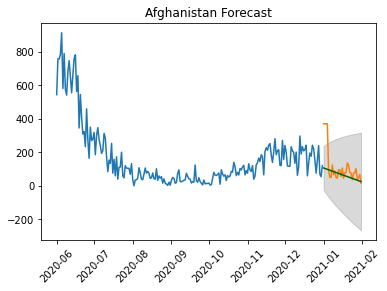

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.281 seconds
                               SARIMAX Results                 

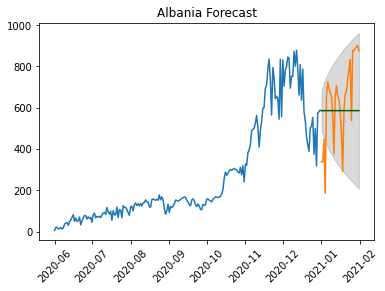

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.274 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

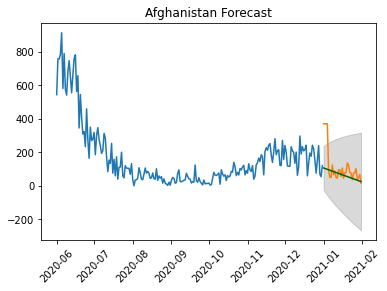

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.328 seconds
                               SARIMAX Results                 

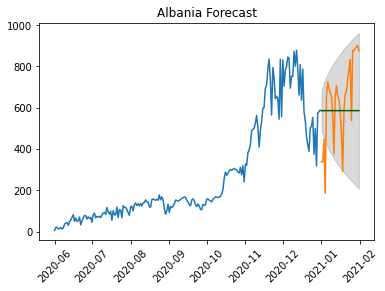

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.290 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

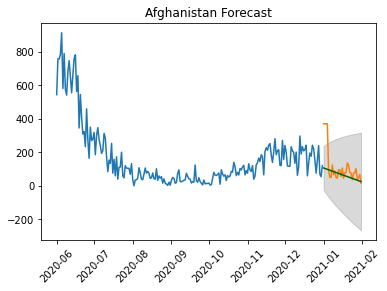

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.318 seconds
                               SARIMAX Results                 

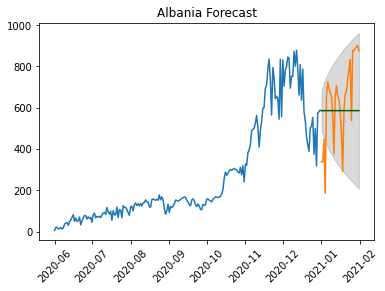

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.173 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

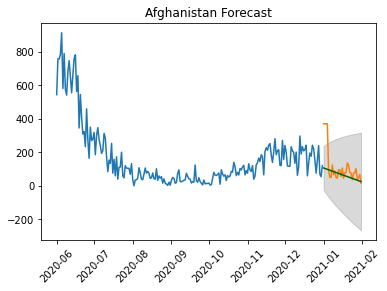

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.289 seconds
                               SARIMAX Results                 

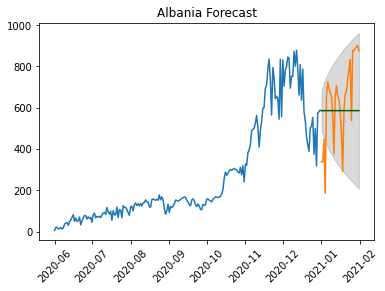

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.288 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

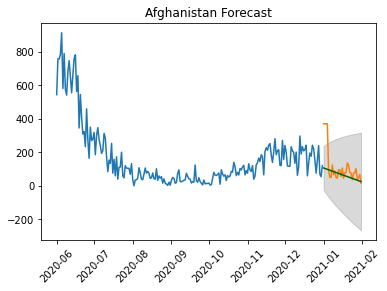

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.635 seconds
                               SARIMAX Results                 

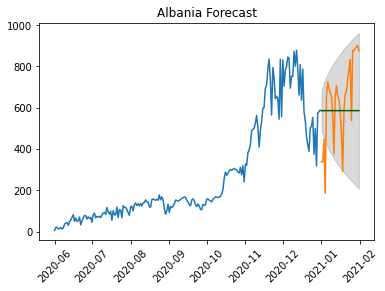

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.297 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

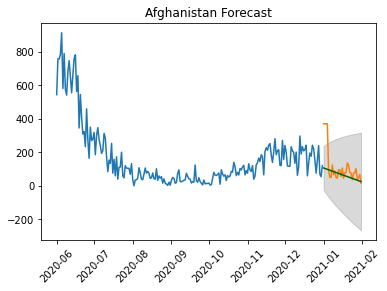

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.24 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.320 seconds
                               SARIMAX Results                 

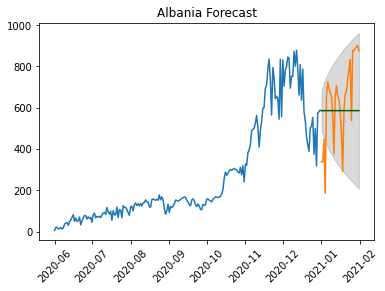

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.183 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

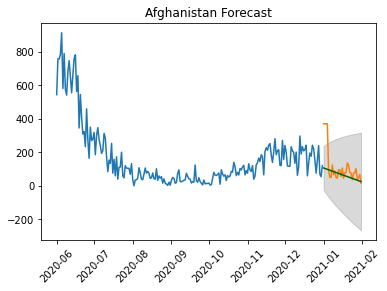

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.254 seconds
                               SARIMAX Results                 

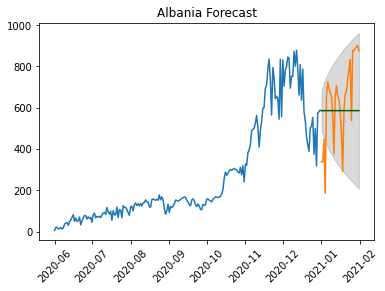

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.198 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

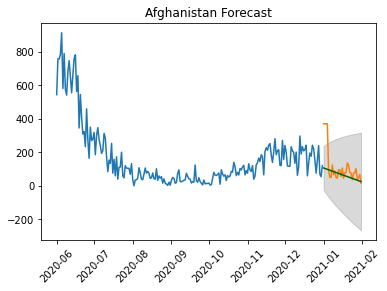

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.262 seconds
                               SARIMAX Results                 

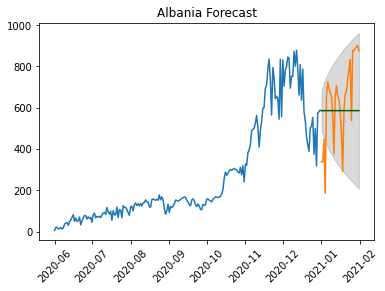

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.349 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

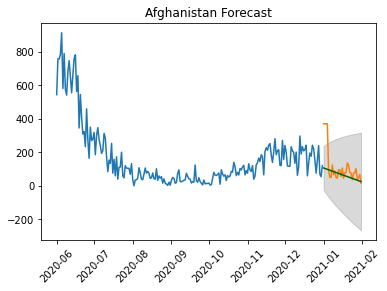

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.347 seconds
                               SARIMAX Results                 

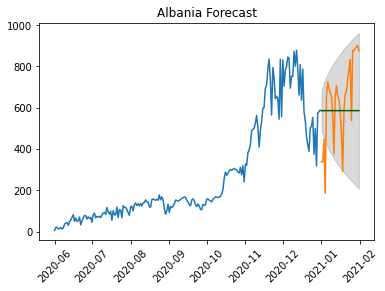

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.300 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

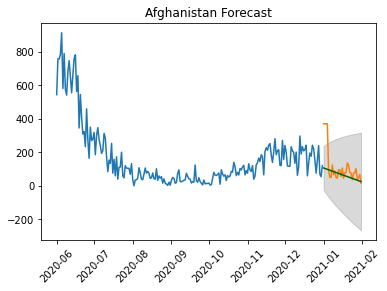

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.291 seconds
                               SARIMAX Results                 

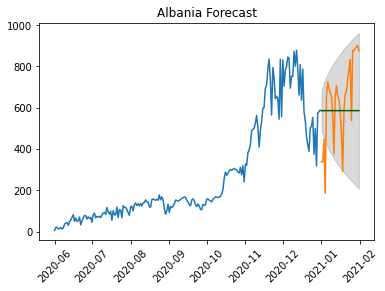

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.239 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

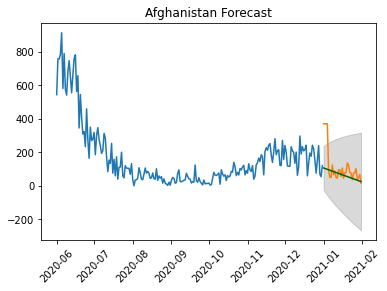

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.276 seconds
                               SARIMAX Results                 

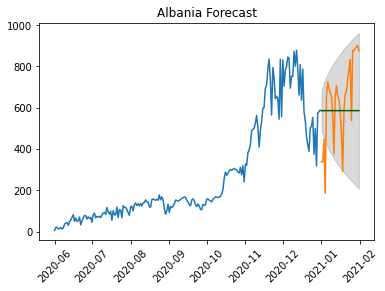

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.361 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

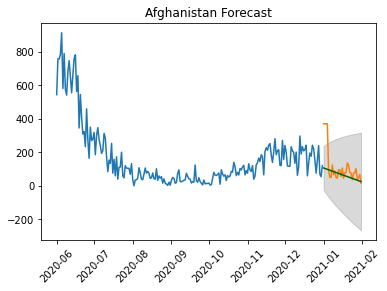

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.324 seconds
                               SARIMAX Results                 

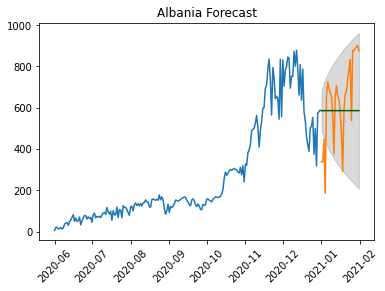

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.282 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

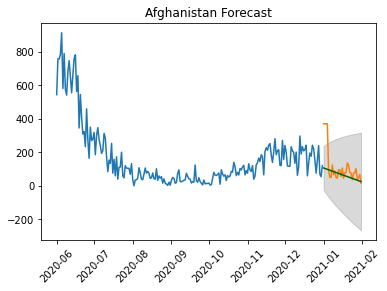

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.309 seconds
                               SARIMAX Results                 

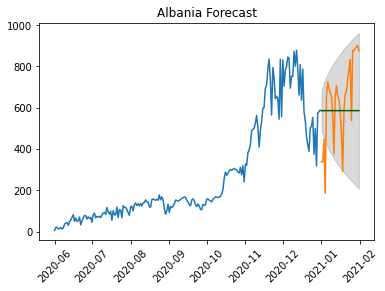

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.327 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

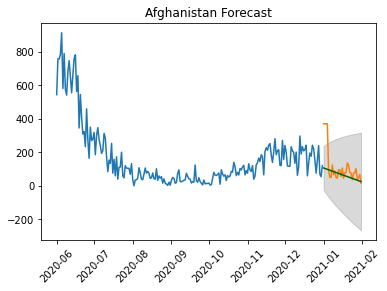

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.268 seconds
                               SARIMAX Results                 

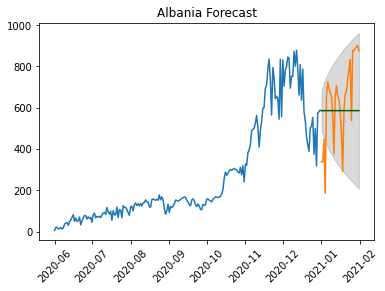

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.360 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

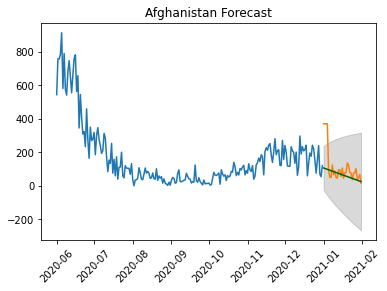

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.366 seconds
                               SARIMAX Results                 

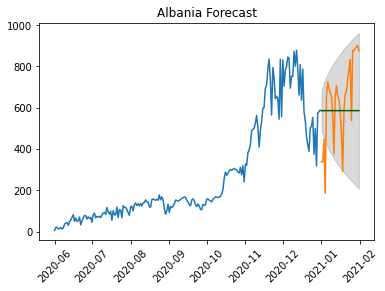

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.369 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

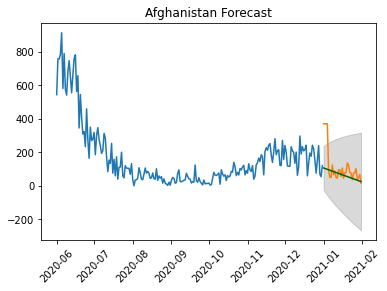

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.22 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.300 seconds
                               SARIMAX Results                 

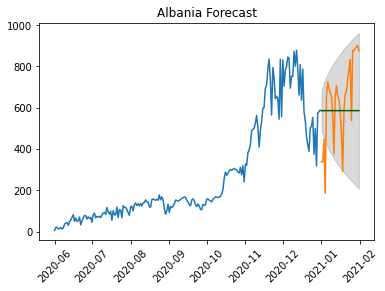

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.325 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

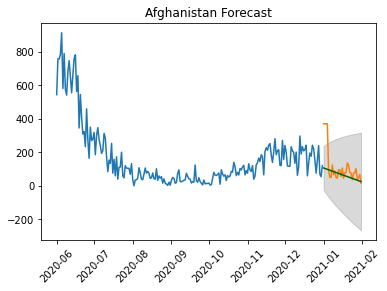

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.24 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.423 seconds
                               SARIMAX Results                 

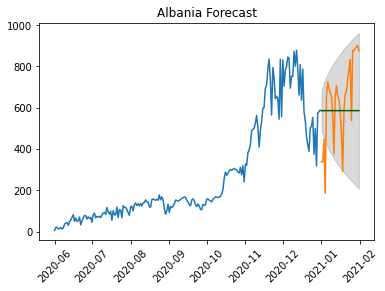

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.328 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

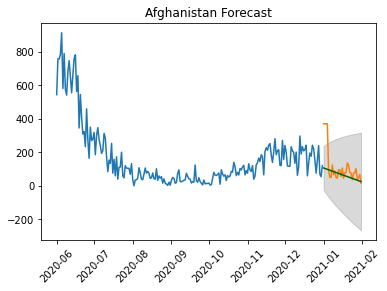

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.332 seconds
                               SARIMAX Results                 

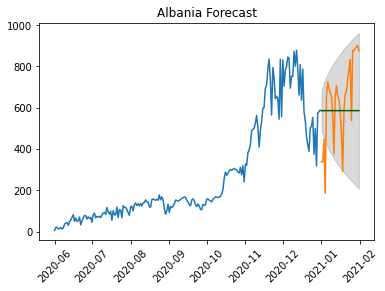

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.301 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

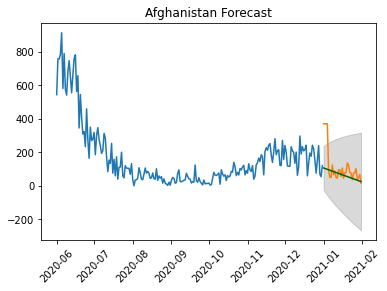

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.431 seconds
                               SARIMAX Results                 

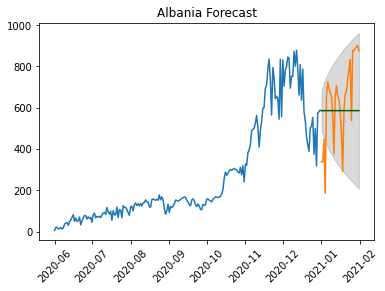

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.283 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

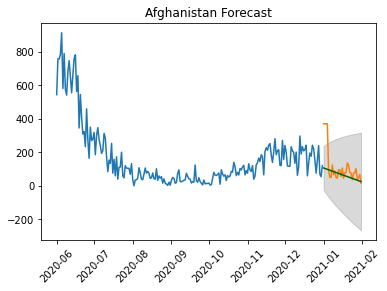

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.28 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.422 seconds
                               SARIMAX Results                 

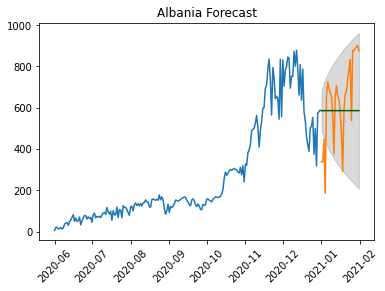

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.708 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

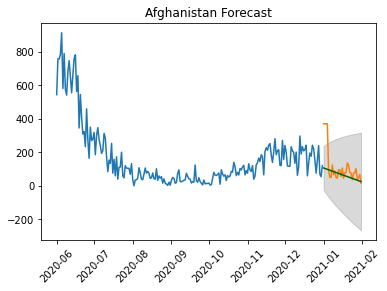

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.23 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.328 seconds
                               SARIMAX Results                 

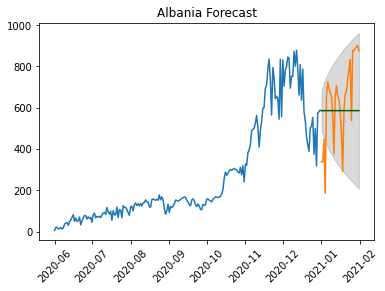

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.324 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

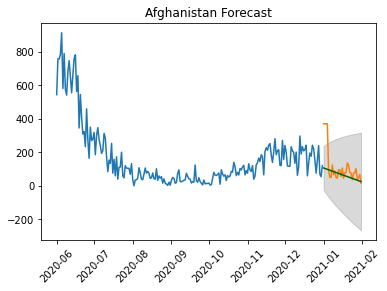

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.343 seconds
                               SARIMAX Results                 

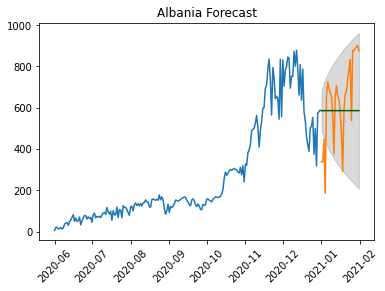

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.241 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

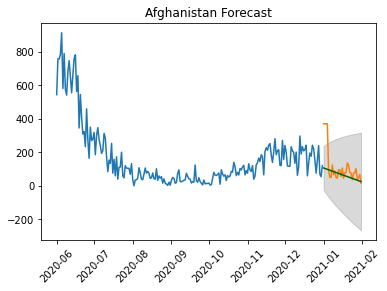

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.342 seconds
                               SARIMAX Results                 

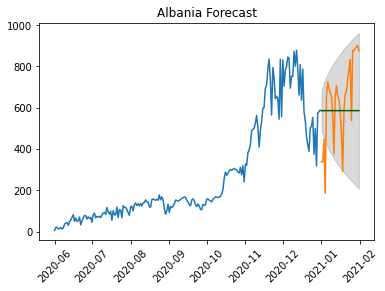

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.289 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

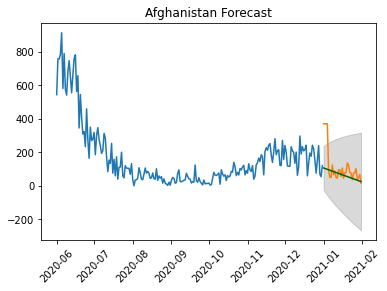

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.27 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.404 seconds
                               SARIMAX Results                 

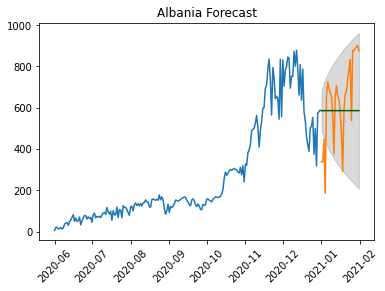

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.303 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

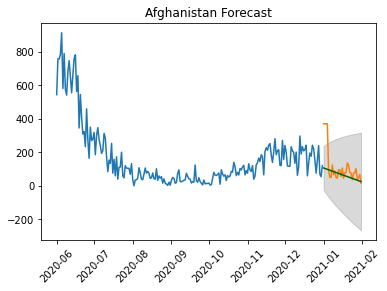

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.30 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.408 seconds
                               SARIMAX Results                 

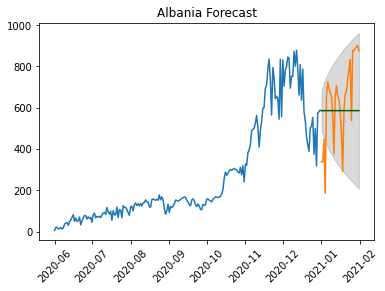

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.318 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

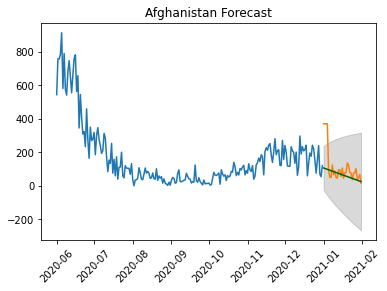

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.367 seconds
                               SARIMAX Results                 

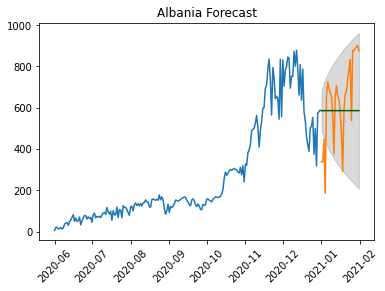

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.366 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

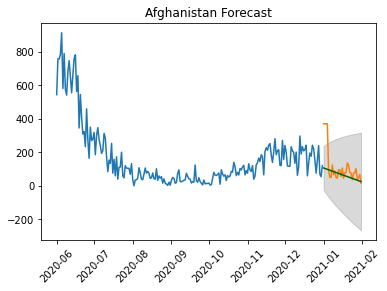

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.368 seconds
                               SARIMAX Results                 

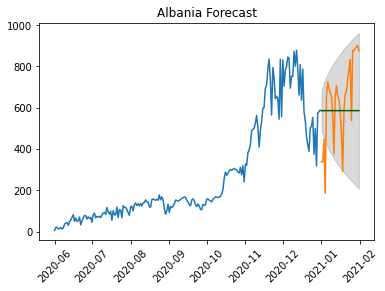

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.310 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

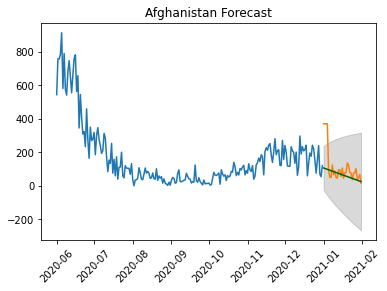

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.390 seconds
                               SARIMAX Results                 

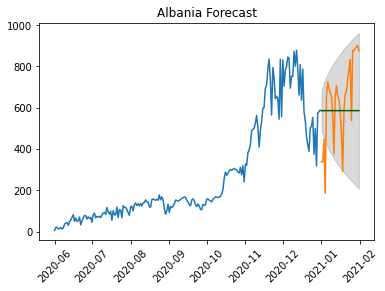

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.307 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

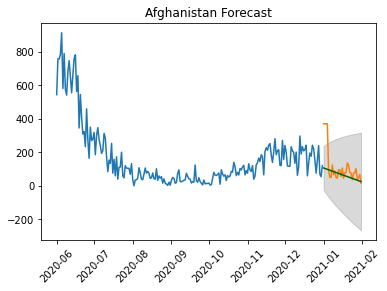

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.322 seconds
                               SARIMAX Results                 

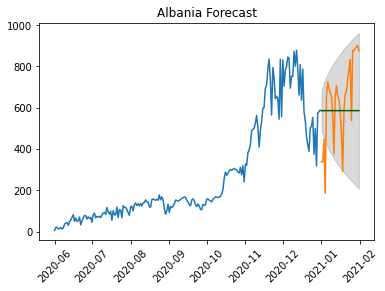

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.343 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

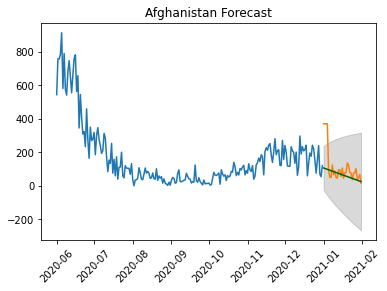

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.23 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.453 seconds
                               SARIMAX Results                 

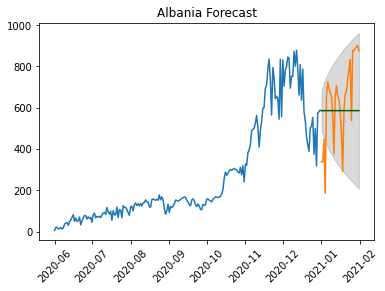

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.261 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

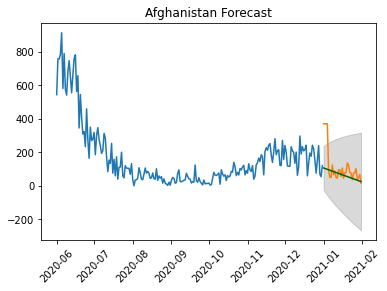

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.321 seconds
                               SARIMAX Results                 

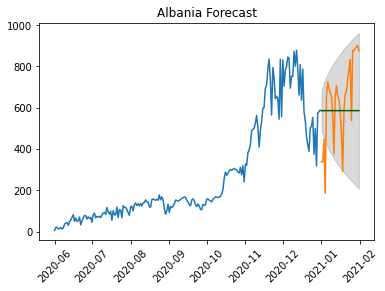

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.374 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

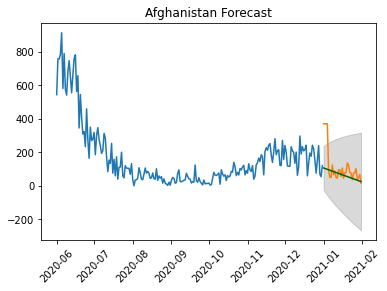

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.369 seconds
                               SARIMAX Results                 

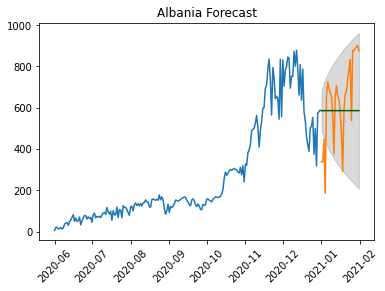

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.306 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

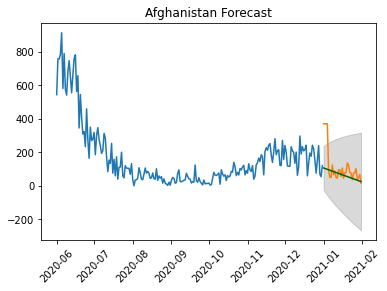

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.356 seconds
                               SARIMAX Results                 

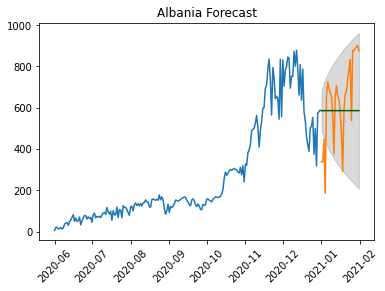

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.234 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

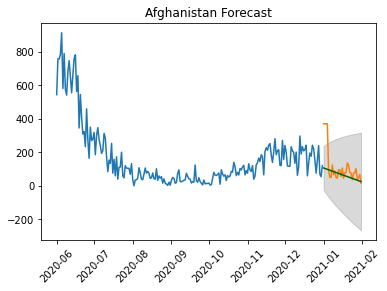

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.379 seconds
                               SARIMAX Results                 

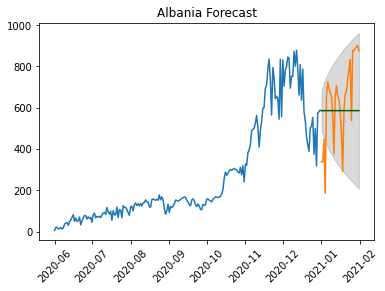

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.343 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

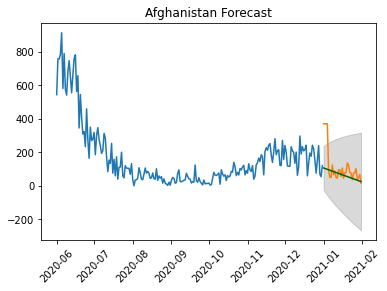

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.26 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.518 seconds
                               SARIMAX Results                 

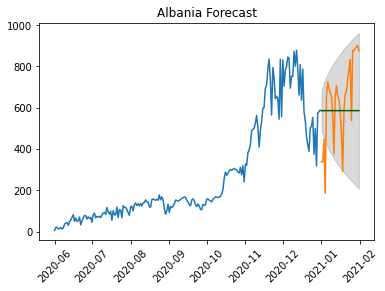

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.329 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

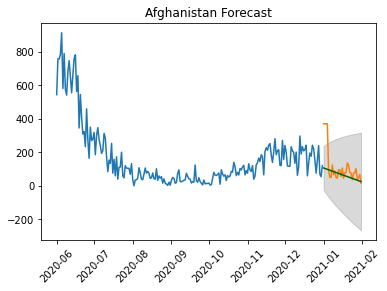

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.372 seconds
                               SARIMAX Results                 

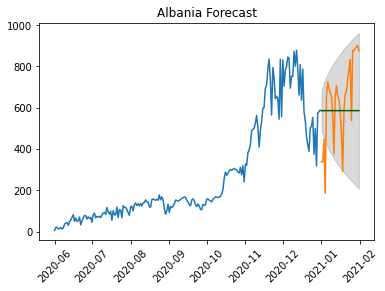

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.377 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

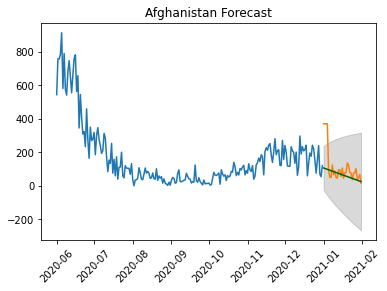

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.18 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.341 seconds
                               SARIMAX Results                 

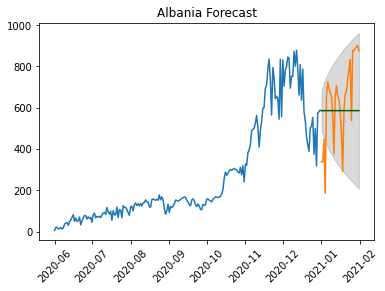

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.359 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

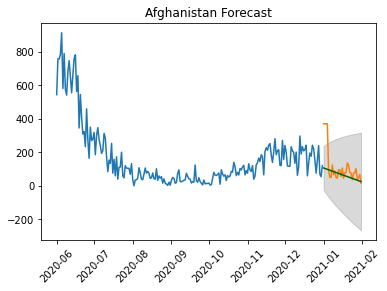

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.397 seconds
                               SARIMAX Results                 

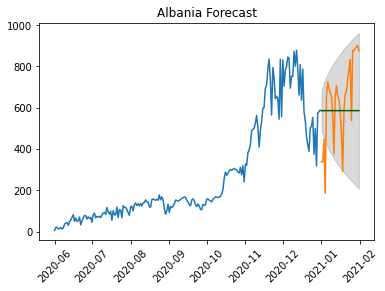

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.365 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

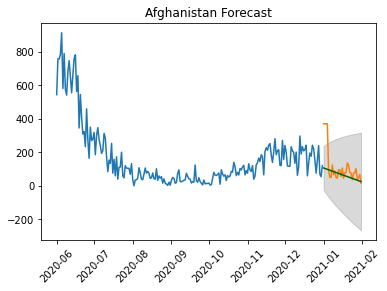

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.381 seconds
                               SARIMAX Results                 

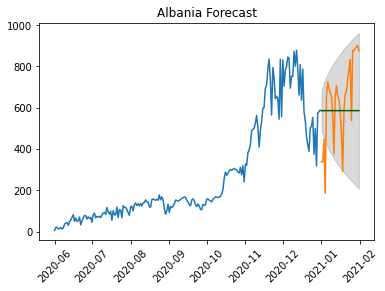

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.399 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

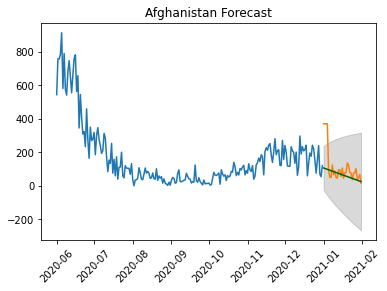

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.471 seconds
                               SARIMAX Results                 

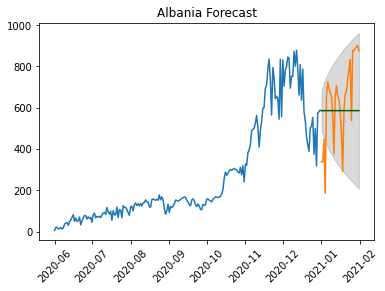

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.342 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

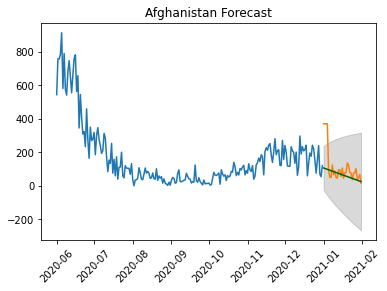

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.17 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.414 seconds
                               SARIMAX Results                 

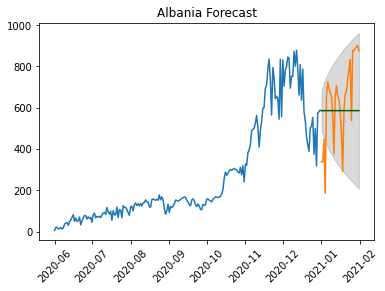

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.370 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

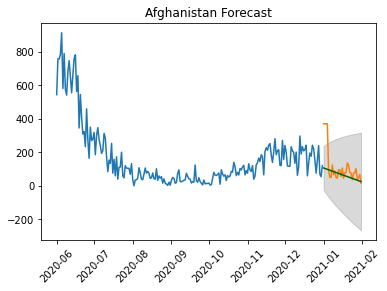

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.20 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.484 seconds
                               SARIMAX Results                 

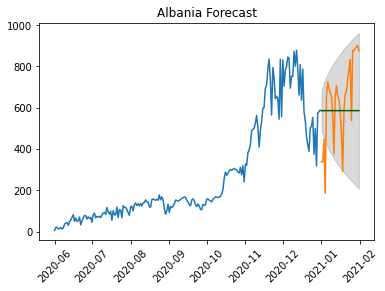

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.349 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

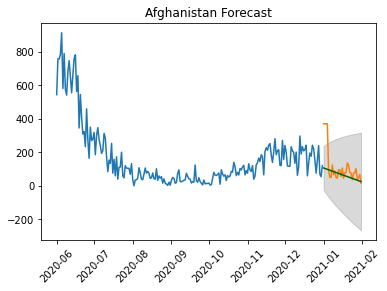

mape =  0.44841282440826
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2300.858, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2376.665, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2298.956, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2317.167, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2375.061, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2300.857, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2302.857, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2298.313, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2300.151, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2300.155, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2316.881, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2302.151, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.431 seconds
                               SARIMAX Results                 

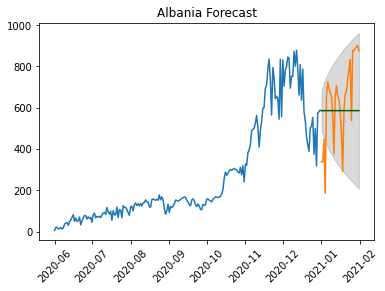

mape =  0.3262890774412684
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2406.074, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2475.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2427.663, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2404.189, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2473.264, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2406.068, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2407.469, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2404.646, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.359 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  214
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -1199.094
Date:                Fri, 05 Feb 2021   AIC                           2404.189
Time:    

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import pmdarima as pm
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

df = pd.read_csv('final_res_global.csv')
countries = np.unique(df['Country'])

# Set the training/validating time period
# Update Manually
n_of_train = 214            # Jun - Dec 2020
n_of_test = 31              # Jan 2021
n_of_unuse = 375 - n_of_train - n_of_test
test_start = '1/1/2021'

data = []
wholeGlobal  = pd.DataFrame(data, columns = ['Actual', 'Forecast']) 
wholeGlobal['Actual'] = [0] * n_of_test
wholeGlobal['Forecast'] = [0] * n_of_test

past = pd.DataFrame(data, columns = ['Past'])
past['Past'] = [0] * n_of_train

mape_output = pd.DataFrame(data, columns = ['Country', 'MAPE']) 

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  
    mpe = np.mean((forecast - actual)/actual)   
    return(mape, mpe)

# Iterate each countries to train the model and get the foreacast number for countries
for i in range(len(countries)): 
 for i in range(2): 
    country_df = df.loc[df['Country'] == countries[i]]
    country_df = country_df[['Date', 'New case']]
    country_df.set_index('Date', inplace=True)    
    country_df.index = (pd.date_range(start='1/23/2020', periods= len(country_df)))
    
    # Split the training / testing dataset
    tv = ['unuse']*n_of_unuse+['train']*n_of_train+ ['test']*n_of_test
    country_df['cat'] = tv
    
    # Data Noise Adjustment
    for j in range(len(country_df)):
        if country_df.iloc[j,0] > 0:
            pass        
        elif j < (len(country_df) - 2) and country_df.iloc[j,0] < 0:
            country_df.iloc[j,0] = (country_df.iloc[j-1,0] + country_df.iloc[j + 1,0])/2
        elif j < (len(country_df) - 2) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] != 0):
            country_df.iloc[j,0] = 0.5 * (country_df.iloc[j+1,0])
            country_df.iloc[j+1,0] = 0.5 * (country_df.iloc[j+1,0])       
        elif j < (len(country_df) - 3) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] == 0) and (country_df.iloc[j+2,0] != 0): 
                country_df.iloc[j,0] = 1/3 * (country_df.iloc[j+2,0])
                country_df.iloc[j+1,0] = 1/3 * (country_df.iloc[j+2,0])
                country_df.iloc[j+2,0] = 1/3 * (country_df.iloc[j+2,0])
        elif j < (len(country_df) - 3) and (country_df.iloc[j,0] == 0) and (country_df.iloc[j+1,0] == 0) and (country_df.iloc[j+2,0] == 0): 
                country_df.iloc[j,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+1,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+2,0] = 1/4 * (country_df.iloc[j+3,0])
                country_df.iloc[j+3,0] = 1/4 * (country_df.iloc[j+3,0])
                       
    train_df = country_df.loc[country_df['cat'] == 'train']
    test_df = country_df.loc[country_df['cat'] == 'test']
    
    # Apply Auto Arima Model
    model = pm.auto_arima(train_df['New case'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
    print(model.summary())

    fc, confint = model.predict(n_periods=n_of_test, return_conf_int=True)
    index_of_fc = pd.date_range(start=test_start, periods=n_of_test)
    
    # make series for plotting purpose
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot                                 
    plt.plot(train_df['New case'])
    plt.plot(test_df['New case'])
    plt.plot(fc_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)    
    plt.xticks(rotation=45)
    title = countries[i]+ " Forecast"
    plt.title(title)
    plt.show() 

    mape, mpe = forecast_accuracy(fc, test_df['New case'].values)
    print('mape = ', mape)
    
    mape_output.loc[i] = [countries[i], mape]
    wholeGlobal['Actual'] = wholeGlobal['Actual'] + test_df['New case'].values
    wholeGlobal['Forecast'] = wholeGlobal['Forecast'] + fc
    past['Past'] = past['Past'] + train_df['New case'].values

wholeGlobal.index = test_df.index
past.index = train_df.index

# ----------------------------------------------------------------------------------------
# Global Forecasting (aggregate all the countries)
# Plot US forecasting

plt.plot(past['Past'])
plt.plot(wholeGlobal['Actual'])
plt.plot(wholeGlobal['Forecast'], color='darkgreen')
plt.xticks(rotation=45)
plt.title("Global Forecast - Aggregate from 192 countries")
plt.show() 

mape, mpe = forecast_accuracy(wholeGlobal['Actual'], wholeGlobal['Forecast'])
print('mape = ', mape)  

# ----------------------------------------------------------------------------------------
# Global Forecasting (Not aggregate)

model2 = pm.auto_arima(past['Past'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)

fc, confint = model2.predict(n_periods=n_of_test, return_conf_int=True)
index_of_fc = pd.date_range(start=test_start, periods=n_of_test)

fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(past['Past'])
plt.plot(wholeGlobal['Actual'])
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)
plt.xticks(rotation=45)
plt.title("Global Forecast - from Global Total New Cases")
plt.show()   

mape, mpe = forecast_accuracy(fc, wholeGlobal['Actual'].values)
print('mape = ', mape)  

mape_output.loc[(len(mape_output))] = ['Global', mape]
mape_output.to_csv('Global_MAPE.csv')





## Auto ARIMA US

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.31 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.73 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

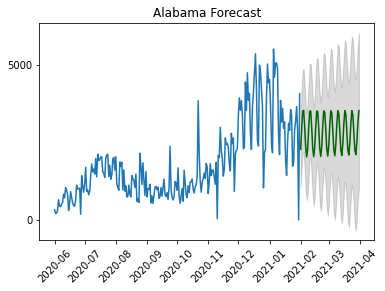

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.585 seconds
                               SARIMAX Results                                
Dep. Vari

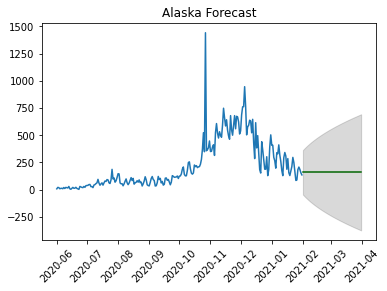

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.79 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.72 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

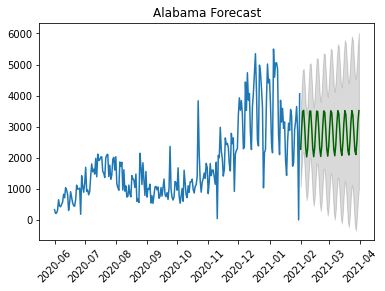

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.641 seconds
                               SARIMAX Results                                
Dep. Vari

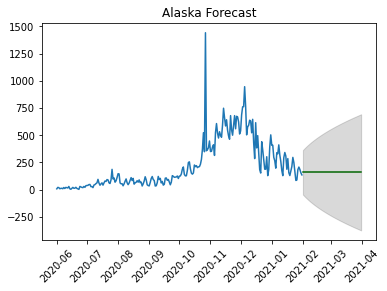

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.72 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

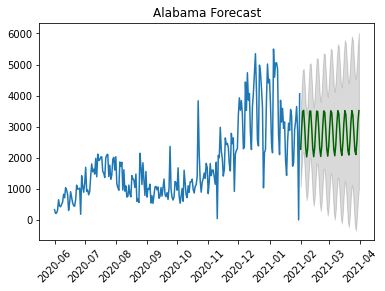

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.564 seconds
                               SARIMAX Results                                
Dep. Vari

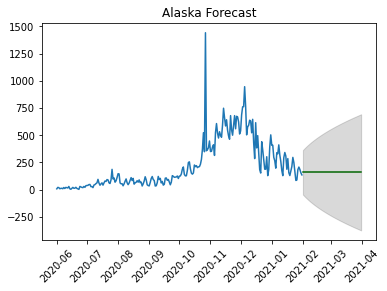

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.32 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.73 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

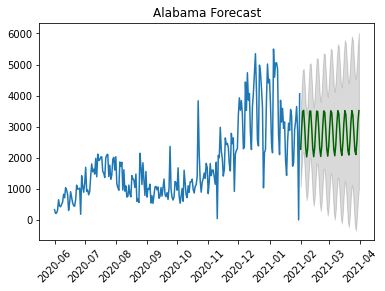

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.573 seconds
                               SARIMAX Results                                
Dep. Vari

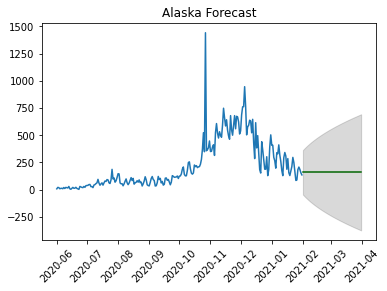

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.69 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

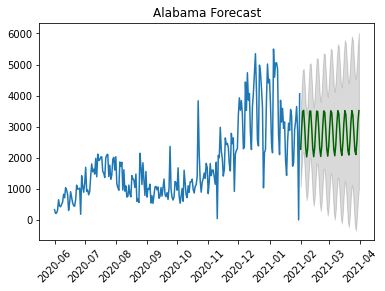

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.580 seconds
                               SARIMAX Results                                
Dep. Vari

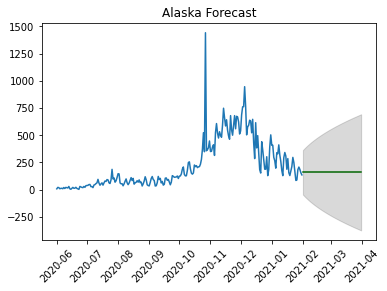

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.72 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

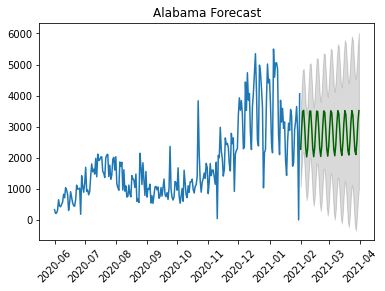

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.627 seconds
                               SARIMAX Results                                
Dep. Vari

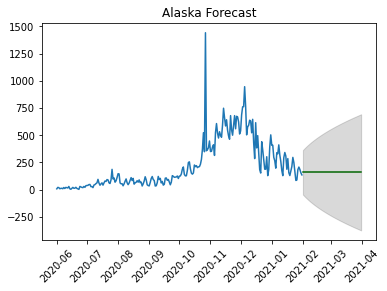

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.71 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

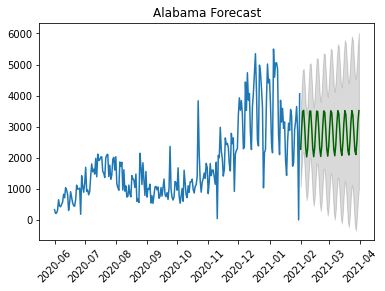

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.713 seconds
                               SARIMAX Results                                
Dep. Vari

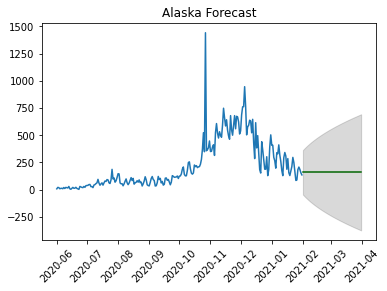

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

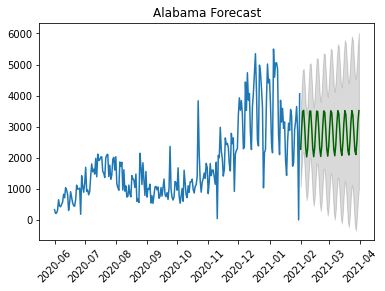

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.630 seconds
                               SARIMAX Results                                
Dep. Vari

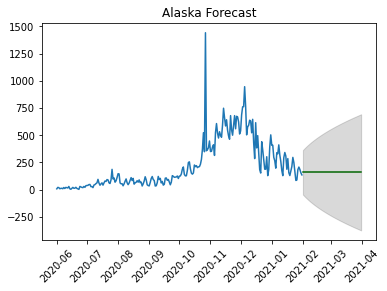

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

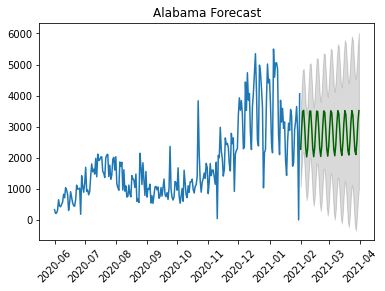

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.660 seconds
                               SARIMAX Results                                
Dep. Vari

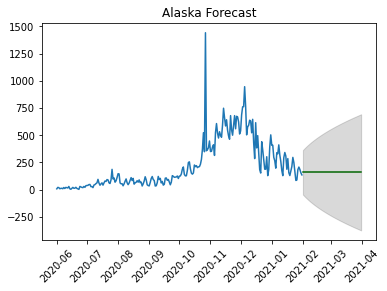

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.32 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.70 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

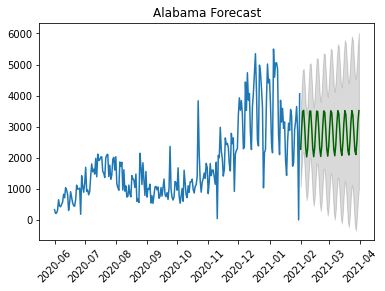

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.738 seconds
                               SARIMAX Results                                
Dep. Vari

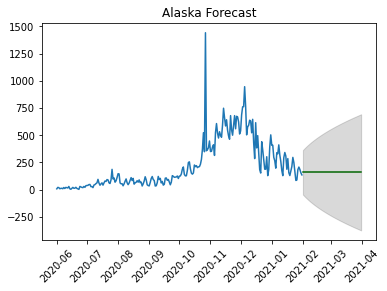

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.75 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

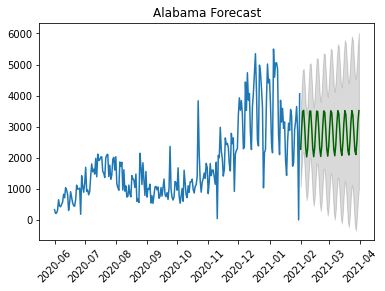

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.16 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.600 seconds
                               SARIMAX Results                                
Dep. Vari

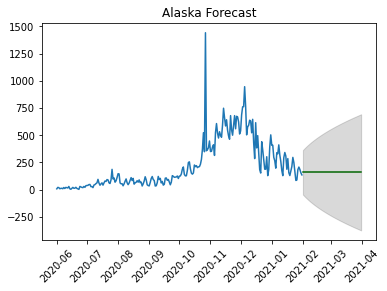

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.72 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

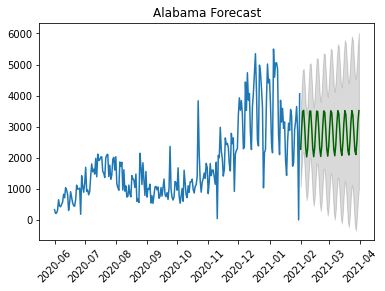

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.698 seconds
                               SARIMAX Results                                
Dep. Vari

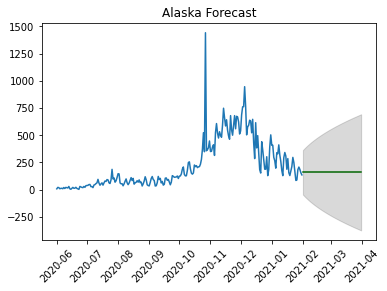

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.19 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

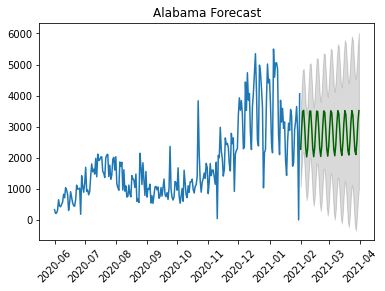

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.16 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.716 seconds
                               SARIMAX Results                                
Dep. Vari

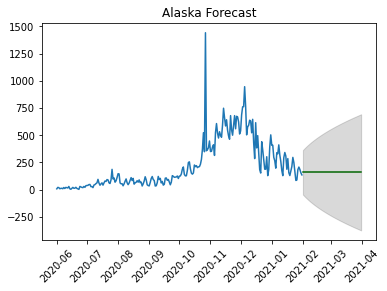

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.79 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

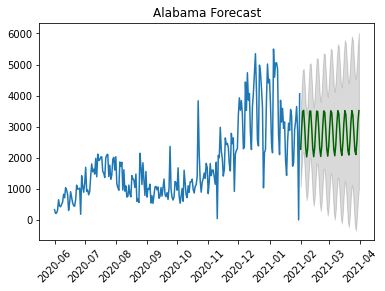

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.689 seconds
                               SARIMAX Results                                
Dep. Vari

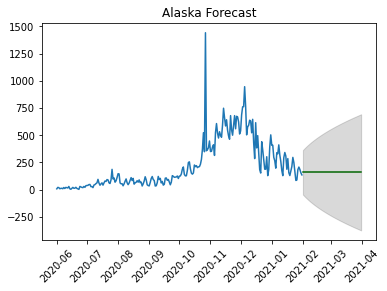

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

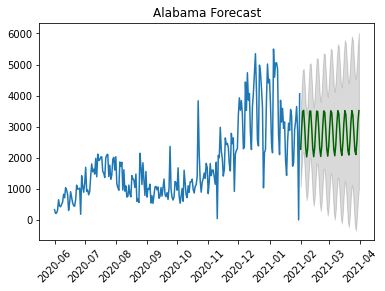

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.795 seconds
                               SARIMAX Results                                
Dep. Vari

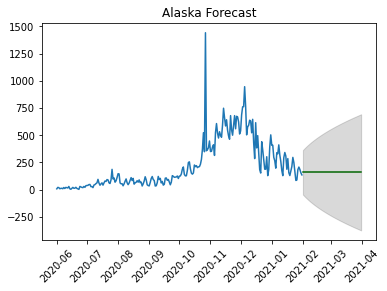

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.33 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.71 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

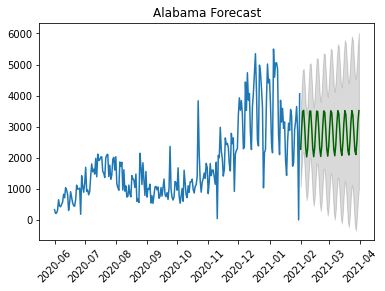

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.705 seconds
                               SARIMAX Results                                
Dep. Vari

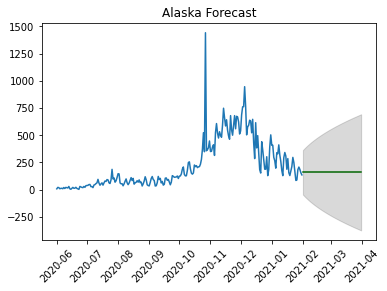

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.73 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

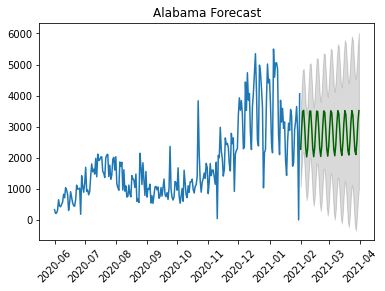

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.710 seconds
                               SARIMAX Results                                
Dep. Vari

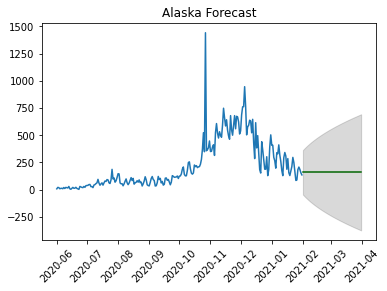

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.76 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.73 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

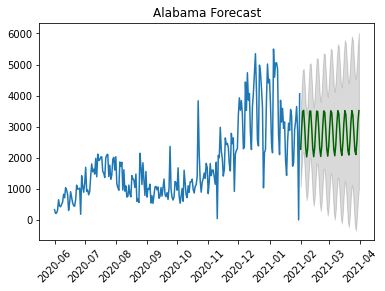

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.698 seconds
                               SARIMAX Results                                
Dep. Vari

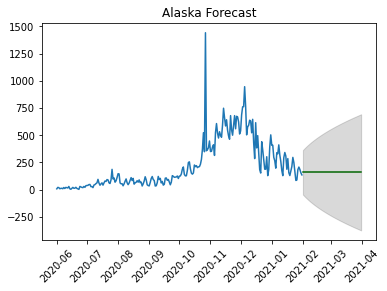

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.76 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.34 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.71 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

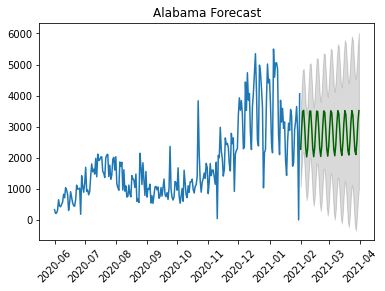

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.16 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.972 seconds
                               SARIMAX Results                                
Dep. Vari

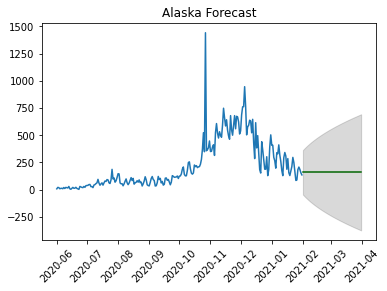

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.35 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.85 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

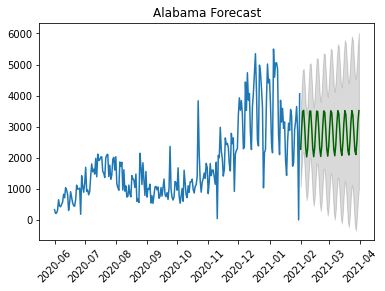

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.914 seconds
                               SARIMAX Results                                
Dep. Vari

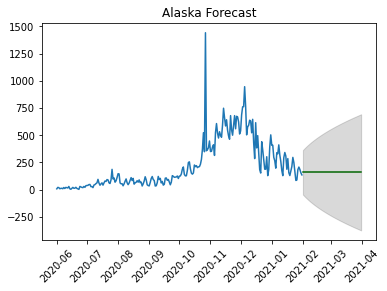

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.37 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

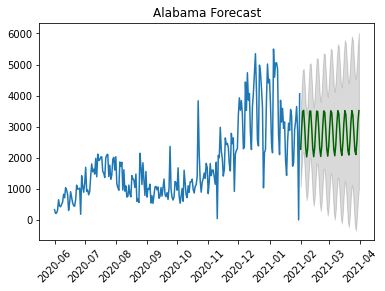

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.820 seconds
                               SARIMAX Results                                
Dep. Vari

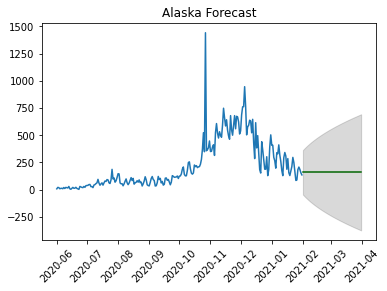

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.76 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.37 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

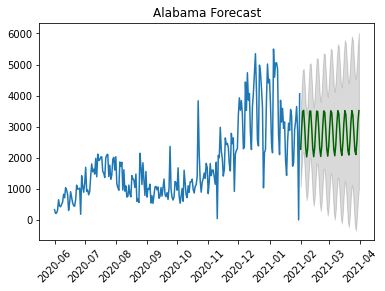

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.911 seconds
                               SARIMAX Results                                
Dep. Vari

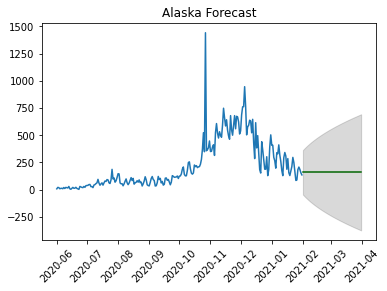

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.36 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.75 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

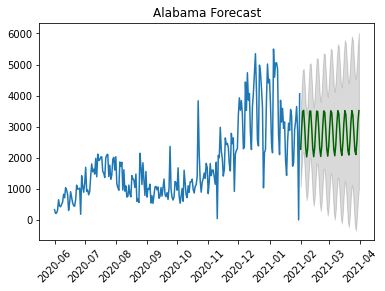

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.895 seconds
                               SARIMAX Results                                
Dep. Vari

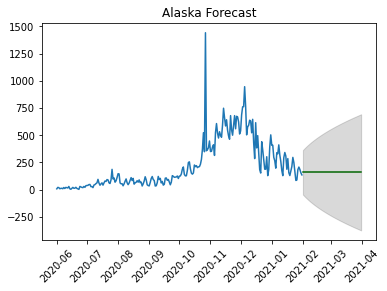

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.35 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.75 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

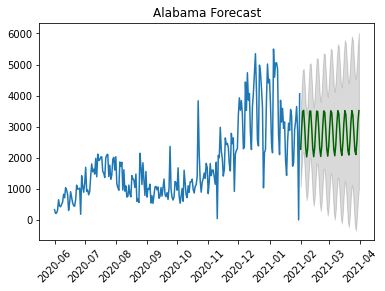

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.878 seconds
                               SARIMAX Results                                
Dep. Vari

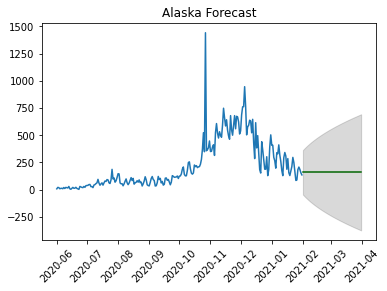

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.36 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

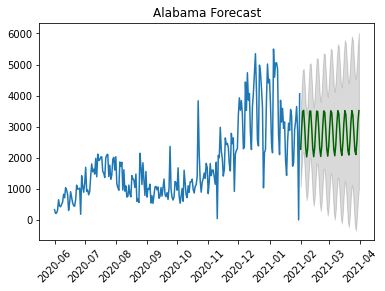

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.845 seconds
                               SARIMAX Results                                
Dep. Vari

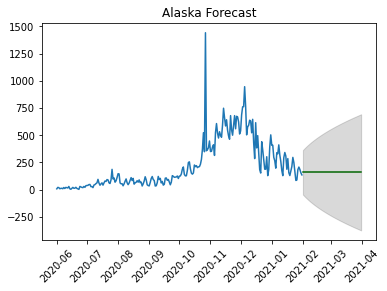

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.79 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.37 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.20 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.79 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

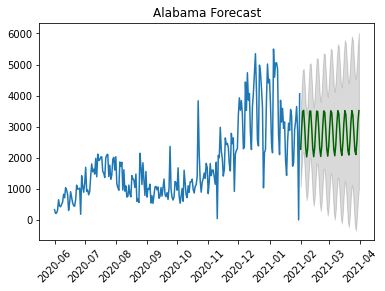

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.968 seconds
                               SARIMAX Results                                
Dep. Vari

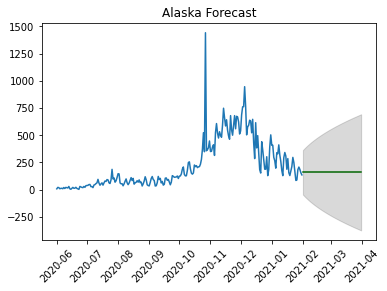

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.65 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.82 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.80 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

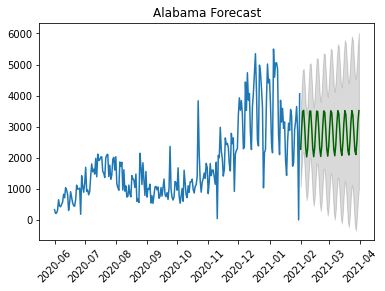

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.031 seconds
                               SARIMAX Results                                
Dep. Vari

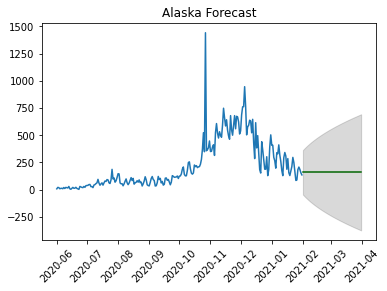

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.80 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.36 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

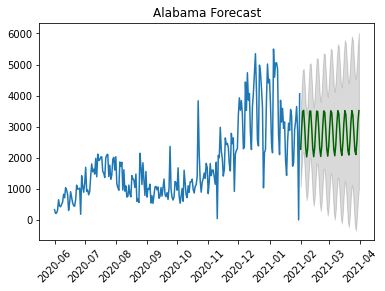

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.914 seconds
                               SARIMAX Results                                
Dep. Vari

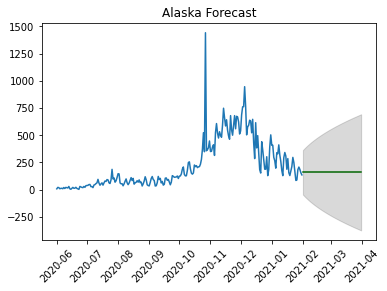

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.66 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.35 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.78 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

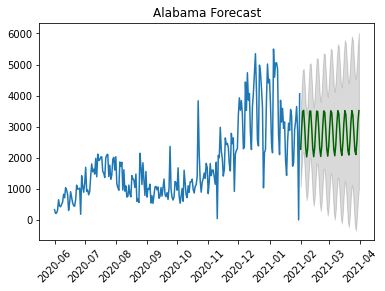

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.923 seconds
                               SARIMAX Results                                
Dep. Vari

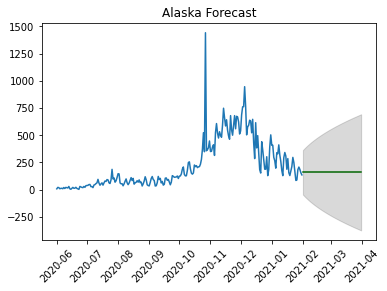

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.64 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.37 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

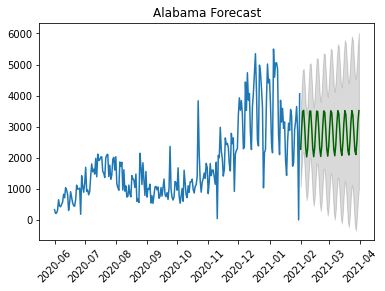

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.861 seconds
                               SARIMAX Results                                
Dep. Vari

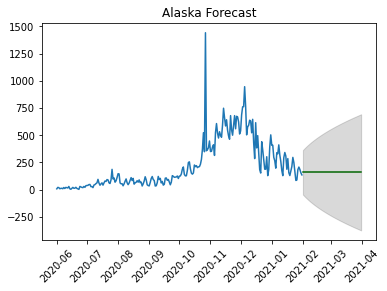

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.63 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.80 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

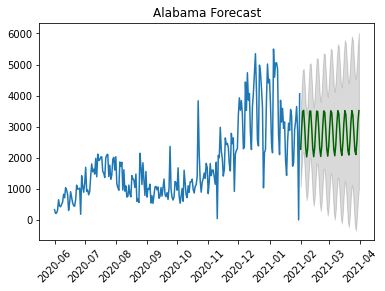

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.917 seconds
                               SARIMAX Results                                
Dep. Vari

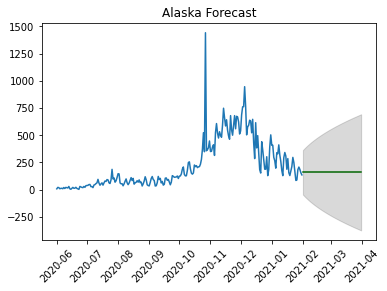

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.64 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.83 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.35 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

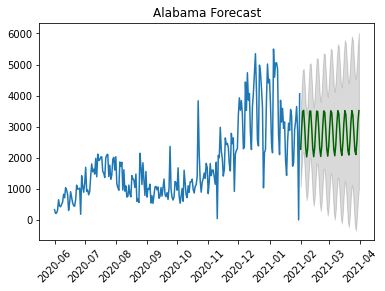

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2967.811, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3046.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2996.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2967.369, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3044.147, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2968.024, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2969.609, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2965.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2965.912, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2966.121, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2994.958, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2967.714, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.869 seconds
                               SARIMAX Results                                
Dep. Vari

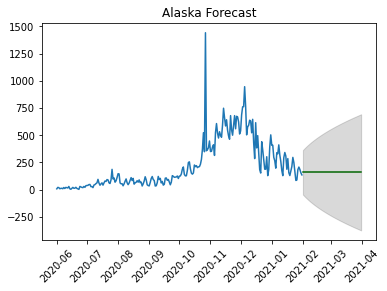

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3887.355, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3953.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3939.173, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3905.316, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3952.035, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3885.930, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3933.679, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3877.198, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3921.618, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3868.406, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3902.419, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3855.472, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3861.481, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3852.145, Time=0.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

import pmdarima as pm
from pandas.plotting import register_matplotlib_converters


register_matplotlib_converters()

df = pd.read_csv('final_res_US.csv')
states = np.unique(df['States'])

# Set the training/validating time period
# Manually Update the number of days here in this Section
n_of_train = 214 + 31   # Jun 2020 - Jan 2021
n_of_test = 0           # 0      
n_of_forecast = 28 + 31 # Feb - Mar 2021
n_of_unuse = 294 - n_of_train - n_of_test 
train_start = '6/1/2020'
forecast_start = '2/1/2021'

data = []
wholeUS  = pd.DataFrame(data, columns = ['Actual', 'Forecast']) 
wholeUS['Actual'] = [0] * n_of_forecast
wholeUS['Forecast'] = [0] * n_of_forecast

past = pd.DataFrame(data, columns = ['Past'])
past['Past'] = [0] * n_of_train
plt.locator_params(nbins=1, axis='both')

# Output File: Forecast Value
fc_output = pd.DataFrame(data, columns = ['Dates'])
fc_output['Dates'] = [0] * n_of_forecast

mape_output = pd.DataFrame(data, columns = ['States', 'MAPE']) 

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  
    mpe = np.mean((forecast - actual)/actual)   
    return(mape, mpe)

# Iterate each states to train the model and get the foreacast number for states
for i in range(len(states)): 
 for i in range(2): 
    state_df = df.loc[df['States'] == states[i]]
    state_df = state_df[['Date', 'New case']]
    state_df.set_index('Date', inplace=True) 
    state_df.index = (pd.date_range(start='4/13/2020', periods= len(state_df)))

    # Split the training / testing dataset
    tv = ['unuse']*n_of_unuse+['train']*n_of_train+ ['test']*n_of_test
    state_df['cat'] = tv
       
    # Data Noise Adjustment
    for j in range(len(state_df)):
        if state_df.iloc[j,0] > 0:
            pass        
        elif j < (len(state_df) - 2) and state_df.iloc[j,0] < 0:
            state_df.iloc[j,0] = (state_df.iloc[j-1,0] + state_df.iloc[j + 1,0])/2
        elif j < (len(state_df) - 2) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] != 0):
            state_df.iloc[j,0] = 0.5 * (state_df.iloc[j+1,0])
            state_df.iloc[j+1,0] = 0.5 * (state_df.iloc[j+1,0])       
        elif j < (len(state_df) - 3) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] == 0) and (state_df.iloc[j+2,0] != 0): 
                state_df.iloc[j,0] = 1/3 * (state_df.iloc[j+2,0])
                state_df.iloc[j+1,0] = 1/3 * (state_df.iloc[j+2,0])
                state_df.iloc[j+2,0] = 1/3 * (state_df.iloc[j+2,0])
        elif j < (len(state_df) - 3) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] == 0) and (state_df.iloc[j+2,0] == 0): 
                state_df.iloc[j,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+1,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+2,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+3,0] = 1/4 * (state_df.iloc[j+3,0])
           
    train_df = state_df.loc[state_df['cat'] == 'train']
    test_df = state_df.loc[state_df['cat'] == 'test']
     
    # Apply Auto Arima Model
    model = pm.auto_arima(train_df['New case'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
    print(model.summary())

    fc, confint = model.predict(n_periods=n_of_forecast, return_conf_int=True)
    index_of_fc = pd.date_range(start=forecast_start, periods=n_of_forecast)
    
    fc_output[states[i]] = fc.tolist()
    
    # make series for plotting purpose
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot each individual states                                 
    plt.plot(train_df['New case'])
    plt.plot(test_df['New case'])
    plt.plot(fc_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)
    
    plt.xticks(rotation=45)
    title = states[i]+ " Forecast"
    plt.title(title)
    plt.show() 

    wholeUS['Forecast'] = wholeUS['Forecast'] + fc
    past['Past'] = past['Past'] + train_df['New case'].values

wholeUS.index = pd.date_range(start=forecast_start, periods=n_of_forecast)
past.index = pd.date_range(start=train_start, periods=n_of_train)
fc_output['Dates'] = pd.date_range(start=forecast_start, periods=n_of_forecast)

# ----------------------------------------------------------------------------------------
# US Forecasting (aggregate all the states)
# Plot US forecasting
plt.plot(past['Past'])
plt.plot(wholeUS['Forecast'], color='darkgreen')
plt.xticks(rotation=45)
plt.title("United States Forecast - Aggregate from 58 States")
plt.show() 

# ----------------------------------------------------------------------------------------
# US Forecasting (Not aggregate)
model2 = pm.auto_arima(past['Past'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
fc, confint = model2.predict(n_periods=n_of_forecast, return_conf_int=True)
index_of_fc = pd.date_range(start=forecast_start, periods = n_of_forecast)

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)
fc_series.index = pd.date_range(start=forecast_start, periods=n_of_forecast)
# Plot
plt.plot(past['Past'])
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)
plt.xticks(rotation=45)
plt.title("US Forecast - from US Total New Cases")
plt.show()  

# Output the forecast time series data
fc_output['US'] = fc.tolist()
fc_output.to_csv('US_FebMar.csv')




Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.65 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.43 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.92 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept

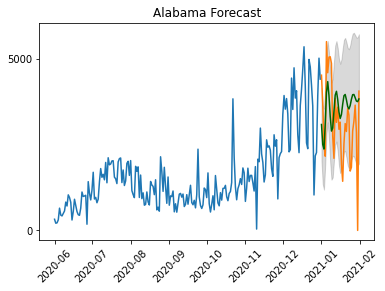

mape =  inf


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.592 seconds
                               SARIMAX Results                                
Dep. Vari

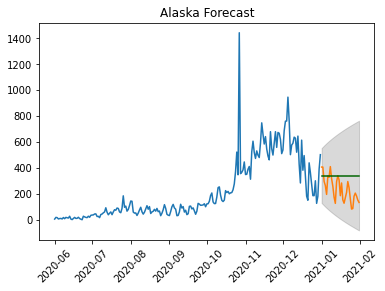

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.63 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.43 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.25 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.90 sec
 ARIMA

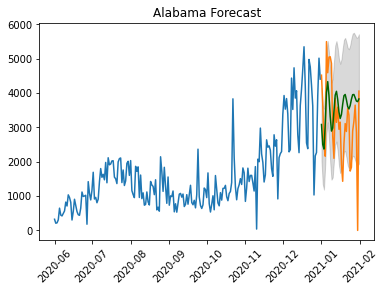

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.517 seconds
                               SARIMAX Results                              

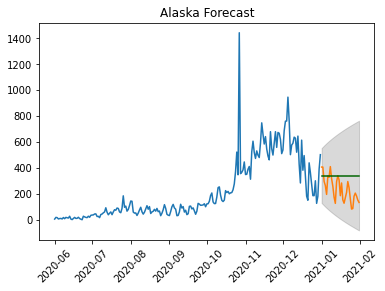

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.52 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.64 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.43 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.90 sec
 ARIMA

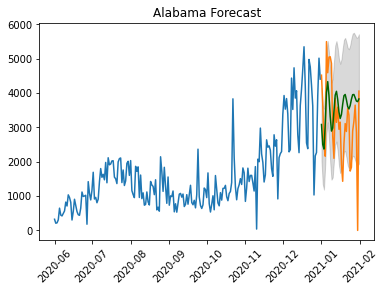

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.533 seconds
                               SARIMAX Results                              

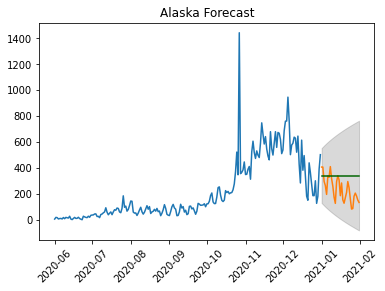

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.62 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.44 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.89 sec
 ARIMA

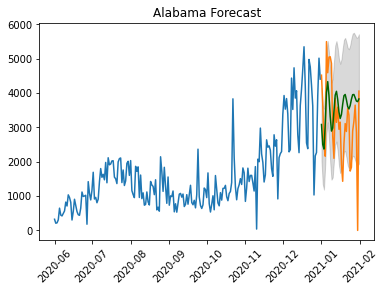

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.567 seconds
                               SARIMAX Results                              

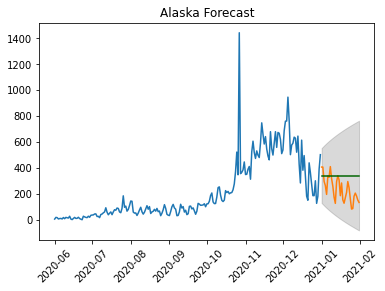

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

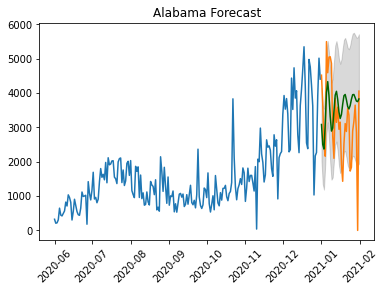

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.586 seconds
                               SARIMAX Results                              

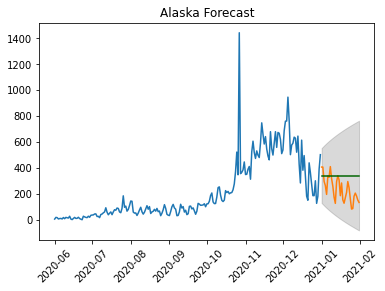

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.66 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.45 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.88 sec
 ARIMA

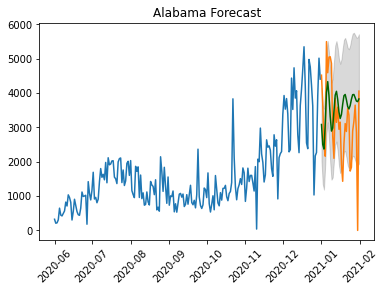

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.681 seconds
                               SARIMAX Results                              

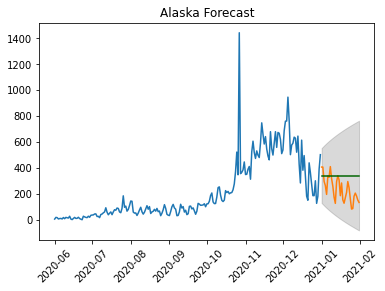

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.67 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

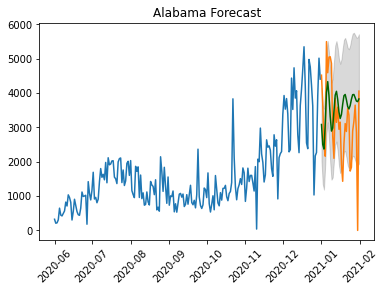

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.679 seconds
                               SARIMAX Results                              

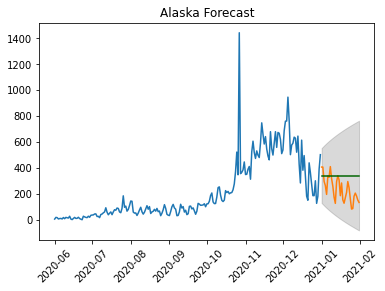

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.67 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.45 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

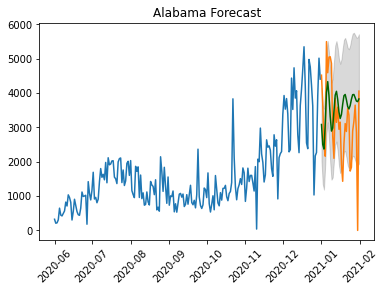

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.658 seconds
                               SARIMAX Results                              

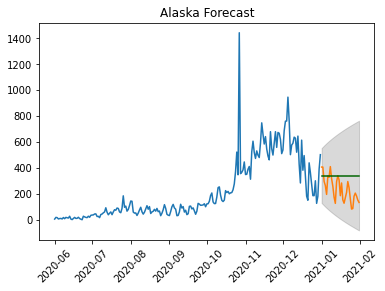

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.67 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.92 sec
 ARIMA

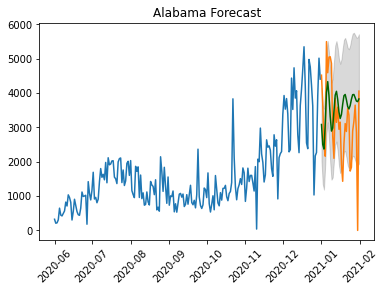

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.759 seconds
                               SARIMAX Results                              

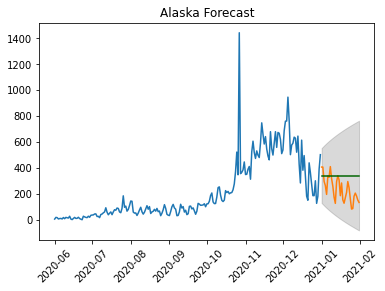

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.63 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.96 sec
 ARIMA

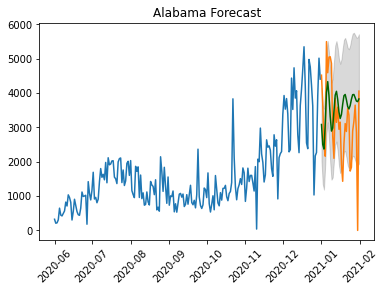

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.720 seconds
                               SARIMAX Results                              

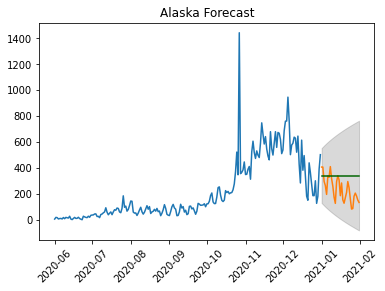

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.68 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

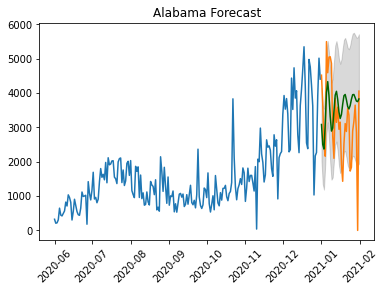

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.765 seconds
                               SARIMAX Results                              

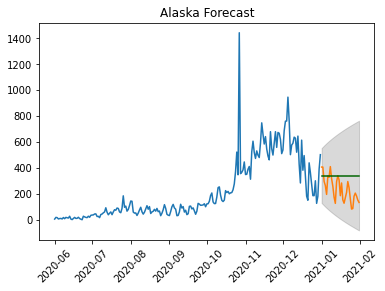

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.67 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.92 sec
 ARIMA

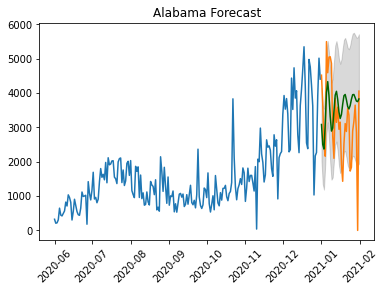

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.703 seconds
                               SARIMAX Results                              

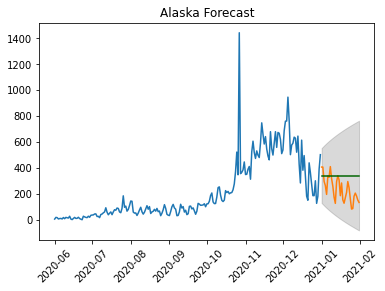

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.46 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.92 sec
 ARIMA

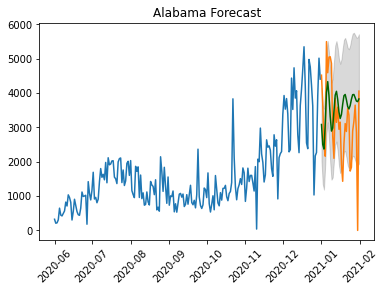

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.694 seconds
                               SARIMAX Results                              

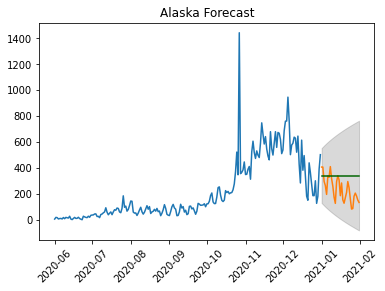

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.53 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

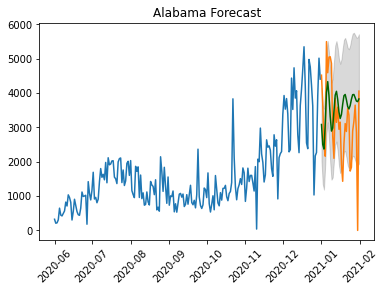

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.799 seconds
                               SARIMAX Results                              

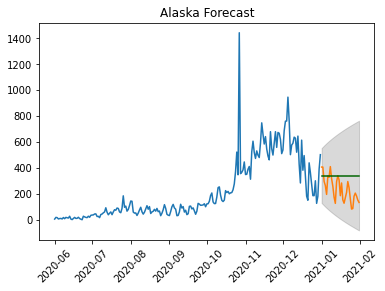

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.68 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.45 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

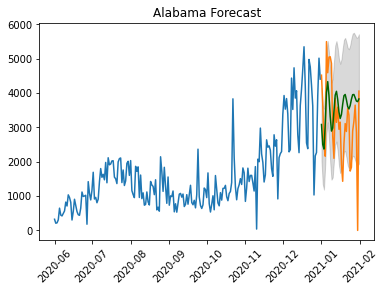

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.774 seconds
                               SARIMAX Results                              

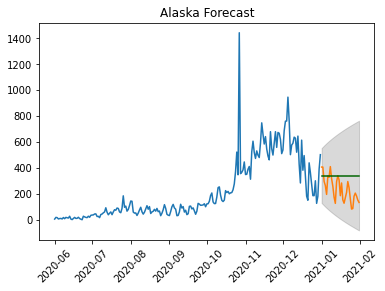

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.52 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

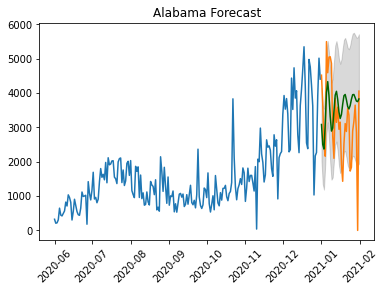

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.763 seconds
                               SARIMAX Results                              

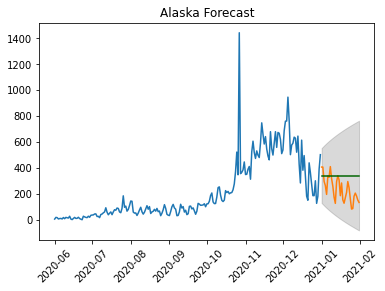

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.46 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

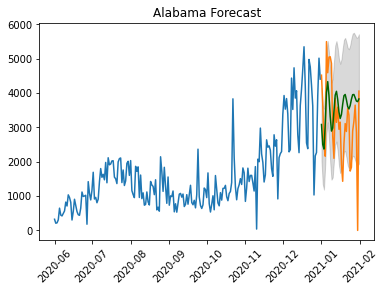

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.811 seconds
                               SARIMAX Results                              

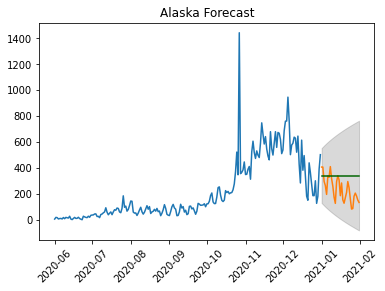

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

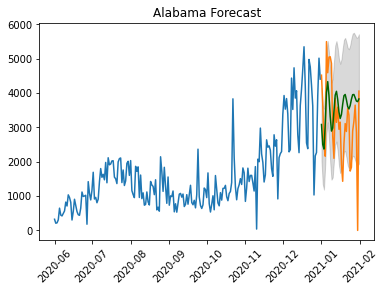

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.807 seconds
                               SARIMAX Results                              

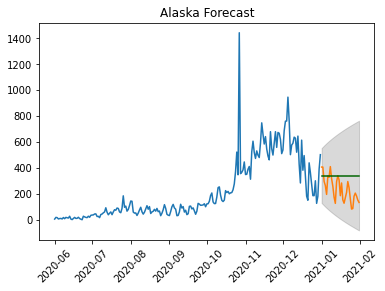

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

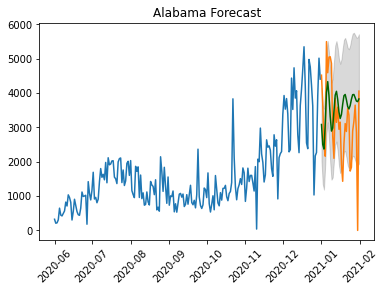

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.866 seconds
                               SARIMAX Results                              

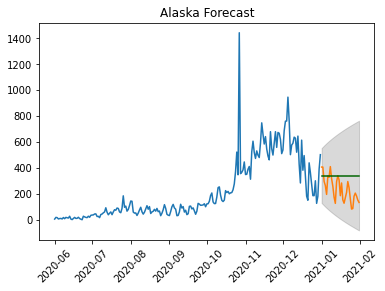

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.45 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

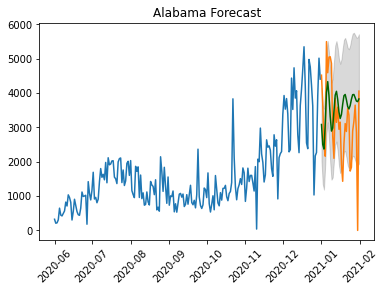

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.794 seconds
                               SARIMAX Results                              

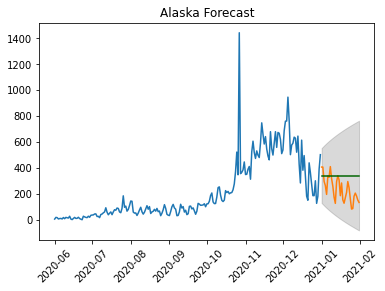

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

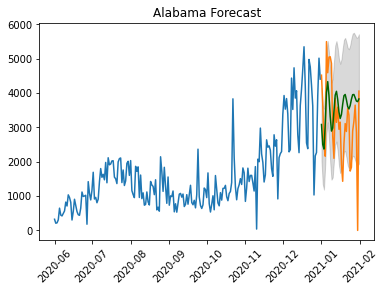

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.898 seconds
                               SARIMAX Results                              

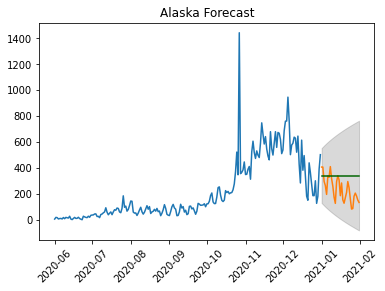

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.99 sec
 ARIMA

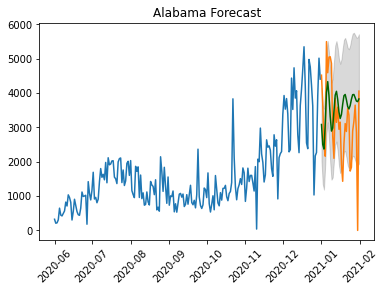

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.857 seconds
                               SARIMAX Results                              

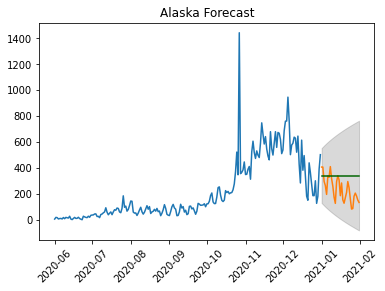

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.67 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

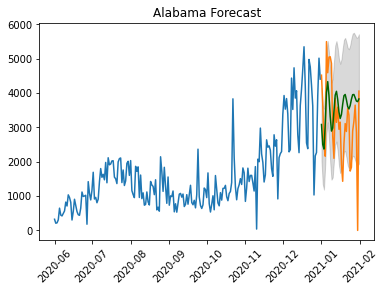

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.902 seconds
                               SARIMAX Results                              

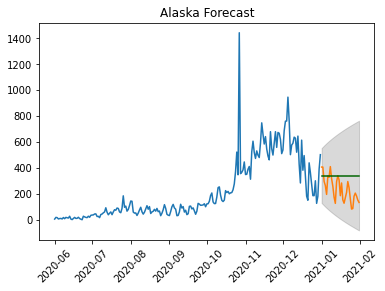

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

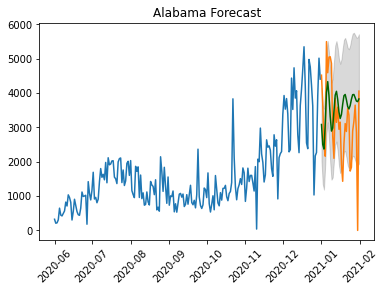

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.907 seconds
                               SARIMAX Results                              

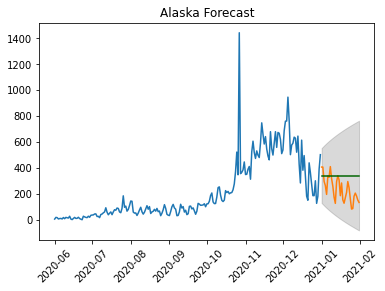

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

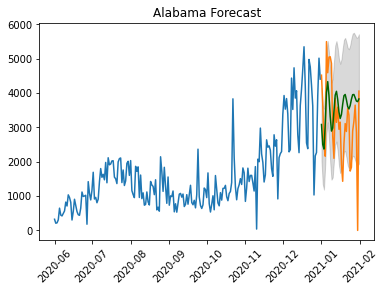

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.883 seconds
                               SARIMAX Results                              

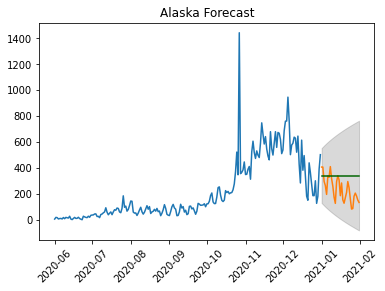

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

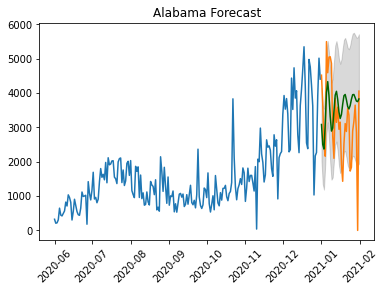

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.907 seconds
                               SARIMAX Results                              

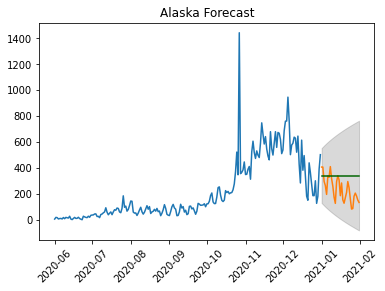

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.47 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

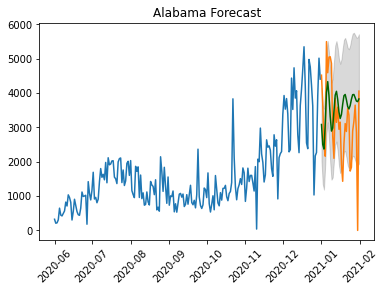

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.864 seconds
                               SARIMAX Results                              

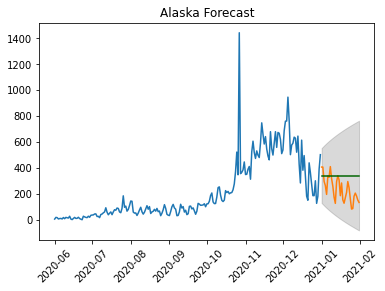

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.76 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

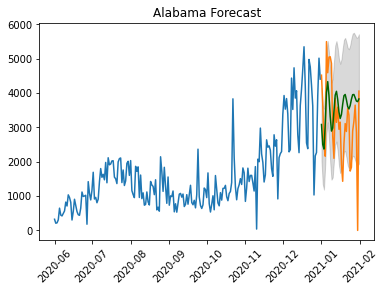

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.887 seconds
                               SARIMAX Results                              

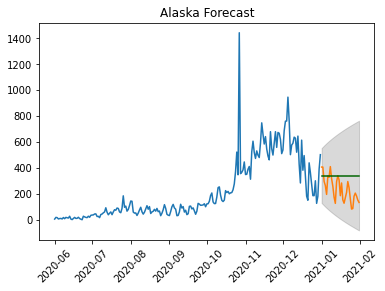

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.68 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

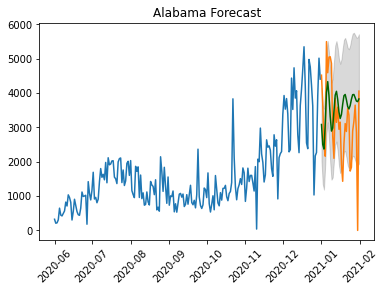

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.22 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.926 seconds
                               SARIMAX Results                              

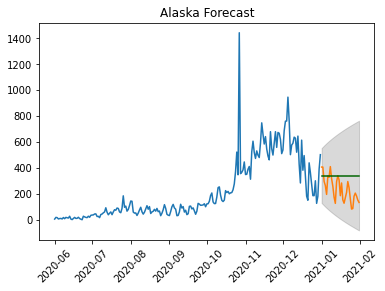

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

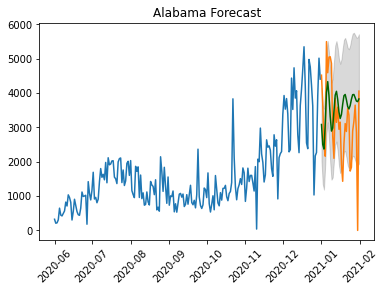

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.917 seconds
                               SARIMAX Results                              

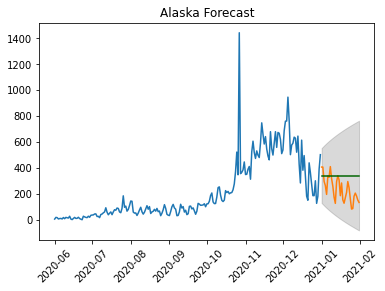

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.94 sec
 ARIMA

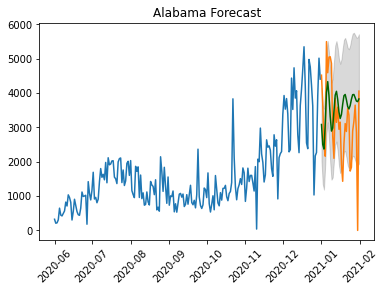

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.928 seconds
                               SARIMAX Results                              

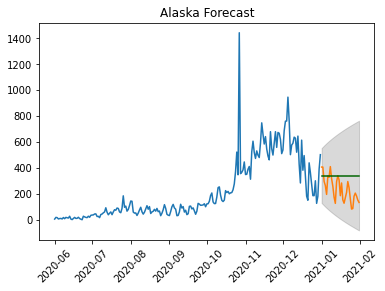

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

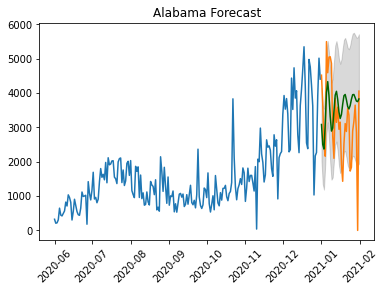

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.841 seconds
                               SARIMAX Results                              

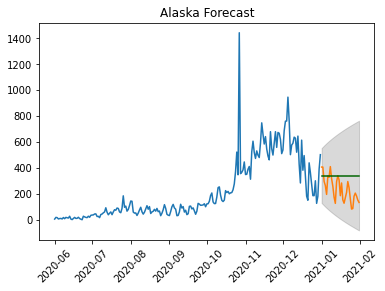

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.96 sec
 ARIMA

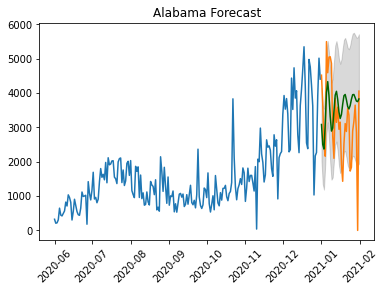

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.957 seconds
                               SARIMAX Results                              

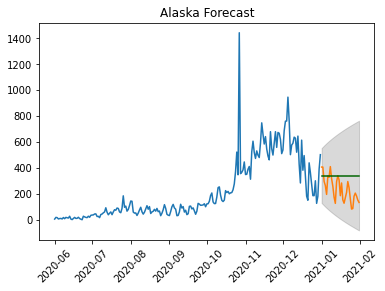

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

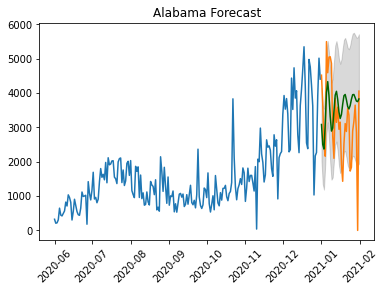

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.891 seconds
                               SARIMAX Results                              

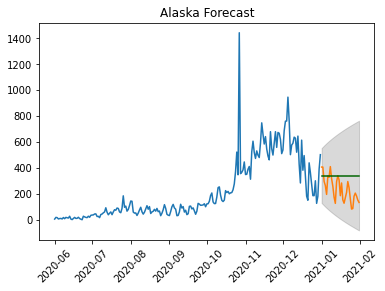

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=1.01 sec
 ARIMA

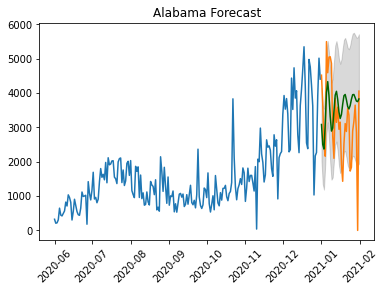

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.943 seconds
                               SARIMAX Results                              

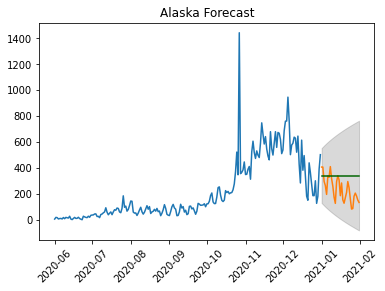

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

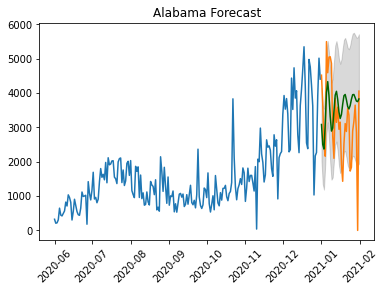

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.934 seconds
                               SARIMAX Results                              

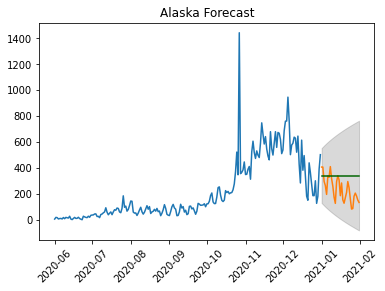

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

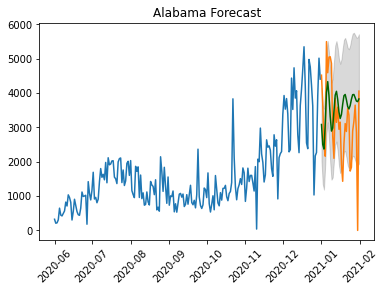

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.945 seconds
                               SARIMAX Results                              

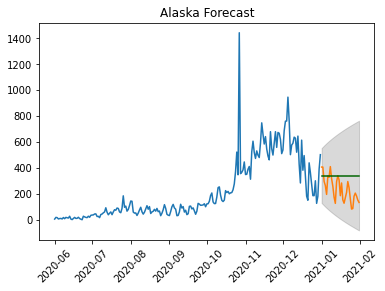

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.69 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.96 sec
 ARIMA

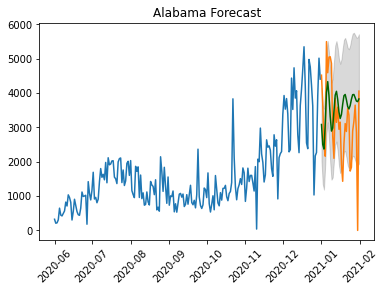

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.982 seconds
                               SARIMAX Results                              

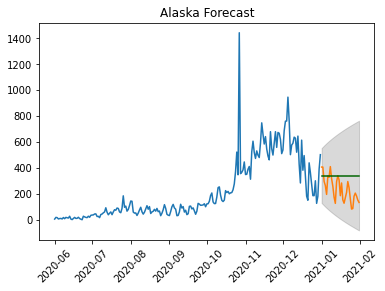

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

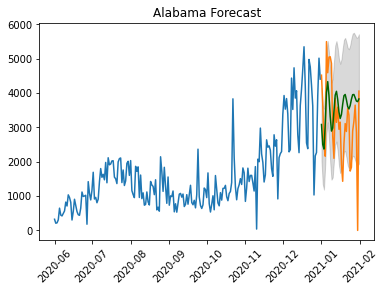

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.112 seconds
                               SARIMAX Results                              

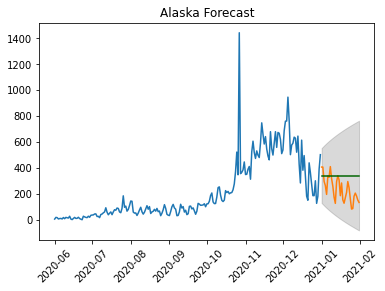

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.77 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

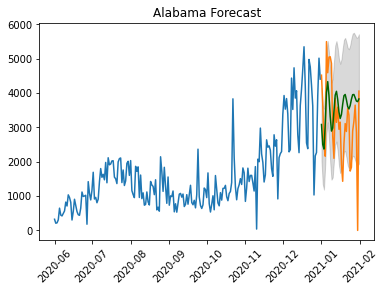

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.007 seconds
                               SARIMAX Results                              

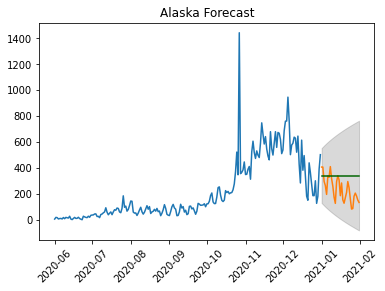

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

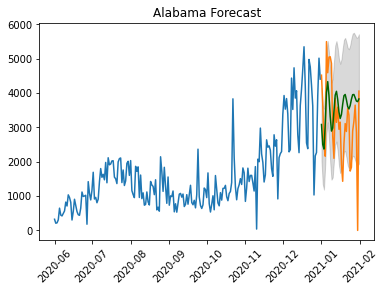

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.23 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.000 seconds
                               SARIMAX Results                              

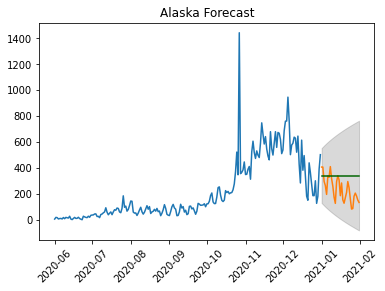

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.70 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.53 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=1.00 sec
 ARIMA

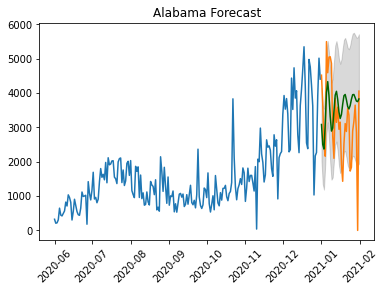

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.972 seconds
                               SARIMAX Results                              

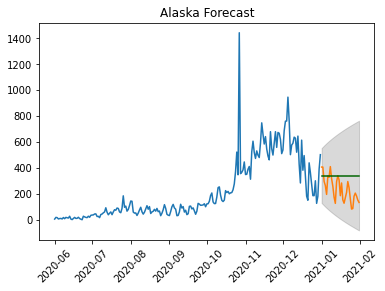

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.58 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.53 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.96 sec
 ARIMA

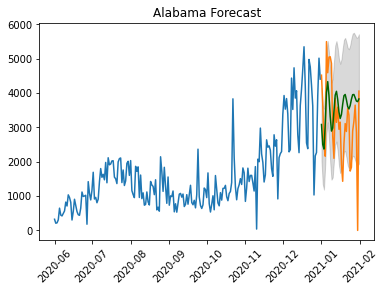

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.54 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.18 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.912 seconds
                               SARIMAX Results                              

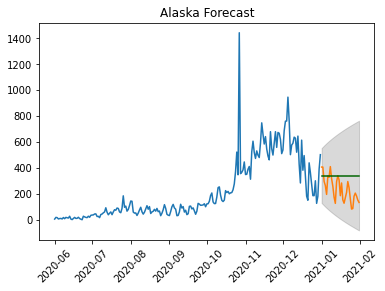

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.52 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

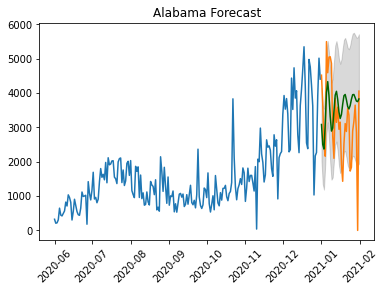

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.27 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.060 seconds
                               SARIMAX Results                              

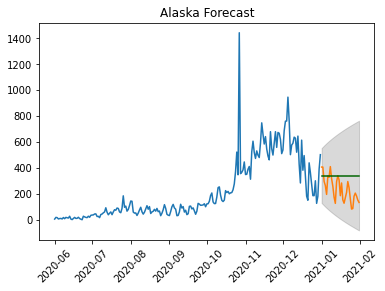

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

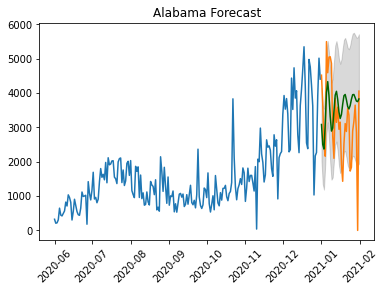

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.54 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.050 seconds
                               SARIMAX Results                              

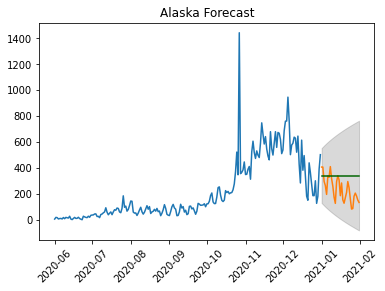

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.95 sec
 ARIMA

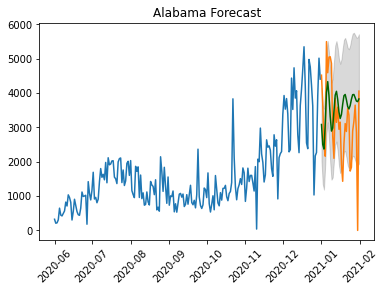

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.063 seconds
                               SARIMAX Results                              

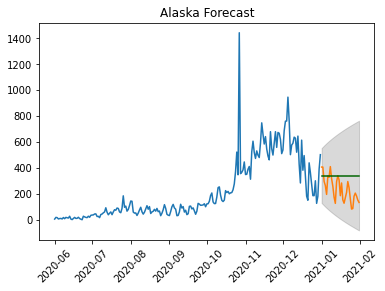

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.12 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.99 sec
 ARIMA

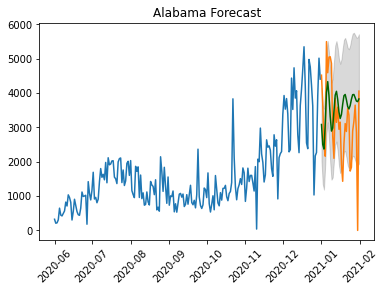

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.28 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.058 seconds
                               SARIMAX Results                              

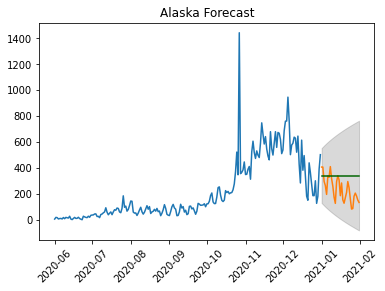

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.49 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.17 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

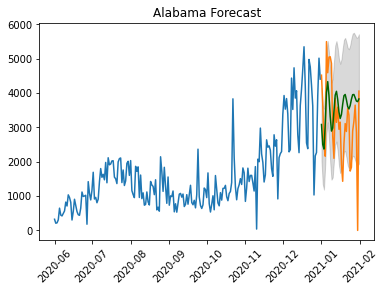

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.27 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.088 seconds
                               SARIMAX Results                              

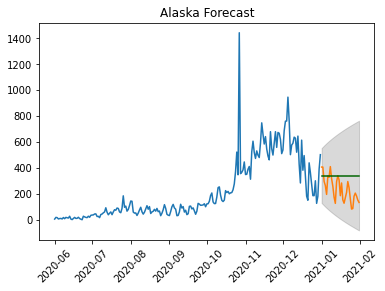

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.72 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

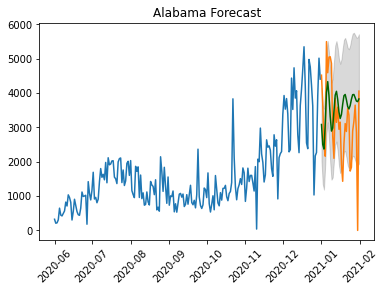

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.20 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.972 seconds
                               SARIMAX Results                              

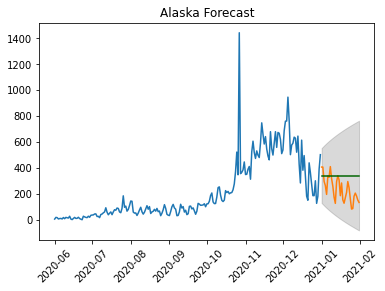

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.55 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.93 sec
 ARIMA

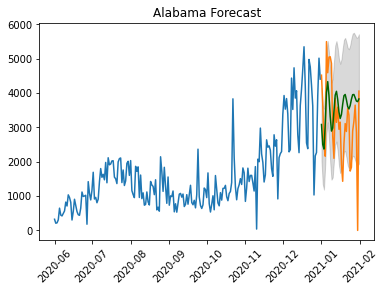

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.54 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.28 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.015 seconds
                               SARIMAX Results                              

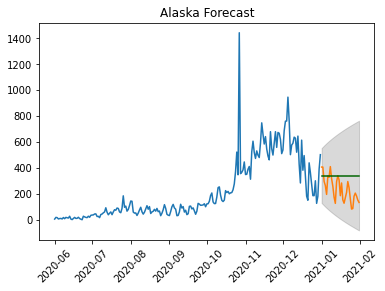

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=1.00 sec
 ARIMA

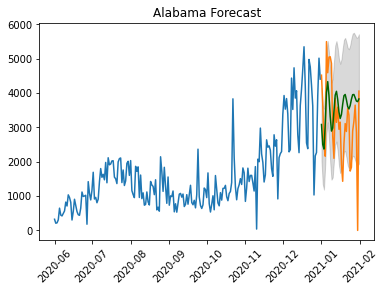

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.074 seconds
                               SARIMAX Results                              

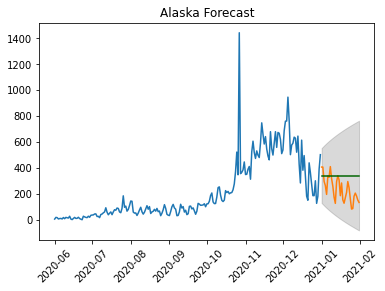

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.71 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.54 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

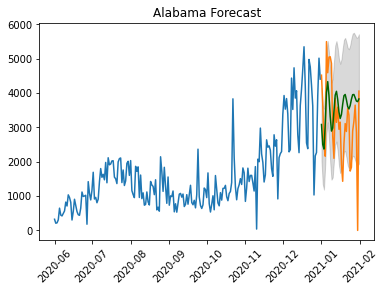

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.56 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.026 seconds
                               SARIMAX Results                              

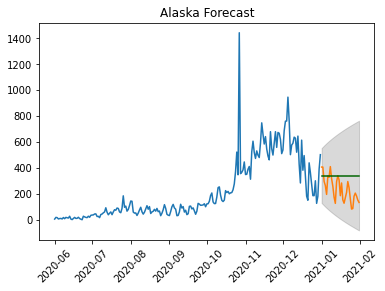

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.57 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.18 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

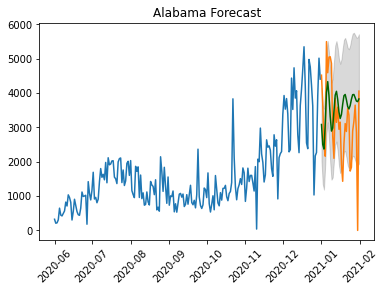

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.160 seconds
                               SARIMAX Results                              

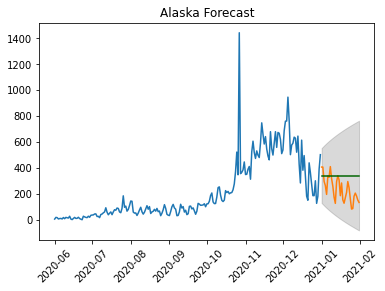

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.56 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=1.00 sec
 ARIMA

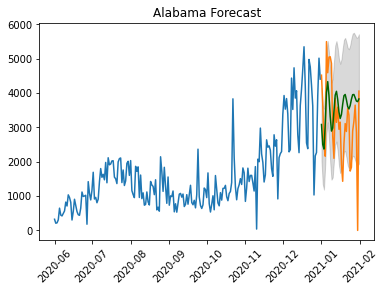

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.55 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.25 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.153 seconds
                               SARIMAX Results                              

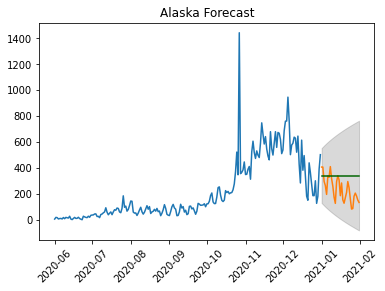

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.98 sec
 ARIMA

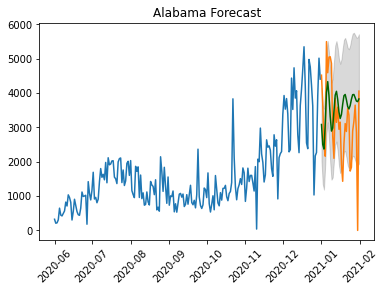

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.28 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.038 seconds
                               SARIMAX Results                              

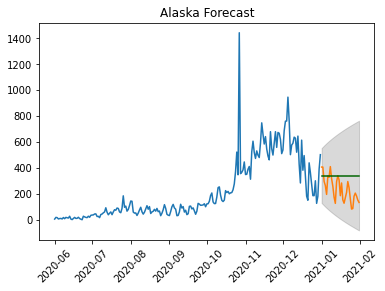

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.73 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.54 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

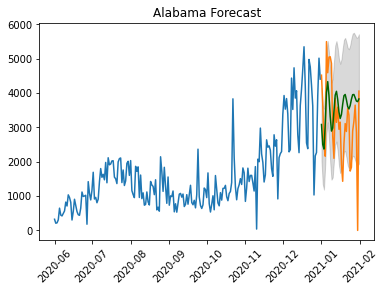

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.28 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.041 seconds
                               SARIMAX Results                              

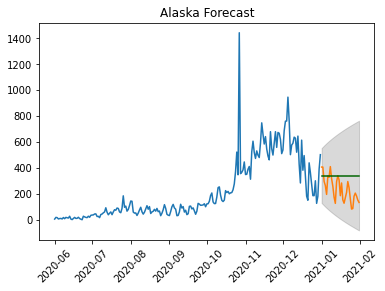

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.74 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.51 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.16 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=1.02 sec
 ARIMA

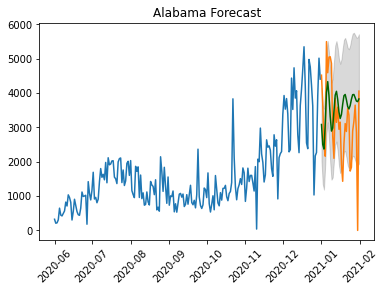

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 2.116 seconds
                               SARIMAX Results                              

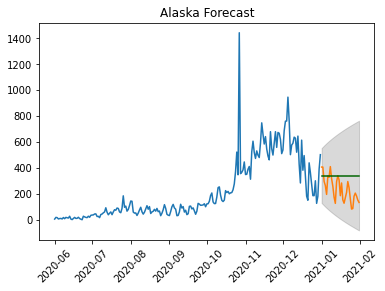

mape =  0.7480518934866981
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3329.330, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3382.558, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3370.983, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3350.214, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3380.733, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3328.890, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3369.997, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3314.518, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3357.260, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3305.739, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3336.099, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3295.287, Time=0.54 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3297.565, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=3295.658, Time=0.97 sec
 ARIMA

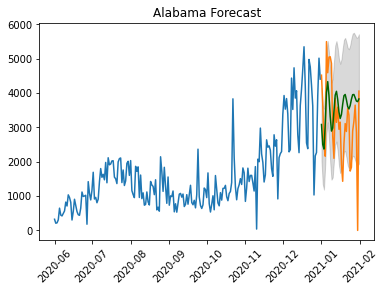

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning:

divide by zero encountered in true_divide



mape =  inf
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2605.811, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2677.575, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2630.237, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2604.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2675.645, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2605.848, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2608.081, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2602.599, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2604.296, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2604.328, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2628.396, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2606.158, Time=0.27 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.976 seconds
                               SARIMAX Results                              

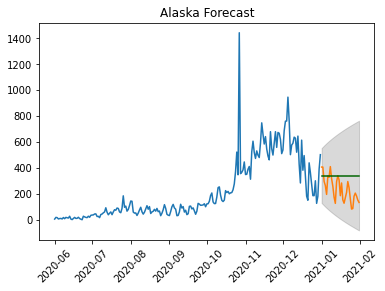

mape =  0.7480518934866981


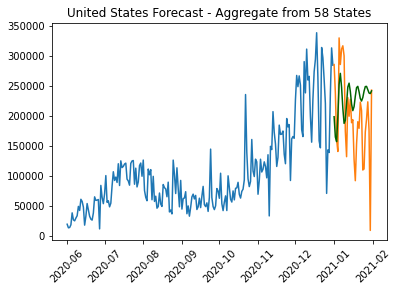

mape =  0.2854893626225911
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5085.822, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5126.022, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5115.418, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5096.882, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5124.228, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5082.026, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5113.046, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5068.508, Time=0.14 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5101.416, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5056.092, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5079.618, Time=0.16 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5044.345, Time=0.48 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=5046.970, Time=0.15 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=5043.409, Time=0.68 sec
 ARIMA

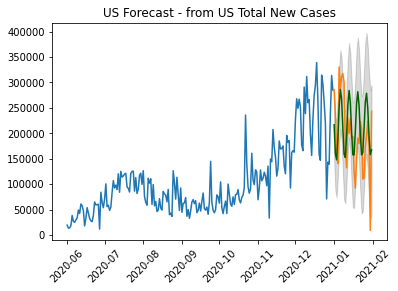

mape =  0.8576893411231767


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import pmdarima as pm
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

df = pd.read_csv('final_res_US.csv')
states = np.unique(df['States'])

# Set the training/validating time period
# Update Manually
n_of_train = 214            # Jun - Dec 2020
n_of_test = 31              # Jan 2021
n_of_unuse = 294 - n_of_train - n_of_test
test_start = '1/1/2021'

data = []
wholeUS  = pd.DataFrame(data, columns = ['Actual', 'Forecast']) 
wholeUS['Actual'] = [0] * n_of_test
wholeUS['Forecast'] = [0] * n_of_test

past = pd.DataFrame(data, columns = ['Past'])
past['Past'] = [0] * n_of_train
plt.locator_params(nbins=1, axis='both')

mape_output = pd.DataFrame(data, columns = ['States', 'MAPE']) 

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  
    mpe = np.mean((forecast - actual)/actual)   
    return(mape, mpe)

# Iterate each states to train the model and get the foreacast number for states
for i in range(len(states)): 
 for i in range(2): 
    state_df = df.loc[df['States'] == states[i]]
    state_df = state_df[['Date', 'New case']]
    state_df.set_index('Date', inplace=True)    
    state_df.index = (pd.date_range(start='4/13/2020', periods= len(state_df)))
    
    # Split the training / testing dataset
    tv = ['unuse']*n_of_unuse+['train']*n_of_train+ ['test']*n_of_test
    state_df['cat'] = tv
    
    # Data Noise Adjustment
    for j in range(len(state_df)):
        if state_df.iloc[j,0] > 0:
            pass        
        elif j < (len(state_df) - 2) and state_df.iloc[j,0] < 0:
            state_df.iloc[j,0] = (state_df.iloc[j-1,0] + state_df.iloc[j + 1,0])/2
        elif j < (len(state_df) - 2) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] != 0):
            state_df.iloc[j,0] = 0.5 * (state_df.iloc[j+1,0])
            state_df.iloc[j+1,0] = 0.5 * (state_df.iloc[j+1,0])       
        elif j < (len(state_df) - 3) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] == 0) and (state_df.iloc[j+2,0] != 0): 
                state_df.iloc[j,0] = 1/3 * (state_df.iloc[j+2,0])
                state_df.iloc[j+1,0] = 1/3 * (state_df.iloc[j+2,0])
                state_df.iloc[j+2,0] = 1/3 * (state_df.iloc[j+2,0])
        elif j < (len(state_df) - 3) and (state_df.iloc[j,0] == 0) and (state_df.iloc[j+1,0] == 0) and (state_df.iloc[j+2,0] == 0): 
                state_df.iloc[j,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+1,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+2,0] = 1/4 * (state_df.iloc[j+3,0])
                state_df.iloc[j+3,0] = 1/4 * (state_df.iloc[j+3,0])
                       
    train_df = state_df.loc[state_df['cat'] == 'train']
    test_df = state_df.loc[state_df['cat'] == 'test']
    
    # Apply Auto Arima Model
    model = pm.auto_arima(train_df['New case'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)
    print(model.summary())

    fc, confint = model.predict(n_periods=n_of_test, return_conf_int=True)
    # index_of_fc = np.arange(len(train_df['New case']), len(train_df['New case'])+n_periods)
    index_of_fc = pd.date_range(start=test_start, periods=n_of_test)
    
    # make series for plotting purpose
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
                                 
    plt.plot(train_df['New case'])
    plt.plot(test_df['New case'])
    plt.plot(fc_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)    
    plt.xticks(rotation=45)
    title = states[i]+ " Forecast"
    plt.title(title)
    plt.show() 

    mape, mpe = forecast_accuracy(fc, test_df['New case'].values)
    print('mape = ', mape)
    
    mape_output.loc[i] = [states[i], mape]
    wholeUS['Actual'] = wholeUS['Actual'] + test_df['New case'].values
    wholeUS['Forecast'] = wholeUS['Forecast'] + fc
    past['Past'] = past['Past'] + train_df['New case'].values

wholeUS.index = test_df.index
past.index = train_df.index

# ----------------------------------------------------------------------------------------
# US Forecasting (aggregate all the states)
# Plot US forecasting

plt.plot(past['Past'])
plt.plot(wholeUS['Actual'])
plt.plot(wholeUS['Forecast'], color='darkgreen')
plt.xticks(rotation=45)
plt.title("United States Forecast - Aggregate from 58 States")
plt.show() 

mape, mpe = forecast_accuracy(wholeUS['Actual'], wholeUS['Forecast'])
print('mape = ', mape)  

# ----------------------------------------------------------------------------------------
# US Forecasting (Not aggregate)

model2 = pm.auto_arima(past['Past'], start_p=1, start_q=1,test='adf',max_p=5, max_q=5, m=1,d=None,seasonal=False,  start_P=0,  D=0,  trace=True, error_action='ignore',   suppress_warnings=True,  stepwise=True)

fc, confint = model2.predict(n_periods=n_of_test, return_conf_int=True)
index_of_fc = pd.date_range(start=test_start, periods=n_of_test)

fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(past['Past'])
plt.plot(wholeUS['Actual'])
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)
plt.xticks(rotation=45)
plt.title("US Forecast - from US Total New Cases")
plt.show()   

mape, mpe = forecast_accuracy(fc, wholeUS['Actual'].values)
print('mape = ', mape)  

mape_output.loc[(len(mape_output))] = ['US', mape]
mape_output.to_csv('US_MAPE.csv')





## Light GBM

In [ ]:
# home_dir = '/content/drive/MyDrive/Colab Notebooks/'

import pandas as pd
import numpy as np
import datetime

dat = pd.read_csv('owid-covid-data-2.csv')

dat = dat[dat['location'] != 'World'].reset_index(drop=True)

dat['date'] = dat['date'].apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d'))

required_columns = ['continent', 'location', 'date', 'new_cases', 
                    'reproduction_rate', 'new_tests', 'positive_rate', 'people_vaccinated', 'new_vaccinations', 
                    'stringency_index', 'population', 'population_density', 'median_age', 'aged_65_older', 'aged_70_older', 
                    'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
                    'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand', 'life_expectancy', 
                    'human_development_index']

dat = dat[[col for col in dat.columns if col in set(required_columns)]]

del dat['continent']

dat = dat.fillna(dat.median())

from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()

dat['location'] = encoder.fit_transform(dat['location'])

import lightgbm as lgb

test = dat[dat['date'] >= datetime.datetime(2021, 1, 1)].reset_index(drop=True)
train = dat[dat['date'] < datetime.datetime(2021, 1, 1)].reset_index(drop=True)
train_target = train.pop('new_cases')
test_target = test.pop('new_cases')

train_dates = train.pop('date')
test_dates = test.pop('date')

dtrain = lgb.Dataset(train, label=train_target)
dvalid = lgb.Dataset(test, label=test_target)

lgbreg = lgb.LGBMRegressor(
    num_leaves= 512,
    n_estimators=512,
    max_depth=9,
    learning_rate=0.064,
    subsample=0.85,
    colsample_bytree=0.85,
    boosting_type= "gbdt",
    reg_alpha=0.3,
    reg_lamdba=0.243
)

lgbreg.fit(train,train_target)

preds = lgbreg.predict(test)

from sklearn.metrics import r2_score, mean_absolute_error

def mean_absolute_percentage_error(y_true, forecast): 
    y_true, forecast = np.array(y_true), np.array(forecast)
    return np.mean(np.abs((y_true - forecast) / y_true)) * 100

print("r2 score: {}".format(r2_score(y_pred=preds, y_true=test_target)))
print("MAPE: {}".format(mean_absolute_percentage_error(y_true=test_target, forecast=preds)))
print("Mean absolute error: {}".format(mean_absolute_error(y_pred=preds, y_true=test_target)))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: FutureWarning:

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.



r2 score: 0.6450538663378216
MAPE: inf
Mean absolute error: 1042.2350422334787


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:65: RuntimeWarning:

divide by zero encountered in true_divide

